In [13]:
import numpy as np
import matplotlib.pyplot as plt
import random
from model_utils import *

In [14]:
train_X = np.loadtxt('train_x.csv', delimiter = ',')
train_Y = np.loadtxt('train_y.csv', delimiter = ',').reshape(1, train_X.shape[1])

test_X = np.loadtxt('test_x.csv', delimiter = ',')
test_Y = np.loadtxt('test_y.csv', delimiter = ',').reshape(1, test_X.shape[1])

In [15]:
print("Shape of train_X : ", train_X.shape)
print("Shape of train_Y : ", train_Y.shape)
print("Shape of test_X : ", test_X.shape)
print("Shape of test_Y : ", test_Y.shape)

Shape of train_X :  (2, 211)
Shape of train_Y :  (1, 211)
Shape of test_X :  (2, 200)
Shape of test_Y :  (1, 200)


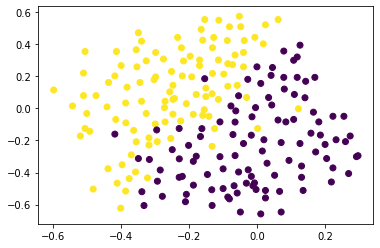

In [16]:
plt.scatter(train_X[0], train_X[1], c=train_Y[0])
plt.show()

# Model without Regularization

- Model layers like forward_propagation, cost_function, backward_propagation, update_parameters are imported from model_utils

In [17]:
def model(X, Y, layers_dims, learning_rate = 0.3, num_iterations = 30000):

    grads = {}
    cost_list = []                            
    m = X.shape[1]                        
    
    parameters = initialize_parameters(layers_dims)

    for i in range(0, num_iterations):

        a3, cache = forward_propagation(X, parameters)
    
        cost = cost_function(a3, Y)

        grads = backward_propagation(X, Y, cache)
        
        parameters = update_parameters(parameters, grads, learning_rate)
        
        if (i%1000 == 0):
            print("Cost after iteration ", i, " is : ", cost)
            cost_list.append(cost)
    
    # plot the cost
    plt.plot(cost_list)
    plt.ylabel('cost')
    plt.xlabel('iterations')
    plt.show()
    
    return parameters

Cost after iteration  0  is :  0.695492074816334
Cost after iteration  1000  is :  0.20184182115796884
Cost after iteration  2000  is :  0.18441223013086183
Cost after iteration  3000  is :  0.1713659461827603
Cost after iteration  4000  is :  0.1628485175150227
Cost after iteration  5000  is :  0.1548632017965827
Cost after iteration  6000  is :  0.1369036073556919
Cost after iteration  7000  is :  0.1080731607407049
Cost after iteration  8000  is :  0.1021947305257698
Cost after iteration  9000  is :  0.13796327259514501
Cost after iteration  10000  is :  0.0971150738786122
Cost after iteration  11000  is :  0.1650351686569813
Cost after iteration  12000  is :  nan
Cost after iteration  13000  is :  nan
Cost after iteration  14000  is :  nan
Cost after iteration  15000  is :  nan
Cost after iteration  16000  is :  nan
Cost after iteration  17000  is :  nan
Cost after iteration  18000  is :  nan
Cost after iteration  19000  is :  nan
Cost after iteration  20000  is :  nan


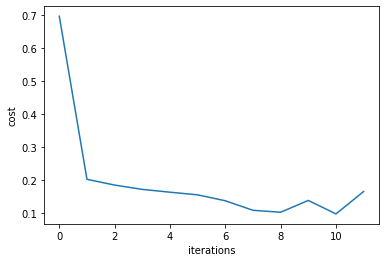

In [18]:
learning_rate = 0.3
num_iterations = 20000 + 1
layers_dims = [train_X.shape[0], 100, 10, 1]
parameters = model(train_X, train_Y, layers_dims, learning_rate, num_iterations)

Accuracy of the model on Train dataset is :  100.0 %
Accuracy of the model on Test dataset is :  92.5 %


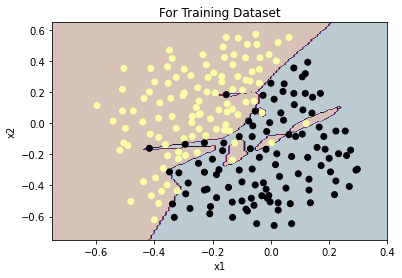

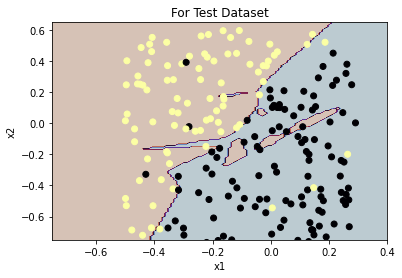

In [19]:
accuracy(train_X, train_Y, parameters, "Train")
accuracy(test_X, test_Y, parameters, "Test")

plt.title("For Training Dataset")
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)

plt.title("For Test Dataset")
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), test_X, test_Y)

# Dropout

## Forward Propagation
For every i in hidden layers

$D_i = np.random.rand(A_i.shape[0], A_i.shape[1]) $               
$D_i = D_i < keep\_rate                          $  
$A_i = A_i * D_i                               $    
$A_i = A_i / keep\_rate                     $


## Backward Propagation
For every i in hidden layers

$dA_i = dA_i * D_i    $          
$dA_i = dA_i / keep\_rate$

In [20]:
def forward_propagation_with_dropout(X, parameters, keep_rate):
    W1 = parameters["W1"]
    b1 = parameters["b1"]
    W2 = parameters["W2"]
    b2 = parameters["b2"]
    W3 = parameters["W3"]
    b3 = parameters["b3"]
    
    Z1 = np.dot(W1, X) + b1
    A1 = relu(Z1)
    
    D1 = np.random.rand(A1.shape[0], A1.shape[1])
    print('before keep rate',D1)
    D1 = D1 < keep_rate
    print('after keep rate',D1)
    A1 = A1 * D1
    A1 = A1/keep_rate
        
    Z2 = np.dot(W2, A1) + b2
    A2 = relu(Z2)
    
    D2 = np.random.rand(A2.shape[0], A2.shape[1])
    D2 = D2 < keep_rate
    A2 = A2 * D2
    A2 = A2/keep_rate
    
    Z3 = np.dot(W3, A2) + b3
    A3 = sigmoid(Z3)
    
    cache = (Z1, A1, D1, W1, b1, Z2, A2, D2, W2, b2, Z3, A3, W3, b3)
    
    return A3, cache


In [21]:
def backward_propagation_with_dropout(X, Y, cache, keep_rate):
    
    m = X.shape[1]
    (Z1, A1, D1, W1, b1, Z2, A2, D2, W2, b2, Z3, A3, W3, b3) = cache
    
    dZ3 = A3 - Y
    dW3 = 1./m * np.dot(dZ3, A2.T)
    db3 = 1./m * np.sum(dZ3, axis=1, keepdims = True)
    
    dA2 = np.dot(W3.T, dZ3)
    
    dA2 = dA2 * D2
    dA2 = dA2 / keep_rate
    
    dZ2 = np.multiply(dA2, np.int64(A2 > 0))
    dW2 = 1./m * np.dot(dZ2, A1.T)
    db2 = 1./m * np.sum(dZ2, axis=1, keepdims = True)
    
    dA1 = np.dot(W2.T, dZ2)
    
    
    dA1 = dA1 * D1
    dA1 = dA1 / keep_rate
    
    dZ1 = np.multiply(dA1, np.int64(A1 > 0))
    dW1 = 1./m * np.dot(dZ1, X.T)
    db1 = 1./m * np.sum(dZ1, axis=1, keepdims = True)
    
    gradients = {"dZ3": dZ3, "dW3": dW3, "db3": db3,
                 "dA2": dA2, "dZ2": dZ2, "dW2": dW2, "db2": db2,
                 "dA1": dA1, "dZ1": dZ1, "dW1": dW1, "db1": db1}
    
    return gradients

In [22]:
def model_with_dropout(X, Y, layers_dims, learning_rate = 0.3, num_iterations = 30000 , keep_rate = 0.85):

    grads = {}
    cost_list = []                            
    m = X.shape[1]                        
    
    parameters = initialize_parameters(layers_dims)

    for i in range(0, num_iterations):

        a3, cache = forward_propagation_with_dropout(X, parameters, keep_rate)
    
        cost = cost_function(a3, Y)

        grads = backward_propagation_with_dropout(X, Y, cache, keep_rate)
        
        parameters = update_parameters(parameters, grads, learning_rate)
        
        if (i%1000 == 0):
            print("Cost after iteration ", i, " is : ", cost)
            cost_list.append(cost)
    
    # plot the cost
    plt.plot(cost_list)
    plt.ylabel('cost')
    plt.xlabel('iterations')
    plt.show()
    
    return parameters

before keep rate [[0.51758649 0.99410668 0.18121075 ... 0.65430112 0.93056718 0.53792848]
 [0.09929811 0.38347446 0.30623292 ... 0.81767026 0.69631005 0.96827455]
 [0.17695195 0.6370239  0.40133423 ... 0.3474756  0.39514965 0.20744825]
 ...
 [0.09072928 0.73034493 0.51381753 ... 0.80358082 0.30561576 0.02289428]
 [0.41175595 0.73406455 0.92029479 ... 0.39390133 0.31497402 0.95426346]
 [0.79819256 0.62961193 0.86392652 ... 0.95768769 0.70326523 0.56656034]]
after keep rate [[ True False  True ... False False  True]
 [ True  True  True ... False False False]
 [ True False  True ...  True  True  True]
 ...
 [ True False  True ... False  True  True]
 [ True False False ...  True  True False]
 [False False False ... False False  True]]
Cost after iteration  0  is :  0.6962749897505071
before keep rate [[0.99140916 0.40495062 0.87430947 ... 0.84324848 0.86299446 0.96367255]
 [0.86935082 0.47240462 0.74148557 ... 0.1825386  0.99391162 0.34461558]
 [0.09677078 0.3591062  0.27742529 ... 0.03859

after keep rate [[False False  True ...  True False False]
 [False  True  True ...  True  True False]
 [ True  True  True ...  True  True  True]
 ...
 [False  True False ...  True  True  True]
 [ True False  True ...  True  True  True]
 [False  True  True ... False  True False]]
before keep rate [[0.66909529 0.33988902 0.73591694 ... 0.43837088 0.38416978 0.56477852]
 [0.55694177 0.00790409 0.01024424 ... 0.50924962 0.97582765 0.50741019]
 [0.31461063 0.74511222 0.46962647 ... 0.61379468 0.28752908 0.54859012]
 ...
 [0.00943501 0.81431928 0.21289765 ... 0.56456807 0.56651447 0.87425608]
 [0.33062985 0.18204866 0.6348518  ... 0.84010175 0.30618351 0.18672851]
 [0.30425821 0.81852009 0.90273677 ... 0.92209614 0.56995174 0.66414351]]
after keep rate [[False  True False ...  True  True  True]
 [ True  True  True ...  True False  True]
 [ True False  True ... False  True  True]
 ...
 [ True False  True ...  True  True False]
 [ True  True False ... False  True  True]
 [ True False False ...

before keep rate [[0.46877453 0.16257444 0.14504346 ... 0.35873114 0.27165299 0.22888466]
 [0.94920332 0.45642405 0.55498082 ... 0.2950169  0.07707682 0.31911106]
 [0.13200395 0.45167562 0.20554774 ... 0.12162298 0.60751815 0.56063346]
 ...
 [0.79132989 0.53615787 0.86227673 ... 0.85846774 0.70967087 0.23581806]
 [0.43068908 0.40718929 0.94236951 ... 0.31578811 0.19493967 0.77574387]
 [0.49449383 0.3740769  0.153874   ... 0.95956921 0.94837191 0.00852378]]
after keep rate [[ True  True  True ...  True  True  True]
 [False  True  True ...  True  True  True]
 [ True  True  True ...  True False  True]
 ...
 [False  True False ... False False  True]
 [ True  True False ...  True  True False]
 [ True  True  True ... False False  True]]
before keep rate [[0.95815528 0.5626781  0.6073292  ... 0.5699902  0.47328877 0.31154641]
 [0.38904027 0.94234304 0.80171637 ... 0.35144787 0.03971437 0.8063844 ]
 [0.25191984 0.05407151 0.3670664  ... 0.17317732 0.9069903  0.0244443 ]
 ...
 [0.69373486 0.060

before keep rate [[0.15156447 0.24538318 0.63640785 ... 0.6121044  0.01250426 0.42766523]
 [0.5530969  0.96244545 0.91140024 ... 0.90366262 0.90376926 0.85012389]
 [0.81769036 0.39551286 0.47511231 ... 0.10879211 0.21250401 0.84929239]
 ...
 [0.73526909 0.18830676 0.81307793 ... 0.40990401 0.25930734 0.95902157]
 [0.60958027 0.34828612 0.22603334 ... 0.56257685 0.57421336 0.19605334]
 [0.08504357 0.3332487  0.25817834 ... 0.9167208  0.71737549 0.80336207]]
after keep rate [[ True  True False ... False  True  True]
 [ True False False ... False False False]
 [False  True  True ...  True  True False]
 ...
 [False  True False ...  True  True False]
 [False  True  True ...  True  True  True]
 [ True  True  True ... False False False]]
before keep rate [[0.59377815 0.27159019 0.43820423 ... 0.29993188 0.60371753 0.03044042]
 [0.08786248 0.41537803 0.92332475 ... 0.52216609 0.49169944 0.40486956]
 [0.54638442 0.26146123 0.57502417 ... 0.39494766 0.39802962 0.92945894]
 ...
 [0.67430261 0.852

before keep rate [[0.09948728 0.17011233 0.85813589 ... 0.42482291 0.1669255  0.45450889]
 [0.60525496 0.90530117 0.793737   ... 0.7321862  0.56137167 0.99444465]
 [0.99901361 0.39188912 0.24482953 ... 0.35345318 0.25456168 0.0799122 ]
 ...
 [0.12776489 0.74152215 0.91007799 ... 0.29175343 0.65006762 0.23359679]
 [0.35516929 0.56449028 0.91018783 ... 0.84697749 0.80792465 0.53276145]
 [0.77148084 0.44020407 0.99056444 ... 0.58698208 0.49176978 0.53718896]]
after keep rate [[ True  True False ...  True  True  True]
 [False False False ... False  True False]
 [False  True  True ...  True  True  True]
 ...
 [ True False False ...  True False  True]
 [ True  True False ... False False  True]
 [False  True False ...  True  True  True]]
before keep rate [[2.45594447e-01 3.53728730e-01 5.21385701e-01 ... 4.59927118e-01
  7.60585990e-01 3.01863712e-01]
 [8.63690466e-01 6.50468178e-01 2.64808922e-01 ... 8.73872205e-01
  5.17734061e-01 1.91905408e-02]
 [6.94081748e-04 8.44559559e-01 4.31474973e-

before keep rate [[0.26363637 0.67035038 0.21226513 ... 0.68756621 0.73006469 0.60254743]
 [0.6417045  0.95569663 0.96856232 ... 0.5729552  0.67775544 0.64937054]
 [0.81484517 0.14846843 0.53210593 ... 0.59690757 0.16768816 0.89839636]
 ...
 [0.0183181  0.3203589  0.69319555 ... 0.58796497 0.50396446 0.42948151]
 [0.74611    0.82928238 0.57706819 ... 0.05198451 0.50984955 0.23665063]
 [0.59050429 0.54954353 0.9385279  ... 0.51798631 0.79252674 0.51342348]]
after keep rate [[ True False  True ... False False False]
 [False False False ...  True False False]
 [False  True  True ...  True  True False]
 ...
 [ True  True False ...  True  True  True]
 [False False  True ...  True  True  True]
 [ True  True False ...  True False  True]]
before keep rate [[0.26231333 0.67143702 0.79862987 ... 0.14077917 0.67052368 0.62380269]
 [0.67066697 0.54491705 0.8171477  ... 0.52352934 0.74966355 0.52458903]
 [0.95985396 0.72368516 0.41531891 ... 0.48578815 0.09271019 0.98626206]
 ...
 [0.84670464 0.917

before keep rate [[0.62541515 0.82881665 0.7989833  ... 0.42863828 0.73728752 0.26893662]
 [0.46890418 0.45737218 0.86263148 ... 0.29821339 0.07157436 0.27976232]
 [0.43259623 0.7892983  0.99872036 ... 0.46117588 0.24583424 0.4453075 ]
 ...
 [0.23149169 0.0293338  0.52685798 ... 0.6986241  0.43421333 0.75773034]
 [0.45845774 0.94317766 0.23784586 ... 0.61527514 0.73422312 0.30145234]
 [0.32653866 0.69557415 0.76856564 ... 0.40728783 0.01173188 0.07296492]]
after keep rate [[False False False ...  True False  True]
 [ True  True False ...  True  True  True]
 [ True False False ...  True  True  True]
 ...
 [ True  True  True ... False  True False]
 [ True False  True ... False False  True]
 [ True False False ...  True  True  True]]
before keep rate [[0.22736568 0.67031697 0.20550845 ... 0.80055471 0.72793487 0.18681651]
 [0.05201572 0.03206967 0.32823491 ... 0.79130782 0.10951467 0.3086413 ]
 [0.25189523 0.85569535 0.49654301 ... 0.40246099 0.72983866 0.52381494]
 ...
 [0.31749667 0.751

before keep rate [[0.84653106 0.05366306 0.71990046 ... 0.63929737 0.54148367 0.81716007]
 [0.75053223 0.65004064 0.74556791 ... 0.780606   0.26268631 0.14751857]
 [0.45528681 0.23572096 0.27397579 ... 0.94775373 0.55558494 0.15249312]
 ...
 [0.74363477 0.84691485 0.84769908 ... 0.33667965 0.27176452 0.32172799]
 [0.90786695 0.20583999 0.92191192 ... 0.78617628 0.15564137 0.80092492]
 [0.25402578 0.43315315 0.68559346 ... 0.28397351 0.1287713  0.44966191]]
after keep rate [[False  True False ... False  True False]
 [False False False ... False  True  True]
 [ True  True  True ... False  True  True]
 ...
 [False False False ...  True  True  True]
 [False  True False ... False  True False]
 [ True  True False ...  True  True  True]]
before keep rate [[0.24963945 0.85743252 0.40248689 ... 0.56175254 0.57923732 0.42350799]
 [0.12827272 0.79281233 0.83393873 ... 0.30905591 0.41359659 0.46477279]
 [0.38906046 0.34129472 0.744527   ... 0.75007936 0.77054035 0.81374959]
 ...
 [0.11811802 0.134

before keep rate [[0.27009383 0.38616009 0.11140758 ... 0.215521   0.66714662 0.04572736]
 [0.10776951 0.92260305 0.51029502 ... 0.39733104 0.41143684 0.20595312]
 [0.15896095 0.78864194 0.8203389  ... 0.45657017 0.05905454 0.31983668]
 ...
 [0.10383702 0.72548593 0.17080473 ... 0.40979905 0.57379257 0.27508284]
 [0.87366886 0.25261459 0.64785818 ... 0.09229907 0.78213781 0.40966348]
 [0.68263448 0.85691569 0.76358753 ... 0.87778477 0.54215149 0.24354988]]
after keep rate [[ True  True  True ...  True False  True]
 [ True False  True ...  True  True  True]
 [ True False False ...  True  True  True]
 ...
 [ True False  True ...  True  True  True]
 [False  True False ...  True False  True]
 [False False False ... False  True  True]]
before keep rate [[0.57304046 0.30913111 0.89822563 ... 0.1760938  0.66114453 0.55204404]
 [0.22310092 0.0612987  0.12596068 ... 0.7424285  0.45338086 0.22996519]
 [0.24804855 0.09636553 0.34193815 ... 0.0236624  0.67264671 0.70055769]
 ...
 [0.82845351 0.971

before keep rate [[0.43355851 0.84024768 0.16387145 ... 0.49628187 0.48592012 0.6533656 ]
 [0.94939527 0.78715128 0.80949113 ... 0.38709715 0.49725373 0.69170199]
 [0.80513364 0.68355089 0.66609205 ... 0.81714626 0.3221458  0.62105253]
 ...
 [0.64944519 0.27232359 0.63480871 ... 0.28675726 0.23260927 0.90700968]
 [0.81174152 0.69858587 0.1790776  ... 0.6636313  0.63881548 0.24019405]
 [0.32379059 0.53029703 0.25944768 ... 0.47712292 0.02836847 0.80978611]]
after keep rate [[ True False  True ...  True  True False]
 [False False False ...  True  True False]
 [False False False ... False  True False]
 ...
 [False  True False ...  True  True False]
 [False False  True ... False False  True]
 [ True  True  True ...  True  True False]]
before keep rate [[0.03915031 0.79227693 0.66919672 ... 0.1534501  0.76349932 0.35481329]
 [0.14940926 0.51057875 0.72308082 ... 0.79957792 0.10758751 0.02982578]
 [0.02008546 0.33212266 0.338113   ... 0.87933491 0.48128109 0.39576532]
 ...
 [0.63615892 0.126

before keep rate [[0.02146064 0.09374728 0.82106938 ... 0.58634144 0.51867429 0.60718237]
 [0.05417555 0.94359796 0.30369584 ... 0.39590824 0.99713132 0.78382897]
 [0.36284865 0.47267205 0.03137977 ... 0.6677047  0.3318722  0.12222974]
 ...
 [0.31161951 0.29196819 0.75870885 ... 0.71335062 0.85599403 0.2989054 ]
 [0.6779494  0.83032318 0.69826149 ... 0.77723142 0.0191205  0.71730519]
 [0.5921325  0.91942804 0.19536043 ... 0.99671814 0.01864627 0.80452071]]
after keep rate [[ True  True False ...  True  True False]
 [ True False  True ...  True False False]
 [ True  True  True ... False  True  True]
 ...
 [ True  True False ... False False  True]
 [False False False ... False  True False]
 [ True False  True ... False  True False]]
before keep rate [[0.17200739 0.6382527  0.14179899 ... 0.27865848 0.74404474 0.49617998]
 [0.90171415 0.18250853 0.19366694 ... 0.67287103 0.8808407  0.89676479]
 [0.94812953 0.7759823  0.29755407 ... 0.08868106 0.43526182 0.01764834]
 ...
 [0.05532963 0.754

before keep rate [[0.74761469 0.17687265 0.81395381 ... 0.89532858 0.3616561  0.26359058]
 [0.75592575 0.76139254 0.45782785 ... 0.13430157 0.31426393 0.49199648]
 [0.88890395 0.01836146 0.22258999 ... 0.92360021 0.79853634 0.01918891]
 ...
 [0.4952315  0.17835077 0.6076995  ... 0.19656133 0.91438012 0.29501663]
 [0.36924564 0.62512567 0.11887638 ... 0.30153701 0.19693718 0.45142046]
 [0.75494239 0.97598178 0.22742925 ... 0.28635757 0.78647094 0.82773853]]
after keep rate [[False  True False ... False  True  True]
 [False False  True ...  True  True  True]
 [False  True  True ... False False  True]
 ...
 [ True  True False ...  True False  True]
 [ True False  True ...  True  True  True]
 [False False  True ...  True False False]]
before keep rate [[0.07943804 0.99477721 0.37393193 ... 0.514851   0.18855796 0.60152037]
 [0.84871343 0.57967614 0.68394056 ... 0.12824769 0.87261471 0.14599306]
 [0.42185414 0.88668831 0.22807483 ... 0.3282197  0.94460991 0.09351533]
 ...
 [0.52688079 0.989

before keep rate [[0.45586198 0.18167878 0.82791179 ... 0.15348716 0.03314326 0.26598439]
 [0.26726292 0.93425251 0.46706066 ... 0.8036437  0.74330368 0.72439197]
 [0.25164493 0.52433454 0.2764379  ... 0.55448493 0.79906947 0.45055981]
 ...
 [0.2606931  0.05838253 0.64181657 ... 0.2478828  0.02353105 0.73774182]
 [0.3277478  0.8599467  0.6912803  ... 0.39198926 0.62108996 0.33410673]
 [0.18012767 0.51350168 0.74182437 ... 0.1761051  0.25914966 0.59293717]]
after keep rate [[ True  True False ...  True  True  True]
 [ True False  True ... False False False]
 [ True  True  True ...  True False  True]
 ...
 [ True  True False ...  True  True False]
 [ True False False ...  True False  True]
 [ True  True False ...  True  True  True]]
before keep rate [[0.19667015 0.9994673  0.50511381 ... 0.72923246 0.99201874 0.71265519]
 [0.38745484 0.19564273 0.91874356 ... 0.9667197  0.47732841 0.63194757]
 [0.74381686 0.22426341 0.35001627 ... 0.06626557 0.83684811 0.43680021]
 ...
 [0.49136151 0.532

after keep rate [[False  True  True ... False False  True]
 [ True False False ...  True False  True]
 [False False  True ...  True  True  True]
 ...
 [ True  True  True ...  True False  True]
 [ True  True  True ... False False False]
 [ True  True  True ...  True False  True]]
before keep rate [[0.70913554 0.35470222 0.93004521 ... 0.63878499 0.55330097 0.97300318]
 [0.48263719 0.91802771 0.70913088 ... 0.087541   0.98270521 0.19377704]
 [0.39819439 0.79222392 0.67936406 ... 0.76966341 0.61879411 0.23321472]
 ...
 [0.56934837 0.74717254 0.03088204 ... 0.70587701 0.28354627 0.87317983]
 [0.91339352 0.32160704 0.03741427 ... 0.87116886 0.20153263 0.32405497]
 [0.28383269 0.1431153  0.79606984 ... 0.22946174 0.3997666  0.03768848]]
after keep rate [[False  True False ... False  True False]
 [ True False False ...  True False  True]
 [ True False False ... False False  True]
 ...
 [ True False  True ... False  True False]
 [False  True  True ... False  True  True]
 [ True  True False ...

before keep rate [[0.17619727 0.90420818 0.52448271 ... 0.39561594 0.75991735 0.98800999]
 [0.16748788 0.17976234 0.84932856 ... 0.97886892 0.42418729 0.13193968]
 [0.37725734 0.33109567 0.19871129 ... 0.15204109 0.22422577 0.65539654]
 ...
 [0.20257431 0.51476907 0.46013119 ... 0.76975242 0.80771465 0.01852483]
 [0.08663157 0.29945931 0.38804913 ... 0.36414121 0.74186337 0.55024483]
 [0.41662273 0.9287367  0.77901126 ... 0.63872191 0.53658958 0.08089161]]
after keep rate [[ True False  True ...  True False False]
 [ True  True False ... False  True  True]
 [ True  True  True ...  True  True False]
 ...
 [ True  True  True ... False False  True]
 [ True  True  True ...  True False  True]
 [ True False False ... False  True  True]]
before keep rate [[0.939242   0.9021682  0.00262083 ... 0.26470308 0.91937863 0.77335139]
 [0.64164198 0.93114142 0.1652354  ... 0.20226922 0.04047653 0.1242431 ]
 [0.5434589  0.81644611 0.09888763 ... 0.25037504 0.92898156 0.99294266]
 ...
 [0.23388798 0.063

before keep rate [[0.72126201 0.69598769 0.30456826 ... 0.24052399 0.59311875 0.70638055]
 [0.662914   0.36347265 0.49000941 ... 0.80586662 0.99252379 0.44698224]
 [0.1672163  0.47496269 0.60252964 ... 0.35506725 0.3610448  0.81935966]
 ...
 [0.17939527 0.74526595 0.04675095 ... 0.56012829 0.67246879 0.66635881]
 [0.95186047 0.5111764  0.29404499 ... 0.31424169 0.1410331  0.26133591]
 [0.65108777 0.75099575 0.09543088 ... 0.38876638 0.18676504 0.37576871]]
after keep rate [[False False  True ...  True  True False]
 [False  True  True ... False False  True]
 [ True  True False ...  True  True False]
 ...
 [ True False  True ...  True False False]
 [False  True  True ...  True  True  True]
 [False False  True ...  True  True  True]]
before keep rate [[0.28587861 0.48309565 0.9244563  ... 0.53285236 0.16878496 0.03062388]
 [0.69534435 0.86325759 0.92099563 ... 0.5722451  0.96529915 0.254653  ]
 [0.90505469 0.73927159 0.68422258 ... 0.93562492 0.8206377  0.1579315 ]
 ...
 [0.64771266 0.036

before keep rate [[0.29139703 0.25910453 0.66604537 ... 0.12803891 0.27486364 0.26503709]
 [0.18041466 0.03287024 0.72157181 ... 0.62545975 0.78613453 0.30214013]
 [0.2228472  0.13770087 0.26306229 ... 0.58205663 0.20094011 0.65813171]
 ...
 [0.066439   0.53124005 0.14416388 ... 0.37600307 0.34018546 0.24442609]
 [0.21235641 0.41870523 0.37861795 ... 0.4385461  0.89943463 0.23472833]
 [0.23371739 0.97389419 0.32150463 ... 0.3792953  0.28732475 0.63373952]]
after keep rate [[ True  True False ...  True  True  True]
 [ True  True False ... False False  True]
 [ True  True  True ...  True  True False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True False  True]
 [ True False  True ...  True  True False]]
before keep rate [[0.62301379 0.58101771 0.38994594 ... 0.52280732 0.71599988 0.12412672]
 [0.30808932 0.84124143 0.68969578 ... 0.04547404 0.94333421 0.49197857]
 [0.78351266 0.73626042 0.88173341 ... 0.68940065 0.78152363 0.49057856]
 ...
 [0.23525621 0.019

before keep rate [[0.90410083 0.33457834 0.85562998 ... 0.96976305 0.94557829 0.47987326]
 [0.81268988 0.41283007 0.9952041  ... 0.48656929 0.01474656 0.04561221]
 [0.46093792 0.79548842 0.56839491 ... 0.72230057 0.41777129 0.13057981]
 ...
 [0.17615357 0.10225173 0.70998925 ... 0.04166814 0.82419345 0.5331888 ]
 [0.07998164 0.92089112 0.43878815 ... 0.30561335 0.06444794 0.67463897]
 [0.94578241 0.99051349 0.36900586 ... 0.42955538 0.6589486  0.46340701]]
after keep rate [[False  True False ... False False  True]
 [False  True False ...  True  True  True]
 [ True False  True ... False  True  True]
 ...
 [ True  True False ...  True False  True]
 [ True False  True ...  True  True False]
 [False False  True ...  True False  True]]
before keep rate [[0.66671798 0.15600215 0.51597921 ... 0.14996877 0.93650506 0.95523249]
 [0.86314428 0.47944675 0.84363422 ... 0.12177192 0.75519902 0.06009223]
 [0.548455   0.25532421 0.18629569 ... 0.54602792 0.04580202 0.19444955]
 ...
 [0.99406551 0.362

before keep rate [[0.31862574 0.27247915 0.47786342 ... 0.16484663 0.12291389 0.47592232]
 [0.50182462 0.84917453 0.9803275  ... 0.16862567 0.8833451  0.56447754]
 [0.49299105 0.30313947 0.39296362 ... 0.27378829 0.07579071 0.61777178]
 ...
 [0.00773036 0.97751278 0.68870893 ... 0.44702459 0.74825232 0.89927774]
 [0.24776044 0.22079231 0.28205701 ... 0.01413467 0.48190567 0.45285196]
 [0.07315826 0.39657959 0.7624965  ... 0.14804733 0.40847899 0.39789844]]
after keep rate [[ True  True  True ...  True  True  True]
 [ True False False ...  True False  True]
 [ True  True  True ...  True  True False]
 ...
 [ True False False ...  True False False]
 [ True  True  True ...  True  True  True]
 [ True  True False ...  True  True  True]]
before keep rate [[0.7125615  0.8116536  0.63918371 ... 0.61286907 0.45777126 0.83480905]
 [0.34819799 0.44932636 0.09464607 ... 0.9368519  0.86115633 0.72188248]
 [0.72704974 0.1704771  0.37930136 ... 0.55486197 0.8682621  0.03414661]
 ...
 [0.0153788  0.024

before keep rate [[0.05861326 0.16521658 0.40135676 ... 0.86188975 0.44225478 0.83421639]
 [0.13350223 0.37253744 0.7766275  ... 0.41235048 0.46673941 0.8743161 ]
 [0.17936095 0.81742707 0.81801682 ... 0.47677798 0.5142992  0.96269405]
 ...
 [0.09160368 0.01899534 0.98005515 ... 0.30589846 0.05408391 0.55751967]
 [0.51311402 0.21160413 0.74599778 ... 0.71859043 0.84263342 0.86468476]
 [0.392488   0.5261616  0.83022353 ... 0.6038321  0.54085197 0.88138944]]
after keep rate [[ True  True  True ... False  True False]
 [ True  True False ...  True  True False]
 [ True False False ...  True  True False]
 ...
 [ True  True False ...  True  True  True]
 [ True  True False ... False False False]
 [ True  True False ... False  True False]]
before keep rate [[0.83957762 0.37302639 0.33286317 ... 0.64807534 0.81989725 0.99313606]
 [0.05866557 0.24097137 0.63212943 ... 0.11961397 0.65721174 0.40018726]
 [0.03062785 0.33778402 0.90201153 ... 0.55156548 0.64501241 0.54008832]
 ...
 [0.93148183 0.145

before keep rate [[0.22211381 0.19200043 0.13911496 ... 0.32688302 0.5418037  0.30113463]
 [0.47980167 0.49718919 0.48647534 ... 0.49733668 0.1534061  0.42368203]
 [0.94252717 0.28916925 0.1798771  ... 0.02945807 0.28378434 0.7751772 ]
 ...
 [0.01827791 0.13868774 0.60475954 ... 0.90224208 0.33659151 0.33244978]
 [0.49511082 0.53635275 0.41280617 ... 0.906125   0.52212732 0.77044062]
 [0.78357737 0.95274391 0.85565765 ... 0.97687573 0.79395637 0.93382391]]
after keep rate [[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [False  True  True ...  True  True False]
 ...
 [ True  True False ... False  True  True]
 [ True  True  True ... False  True False]
 [False False False ... False False False]]
before keep rate [[0.14151575 0.17451674 0.96550707 ... 0.22826995 0.78802737 0.78275724]
 [0.19104739 0.67413291 0.24127186 ... 0.15017449 0.30613891 0.93291224]
 [0.9358806  0.96092547 0.06574185 ... 0.72010839 0.41683362 0.44077987]
 ...
 [0.00380265 0.733

before keep rate [[0.5156563  0.68915791 0.41119582 ... 0.41976906 0.70023463 0.93553633]
 [0.8563814  0.34353479 0.17534361 ... 0.00159979 0.64817999 0.57157312]
 [0.98969698 0.70873494 0.43664256 ... 0.74255731 0.22783261 0.12347444]
 ...
 [0.5008426  0.30120528 0.50281004 ... 0.79957751 0.44240563 0.73287909]
 [0.85708762 0.55643852 0.33086664 ... 0.22333338 0.44537272 0.33803684]
 [0.70575314 0.71452423 0.02462475 ... 0.18550888 0.47528994 0.5931074 ]]
after keep rate [[ True False  True ...  True False False]
 [False  True  True ...  True False  True]
 [False False  True ... False  True  True]
 ...
 [ True  True  True ... False  True False]
 [False  True  True ...  True  True  True]
 [False False  True ...  True  True  True]]
before keep rate [[0.79328803 0.01295852 0.65075788 ... 0.81660174 0.60073767 0.00954204]
 [0.9977975  0.75781152 0.18153264 ... 0.77742078 0.45520979 0.88828855]
 [0.50172491 0.08547757 0.77799639 ... 0.940524   0.44957594 0.26996872]
 ...
 [0.81211975 0.812

before keep rate [[0.52507101 0.19209872 0.77707914 ... 0.82718739 0.2731948  0.06571634]
 [0.88380031 0.27985245 0.43893007 ... 0.55660133 0.29162585 0.25498372]
 [0.49758331 0.78964505 0.28511388 ... 0.84879707 0.22211515 0.13295252]
 ...
 [0.86716616 0.73200836 0.98422086 ... 0.00808761 0.45329058 0.66485469]
 [0.4275582  0.3641311  0.83686242 ... 0.08870808 0.35742159 0.61828149]
 [0.67015586 0.78345105 0.53199419 ... 0.7017005  0.05384521 0.34381533]]
after keep rate [[ True  True False ... False  True  True]
 [False  True  True ...  True  True  True]
 [ True False  True ... False  True  True]
 ...
 [False False False ...  True  True False]
 [ True  True False ...  True  True False]
 [False False  True ... False  True  True]]
before keep rate [[0.44617966 0.49171978 0.56587409 ... 0.47249894 0.82171383 0.99611171]
 [0.64215253 0.57343617 0.84327206 ... 0.16862825 0.69135282 0.52286546]
 [0.97862086 0.24852427 0.61605713 ... 0.47998317 0.51053183 0.80514832]
 ...
 [0.61488281 0.576

before keep rate [[0.66282703 0.8841701  0.21298314 ... 0.8034711  0.59860489 0.08860031]
 [0.52632671 0.17833831 0.76863956 ... 0.54865886 0.81582251 0.514326  ]
 [0.87995536 0.6094447  0.49023562 ... 0.09034113 0.61665328 0.71002276]
 ...
 [0.69511169 0.26320967 0.74354065 ... 0.82348264 0.40266501 0.44788997]
 [0.77688696 0.63205772 0.01320932 ... 0.11596663 0.68515202 0.92681543]
 [0.63022474 0.3461817  0.22809304 ... 0.52683676 0.02097974 0.75005861]]
after keep rate [[False False  True ... False  True  True]
 [ True  True False ...  True False  True]
 [False False  True ...  True False False]
 ...
 [False  True False ... False  True  True]
 [False False  True ...  True False False]
 [False  True  True ...  True  True False]]
before keep rate [[0.47969919 0.60248003 0.7886635  ... 0.1187716  0.28307989 0.32824891]
 [0.22002511 0.9216298  0.33040205 ... 0.4669212  0.45266394 0.94845209]
 [0.26227087 0.16948142 0.65601224 ... 0.06921347 0.23662936 0.00533037]
 ...
 [0.94627469 0.002

before keep rate [[0.01006794 0.70401547 0.49915715 ... 0.99322511 0.61994902 0.37123088]
 [0.09231045 0.21435793 0.22425726 ... 0.39002922 0.26809587 0.19598518]
 [0.07562287 0.00598532 0.48723897 ... 0.57707799 0.30093263 0.62096495]
 ...
 [0.65239676 0.57977526 0.11716389 ... 0.77242427 0.8646764  0.28461582]
 [0.37643344 0.09158829 0.6613805  ... 0.32781417 0.22240741 0.50220962]
 [0.22224318 0.98389238 0.42345173 ... 0.51975713 0.06362117 0.54508655]]
after keep rate [[ True False  True ... False False  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True False]
 ...
 [False  True  True ... False False  True]
 [ True  True False ...  True  True  True]
 [ True False  True ...  True  True  True]]
before keep rate [[0.54949804 0.33668033 0.98916138 ... 0.41873036 0.25576609 0.86041692]
 [0.67060889 0.45674716 0.72141412 ... 0.08080825 0.23907218 0.80305624]
 [0.36009241 0.74859517 0.65266142 ... 0.82996444 0.59612377 0.92816048]
 ...
 [0.80110814 0.820

after keep rate [[False  True  True ... False False False]
 [False False  True ...  True False False]
 [ True  True False ... False  True  True]
 ...
 [ True False  True ... False  True  True]
 [ True  True False ... False False  True]
 [False  True  True ...  True  True False]]
before keep rate [[0.16264085 0.69430685 0.44826251 ... 0.67667919 0.42640575 0.67101222]
 [0.62700495 0.83813218 0.13701554 ... 0.48778012 0.98171506 0.73790363]
 [0.81840018 0.89708003 0.15347734 ... 0.4395699  0.57642103 0.21608251]
 ...
 [0.64975061 0.44209622 0.82652439 ... 0.91262432 0.40518661 0.5611633 ]
 [0.49438671 0.33123328 0.27918555 ... 0.25717887 0.51871306 0.27994549]
 [0.59903846 0.577538   0.41614008 ... 0.1198489  0.47388175 0.54541799]]
after keep rate [[ True False  True ... False  True False]
 [False False  True ...  True False False]
 [False False  True ...  True  True  True]
 ...
 [False  True False ... False  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...

before keep rate [[0.67621499 0.68967395 0.87803712 ... 0.16842041 0.53901958 0.43262386]
 [0.72403251 0.46257615 0.77738162 ... 0.19007824 0.59429314 0.96170489]
 [0.36803948 0.0934137  0.54989754 ... 0.87541421 0.24678814 0.65964607]
 ...
 [0.83706691 0.02745754 0.56412301 ... 0.97413112 0.95803241 0.62163797]
 [0.62539578 0.04766108 0.81634686 ... 0.50906347 0.0496228  0.75341196]
 [0.1838256  0.568039   0.90112096 ... 0.30930045 0.04257508 0.80078923]]
after keep rate [[False False False ...  True  True  True]
 [False  True False ...  True  True False]
 [ True  True  True ... False  True False]
 ...
 [False  True  True ... False False False]
 [False  True False ...  True  True False]
 [ True  True False ...  True  True False]]
before keep rate [[0.30773099 0.14850811 0.59822014 ... 0.43941658 0.56560437 0.38209422]
 [0.70429067 0.78500037 0.85080617 ... 0.49727209 0.1051627  0.1782588 ]
 [0.69647049 0.56130845 0.00309401 ... 0.32103568 0.28309009 0.09412417]
 ...
 [0.29334887 0.690

before keep rate [[0.14290306 0.93541527 0.24136851 ... 0.26515851 0.75128885 0.64450735]
 [0.79201216 0.41532796 0.65379008 ... 0.58344332 0.6015914  0.79104971]
 [0.14436135 0.06803164 0.9744741  ... 0.19472013 0.43165546 0.58591938]
 ...
 [0.5423276  0.22721169 0.44162122 ... 0.95286257 0.15401332 0.01423044]
 [0.93365709 0.32469269 0.93297776 ... 0.39691124 0.26134368 0.74166329]
 [0.38782613 0.12874148 0.29359541 ... 0.52539596 0.98929679 0.86804511]]
after keep rate [[ True False  True ...  True False False]
 [False  True False ...  True False False]
 [ True  True False ...  True  True  True]
 ...
 [ True  True  True ... False  True  True]
 [False  True False ...  True  True False]
 [ True  True  True ...  True False False]]
before keep rate [[0.73098505 0.08385329 0.74226406 ... 0.43148339 0.5045553  0.97278438]
 [0.70409109 0.79830157 0.78305351 ... 0.2802291  0.23898465 0.82104364]
 [0.50843932 0.34478887 0.12310985 ... 0.59281873 0.8808061  0.70366262]
 ...
 [0.2160515  0.106

before keep rate [[0.63332508 0.77345982 0.48631503 ... 0.91766242 0.5680038  0.64738793]
 [0.02578063 0.80588805 0.38668093 ... 0.63166552 0.8404179  0.52297771]
 [0.97422566 0.15015411 0.76514716 ... 0.89084421 0.71913574 0.99836227]
 ...
 [0.966394   0.22804283 0.45651822 ... 0.4674257  0.75562172 0.26398895]
 [0.39129774 0.41229324 0.61153474 ... 0.47967365 0.73981579 0.9920435 ]
 [0.86778679 0.31006564 0.89765188 ... 0.30767292 0.17489387 0.71016093]]
after keep rate [[False False  True ... False  True False]
 [ True False  True ... False False  True]
 [False  True False ... False False False]
 ...
 [False  True  True ...  True False  True]
 [ True  True False ...  True False False]
 [False  True False ...  True  True False]]
before keep rate [[0.83451823 0.39903124 0.57704563 ... 0.20151171 0.2914052  0.76756403]
 [0.36615451 0.75240362 0.23226567 ... 0.54414334 0.55113656 0.66835831]
 [0.26294718 0.97522361 0.65217612 ... 0.90483933 0.54810169 0.1435778 ]
 ...
 [0.06787475 0.675

before keep rate [[0.20416153 0.79842205 0.88957429 ... 0.34575893 0.82371218 0.04216923]
 [0.80589806 0.03172108 0.53774151 ... 0.80261024 0.08930758 0.59290728]
 [0.25301782 0.39058302 0.17799501 ... 0.32203015 0.57707774 0.79310868]
 ...
 [0.79976643 0.91885411 0.54279017 ... 0.41584171 0.31387646 0.42650798]
 [0.53203783 0.14317648 0.76869545 ... 0.69650373 0.77738301 0.32914072]
 [0.85622954 0.53304609 0.28092836 ... 0.19916637 0.44719814 0.136321  ]]
after keep rate [[ True False False ...  True False  True]
 [False  True  True ... False  True  True]
 [ True  True  True ...  True  True False]
 ...
 [False False  True ...  True  True  True]
 [ True  True False ... False False  True]
 [False  True  True ...  True  True  True]]
before keep rate [[0.89090217 0.2504642  0.84345145 ... 0.70459952 0.21266278 0.63849111]
 [0.55633519 0.2071948  0.63551377 ... 0.92592901 0.43942789 0.44713423]
 [0.92352901 0.30041519 0.08603148 ... 0.43436685 0.42579227 0.75784139]
 ...
 [0.92978267 0.058

before keep rate [[0.21404684 0.47138883 0.09899907 ... 0.04969016 0.76791906 0.31569619]
 [0.40194118 0.86269152 0.66732546 ... 0.16945561 0.18821818 0.99371117]
 [0.26326405 0.62379418 0.15052257 ... 0.88353158 0.61899713 0.09971566]
 ...
 [0.36840214 0.49815561 0.5658459  ... 0.43315088 0.31810708 0.01920001]
 [0.884131   0.63393817 0.72553817 ... 0.59642271 0.66727641 0.50836639]
 [0.21880944 0.31796003 0.2423488  ... 0.19538223 0.57436985 0.8524359 ]]
after keep rate [[ True  True  True ...  True False  True]
 [ True False False ...  True  True False]
 [ True False  True ... False False  True]
 ...
 [ True  True  True ...  True  True  True]
 [False False False ...  True False  True]
 [ True  True  True ...  True  True False]]
before keep rate [[0.99041842 0.16456459 0.25126498 ... 0.12384184 0.93361259 0.13166982]
 [0.04965101 0.30442532 0.42704086 ... 0.70715786 0.47124615 0.0845142 ]
 [0.49473651 0.48182761 0.17351099 ... 0.6770199  0.55427985 0.75225018]
 ...
 [0.31015062 0.727

before keep rate [[0.61172728 0.75949743 0.20843242 ... 0.62627523 0.33855378 0.76426012]
 [0.02508729 0.57356404 0.34921122 ... 0.72530169 0.14787173 0.15930349]
 [0.3159891  0.50414284 0.26691873 ... 0.53347446 0.09960268 0.38501348]
 ...
 [0.84537898 0.51902041 0.64999887 ... 0.28926345 0.40114994 0.65742873]
 [0.99473072 0.61121774 0.45718108 ... 0.83510399 0.04501914 0.24746849]
 [0.70520822 0.0611411  0.88829397 ... 0.03064109 0.06639561 0.85704524]]
after keep rate [[False False  True ... False  True False]
 [ True  True  True ... False  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [False  True False ...  True  True False]
 [False False  True ... False  True  True]
 [False  True False ...  True  True False]]
before keep rate [[0.89980341 0.04673311 0.87298022 ... 0.77573011 0.45923295 0.04415183]
 [0.83587377 0.0457018  0.9987932  ... 0.10093788 0.71529178 0.31251801]
 [0.61524756 0.62076429 0.23446945 ... 0.99553857 0.26601232 0.18795635]
 ...
 [0.69274812 0.733

before keep rate [[0.49631219 0.68378283 0.96054335 ... 0.03936901 0.65984923 0.3860478 ]
 [0.17262356 0.23416391 0.2158693  ... 0.22288498 0.11661862 0.24414384]
 [0.78917201 0.43190691 0.64576344 ... 0.27331984 0.47711656 0.38822101]
 ...
 [0.08649412 0.55752986 0.88492346 ... 0.4825457  0.59136652 0.10169438]
 [0.15284385 0.19915745 0.99453698 ... 0.46845183 0.29695678 0.4606132 ]
 [0.6244649  0.75308972 0.31954168 ... 0.92954598 0.67233179 0.46952693]]
after keep rate [[ True False False ...  True False  True]
 [ True  True  True ...  True  True  True]
 [False  True False ...  True  True  True]
 ...
 [ True  True False ...  True  True  True]
 [ True  True False ...  True  True  True]
 [False False  True ... False False  True]]
before keep rate [[0.97358898 0.12285294 0.07141693 ... 0.24576007 0.99110279 0.79456475]
 [0.11390562 0.48194379 0.24768691 ... 0.79569787 0.16872434 0.72532811]
 [0.90487003 0.93065655 0.18200247 ... 0.67723843 0.91698873 0.99330971]
 ...
 [0.97718257 0.643

before keep rate [[0.71526461 0.82576502 0.15934421 ... 0.68885792 0.7755635  0.82363457]
 [0.78480844 0.45613578 0.69817974 ... 0.13409687 0.75852824 0.07312131]
 [0.21967662 0.63293899 0.3910244  ... 0.47763875 0.72396305 0.09378443]
 ...
 [0.43788138 0.15435511 0.31061335 ... 0.6895363  0.26319673 0.67657758]
 [0.2113791  0.56075846 0.78830896 ... 0.26438308 0.53222771 0.44496376]
 [0.08902865 0.16112259 0.61614658 ... 0.67708048 0.1079214  0.18348937]]
after keep rate [[False False  True ... False False False]
 [False  True False ...  True False  True]
 [ True False  True ...  True False  True]
 ...
 [ True  True  True ... False  True False]
 [ True  True False ...  True  True  True]
 [ True  True False ... False  True  True]]
before keep rate [[0.79635681 0.18411695 0.98248853 ... 0.64232702 0.21254841 0.75499168]
 [0.87065968 0.0895149  0.27580842 ... 0.98990718 0.44448792 0.59085552]
 [0.37959469 0.12140004 0.89948978 ... 0.28077851 0.34694023 0.15094978]
 ...
 [0.89193599 0.589

before keep rate [[0.63350525 0.44470872 0.09850379 ... 0.41451971 0.95879932 0.64047143]
 [0.98641503 0.75250195 0.68933941 ... 0.19842411 0.68177578 0.68687899]
 [0.63468954 0.09264939 0.85618671 ... 0.10449735 0.11942481 0.4132817 ]
 ...
 [0.63802078 0.50065525 0.75627251 ... 0.83930643 0.82140348 0.33856273]
 [0.81686819 0.58090988 0.78692312 ... 0.90236041 0.34795935 0.76352872]
 [0.09496394 0.79236393 0.96696223 ... 0.86241162 0.34170322 0.79818377]]
after keep rate [[False  True  True ...  True False False]
 [False False False ...  True False False]
 [False  True False ...  True  True  True]
 ...
 [False  True False ... False False  True]
 [False  True False ... False  True False]
 [ True False False ... False  True False]]
before keep rate [[0.33723343 0.30070715 0.60041867 ... 0.42891704 0.48331576 0.63253954]
 [0.78895061 0.90326097 0.31257568 ... 0.785437   0.89151651 0.42456399]
 [0.90922594 0.85414421 0.08824653 ... 0.9833127  0.17349399 0.35830347]
 ...
 [0.33401707 0.592

before keep rate [[0.84272623 0.7131465  0.84225964 ... 0.56884161 0.31815933 0.73592985]
 [0.79900136 0.61433269 0.77864869 ... 0.86376727 0.53407232 0.06208662]
 [0.72136311 0.52234038 0.03960298 ... 0.01927723 0.07751771 0.54333817]
 ...
 [0.6462543  0.01032802 0.86040158 ... 0.72820111 0.46021009 0.77799473]
 [0.44786719 0.66835252 0.47904511 ... 0.89649605 0.67256665 0.23481591]
 [0.17010195 0.24423314 0.88656165 ... 0.09474108 0.19162479 0.44627329]]
after keep rate [[False False False ...  True  True False]
 [False False False ... False  True  True]
 [False  True  True ...  True  True  True]
 ...
 [False  True False ... False  True False]
 [ True False  True ... False False  True]
 [ True  True False ...  True  True  True]]
before keep rate [[0.57037674 0.79754589 0.73821762 ... 0.46658117 0.86053287 0.30280275]
 [0.06550356 0.88261413 0.47829201 ... 0.85007852 0.98935729 0.81975144]
 [0.15626998 0.6460162  0.93517711 ... 0.14297078 0.90969692 0.05114793]
 ...
 [0.40624694 0.080

before keep rate [[0.23584896 0.66093233 0.22884486 ... 0.29879417 0.12979774 0.31483763]
 [0.70360819 0.18475461 0.16418039 ... 0.31503848 0.12812377 0.83477617]
 [0.73913273 0.7574267  0.17418343 ... 0.65866465 0.49982308 0.08113104]
 ...
 [0.7641593  0.28779452 0.9342784  ... 0.5773429  0.73878374 0.14888485]
 [0.23399017 0.46933927 0.35237364 ... 0.6961555  0.18112049 0.45457599]
 [0.09875552 0.85283821 0.45330571 ... 0.48670898 0.6351045  0.3252601 ]]
after keep rate [[ True False  True ...  True  True  True]
 [False  True  True ...  True  True False]
 [False False  True ... False  True  True]
 ...
 [False  True False ...  True False  True]
 [ True  True  True ... False  True  True]
 [ True False  True ...  True False  True]]
before keep rate [[0.59770983 0.50245832 0.26713561 ... 0.3678833  0.30856156 0.75230777]
 [0.2531444  0.43664914 0.57425729 ... 0.61813979 0.37043511 0.10003747]
 [0.98505229 0.81407646 0.08403998 ... 0.73968802 0.90579902 0.99151786]
 ...
 [0.76999933 0.197

before keep rate [[0.83251855 0.80336594 0.0825589  ... 0.20240309 0.510076   0.7697602 ]
 [0.91865786 0.71816241 0.24321724 ... 0.34498713 0.9145623  0.63838023]
 [0.13003043 0.29715438 0.51787284 ... 0.211954   0.99966373 0.10540918]
 ...
 [0.98945107 0.36636332 0.51944689 ... 0.97230552 0.35651232 0.32734938]
 [0.27278547 0.21216513 0.42687496 ... 0.3482828  0.62001921 0.76074657]
 [0.51436965 0.50405551 0.52116995 ... 0.10352508 0.1234309  0.08097758]]
after keep rate [[False False  True ...  True  True False]
 [False False  True ...  True False False]
 [ True  True  True ...  True False  True]
 ...
 [False  True  True ... False  True  True]
 [ True  True  True ...  True False False]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.2128092  0.37881417 0.14362462 ... 0.34888202 0.19247842 0.69976946]
 [0.18252353 0.15275361 0.36467261 ... 0.96051966 0.16350546 0.76665414]
 [0.33216435 0.97897579 0.61130644 ... 0.21985225 0.95276839 0.3122483 ]
 ...
 [0.69648584 0.007

before keep rate [[0.94740743 0.37113656 0.6934041  ... 0.64145065 0.96856005 0.07681394]
 [0.30494637 0.06859532 0.59785274 ... 0.60278761 0.88156879 0.6048673 ]
 [0.77123449 0.99897609 0.00818237 ... 0.97918167 0.49404508 0.42746078]
 ...
 [0.63842732 0.81365481 0.33838161 ... 0.16445949 0.07485362 0.19438632]
 [0.25684825 0.61435275 0.45771241 ... 0.62588754 0.93100884 0.91705576]
 [0.98425206 0.91598777 0.27280773 ... 0.59329283 0.0618775  0.32985524]]
after keep rate [[False  True False ... False False  True]
 [ True  True  True ... False False False]
 [False False  True ... False  True  True]
 ...
 [False False  True ...  True  True  True]
 [ True False  True ... False False False]
 [False False  True ...  True  True  True]]
before keep rate [[0.59941937 0.80098398 0.57372131 ... 0.98762985 0.16264526 0.91922317]
 [0.38401942 0.45356721 0.5505567  ... 0.33083014 0.47059327 0.49140466]
 [0.24604962 0.98029646 0.52334472 ... 0.70248027 0.2919145  0.90269898]
 ...
 [0.32776439 0.959

before keep rate [[0.93016507 0.9132548  0.09356871 ... 0.37277383 0.11361875 0.06022332]
 [0.8147977  0.52653512 0.35299638 ... 0.05316666 0.05237009 0.59096905]
 [0.44367717 0.50944054 0.83041888 ... 0.60188367 0.81979344 0.40727803]
 ...
 [0.82265053 0.32021746 0.35844189 ... 0.01230759 0.36327852 0.87253862]
 [0.80617536 0.22368726 0.41819013 ... 0.20047837 0.59164828 0.84540716]
 [0.9864706  0.96446027 0.17585537 ... 0.32393079 0.59775224 0.37095999]]
after keep rate [[False False  True ...  True  True  True]
 [False  True  True ...  True  True  True]
 [ True  True False ... False False  True]
 ...
 [False  True  True ...  True  True False]
 [False  True  True ...  True  True False]
 [False False  True ...  True  True  True]]
before keep rate [[0.54555524 0.78485754 0.13435227 ... 0.12964948 0.45575707 0.8312316 ]
 [0.43731179 0.39973288 0.42377357 ... 0.38583802 0.60854313 0.84353331]
 [0.15849365 0.64641445 0.01914212 ... 0.31564805 0.35504191 0.70450839]
 ...
 [0.63823201 0.376

before keep rate [[0.14575136 0.9905213  0.20504992 ... 0.91574051 0.33063375 0.09930647]
 [0.30361132 0.6584337  0.16539146 ... 0.55656626 0.82309406 0.65675531]
 [0.81801055 0.93169776 0.66715315 ... 0.4748322  0.63158183 0.28729243]
 ...
 [0.8058384  0.73232161 0.91996732 ... 0.56042871 0.40264949 0.28108682]
 [0.76533066 0.86412792 0.42134274 ... 0.73673232 0.67366389 0.98717231]
 [0.03832994 0.80212968 0.97716362 ... 0.77032605 0.76284571 0.46491152]]
after keep rate [[ True False  True ... False  True  True]
 [ True False  True ...  True False False]
 [False False False ...  True False  True]
 ...
 [False False False ...  True  True  True]
 [False False  True ... False False False]
 [ True False False ... False False  True]]
before keep rate [[0.97522127 0.12964074 0.52467993 ... 0.65707074 0.77941523 0.00217082]
 [0.59619781 0.86053655 0.63620308 ... 0.42141142 0.64114911 0.46936081]
 [0.94894731 0.69269327 0.06814651 ... 0.71130195 0.9368593  0.3094112 ]
 ...
 [0.00138428 0.980

before keep rate [[0.9952078  0.93640255 0.09369622 ... 0.9568901  0.89120221 0.29827682]
 [0.28111764 0.60795677 0.15014771 ... 0.04952987 0.89891989 0.81356457]
 [0.81566736 0.14586469 0.68635336 ... 0.12280442 0.08630871 0.66230312]
 ...
 [0.38193322 0.38418353 0.67701996 ... 0.60143942 0.38191353 0.49080891]
 [0.66960731 0.44087838 0.46893225 ... 0.98388946 0.2268714  0.62239288]
 [0.790695   0.20684177 0.47038072 ... 0.70811104 0.54776233 0.67505106]]
after keep rate [[False False  True ... False False  True]
 [ True False  True ...  True False False]
 [False  True False ...  True  True False]
 ...
 [ True  True False ... False  True  True]
 [False  True  True ... False  True False]
 [False  True  True ... False  True False]]
before keep rate [[0.73831    0.60360558 0.58027868 ... 0.88041423 0.40550238 0.47659733]
 [0.50912235 0.80498172 0.31040223 ... 0.09737603 0.93230484 0.32920291]
 [0.29465901 0.03185383 0.53411646 ... 0.95421827 0.10820169 0.91036661]
 ...
 [0.80081484 0.180

before keep rate [[0.08940795 0.74459735 0.24040502 ... 0.62707289 0.13676039 0.85697232]
 [0.69722622 0.01872274 0.86449029 ... 0.9926535  0.52429319 0.28887815]
 [0.62267635 0.4960555  0.8517627  ... 0.64513174 0.75735897 0.74991233]
 ...
 [0.63215716 0.25732125 0.90843497 ... 0.25319851 0.99290786 0.95558541]
 [0.94624246 0.4510857  0.56099445 ... 0.33532095 0.45425319 0.76946419]
 [0.73560368 0.43033197 0.57511065 ... 0.461125   0.45000231 0.73317972]]
after keep rate [[ True False  True ... False  True False]
 [False  True False ... False  True  True]
 [False  True False ... False False False]
 ...
 [False  True False ...  True False False]
 [False  True  True ...  True  True False]
 [False  True  True ...  True  True False]]
before keep rate [[0.31016966 0.52167269 0.80220353 ... 0.6922972  0.38825385 0.49466272]
 [0.07165898 0.78287359 0.69947907 ... 0.44202081 0.85476682 0.7825828 ]
 [0.67986283 0.31700945 0.80439466 ... 0.52367519 0.34345311 0.02449749]
 ...
 [0.94992941 0.534

after keep rate [[False  True  True ...  True False False]
 [ True  True False ... False  True  True]
 [ True False False ...  True  True  True]
 ...
 [ True False False ... False  True  True]
 [ True  True  True ... False False  True]
 [False  True  True ... False  True  True]]
before keep rate [[0.68949647 0.91012844 0.11133656 ... 0.79014051 0.54324031 0.56314682]
 [0.74434274 0.89363824 0.93382151 ... 0.80538401 0.80295795 0.90117172]
 [0.84488861 0.15296727 0.6259641  ... 0.21207419 0.20901941 0.37097361]
 ...
 [0.09178034 0.66769925 0.86702537 ... 0.93294297 0.47340175 0.57453333]
 [0.60819446 0.76567066 0.47801368 ... 0.14472086 0.01694275 0.44874215]
 [0.10854872 0.70955369 0.0907243  ... 0.68834504 0.37122144 0.26281009]]
after keep rate [[False False  True ... False  True  True]
 [False False False ... False False False]
 [False  True False ...  True  True  True]
 ...
 [ True False False ... False  True  True]
 [False False  True ...  True  True  True]
 [ True False  True ...

before keep rate [[0.21594376 0.21277577 0.41143901 ... 0.30777704 0.55562319 0.77599091]
 [0.44038171 0.57434142 0.6795321  ... 0.08436123 0.7900417  0.96097493]
 [0.50392944 0.44134763 0.61096435 ... 0.84381194 0.53102002 0.5924153 ]
 ...
 [0.08083721 0.70348774 0.92618892 ... 0.40553351 0.09919971 0.79137835]
 [0.30082483 0.05851441 0.13018335 ... 0.14128202 0.8543512  0.30277949]
 [0.41333319 0.55128268 0.91167066 ... 0.5240679  0.96234936 0.86814107]]
after keep rate [[ True  True  True ...  True  True False]
 [ True  True False ...  True False False]
 [ True  True False ... False  True  True]
 ...
 [ True False False ...  True  True False]
 [ True  True  True ...  True False  True]
 [ True  True False ...  True False False]]
before keep rate [[0.28948772 0.09005355 0.33677468 ... 0.58436726 0.74672276 0.45560897]
 [0.3222567  0.27126043 0.34918769 ... 0.71136151 0.89958246 0.22826902]
 [0.50691692 0.16539766 0.1113611  ... 0.22363027 0.55296761 0.51189124]
 ...
 [0.49542845 0.236

before keep rate [[0.03639607 0.36848167 0.48840809 ... 0.02548559 0.7568958  0.62297157]
 [0.35787134 0.59781871 0.79825861 ... 0.32090137 0.88110128 0.27417935]
 [0.64989209 0.4331543  0.48771447 ... 0.18190464 0.65934142 0.23327837]
 ...
 [0.07101382 0.10167969 0.57694391 ... 0.5824762  0.21967876 0.89124324]
 [0.5358728  0.68056062 0.23266894 ... 0.03010142 0.26614016 0.05560113]
 [0.05574623 0.0047585  0.39571774 ... 0.81016997 0.16916593 0.95447695]]
after keep rate [[ True  True  True ...  True False False]
 [ True  True False ...  True False  True]
 [False  True  True ...  True False  True]
 ...
 [ True  True  True ...  True  True False]
 [ True False  True ...  True  True  True]
 [ True  True  True ... False  True False]]
before keep rate [[0.68749588 0.66549075 0.00563854 ... 0.07984942 0.98854809 0.46874866]
 [0.76042523 0.26186107 0.16726771 ... 0.0977414  0.932214   0.80834183]
 [0.53651181 0.88134481 0.24718468 ... 0.57387417 0.59702872 0.14516724]
 ...
 [0.65582561 0.492

before keep rate [[0.71989666 0.30486195 0.11620356 ... 0.43879257 0.53684728 0.38366315]
 [0.89094585 0.14928462 0.82431969 ... 0.2871655  0.66663282 0.43800077]
 [0.51778571 0.24578392 0.30412132 ... 0.559886   0.14297098 0.48137138]
 ...
 [0.26754528 0.6379145  0.24793593 ... 0.04480608 0.29833239 0.47991639]
 [0.86984828 0.02346563 0.81649045 ... 0.19932473 0.27691598 0.76516432]
 [0.00544868 0.24984322 0.29702078 ... 0.98274783 0.19986428 0.30104589]]
after keep rate [[False  True  True ...  True  True  True]
 [False  True False ...  True False  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True False  True ...  True  True  True]
 [False  True False ...  True  True False]
 [ True  True  True ... False  True  True]]
before keep rate [[0.03772321 0.60014684 0.96985292 ... 0.31876549 0.63542381 0.32658765]
 [0.49152577 0.2109422  0.95787446 ... 0.34869914 0.33291378 0.68037314]
 [0.33993199 0.78652297 0.6612075  ... 0.7173304  0.56699382 0.17567723]
 ...
 [0.8933304  0.109

after keep rate [[ True  True False ...  True  True  True]
 [False  True  True ...  True False  True]
 [False  True False ... False False  True]
 ...
 [ True  True False ... False  True  True]
 [ True  True  True ... False  True False]
 [ True False False ...  True  True False]]
before keep rate [[0.4314096  0.35182708 0.88194279 ... 0.76770616 0.79648281 0.9616682 ]
 [0.24008552 0.910872   0.191743   ... 0.2509466  0.92573427 0.69121864]
 [0.52260423 0.49917906 0.24466731 ... 0.496608   0.32090306 0.71915232]
 ...
 [0.1126132  0.79849194 0.23771405 ... 0.19464463 0.83003852 0.97051648]
 [0.36270069 0.72098407 0.66237383 ... 0.21848044 0.94913116 0.69043995]
 [0.14403334 0.46575982 0.6164296  ... 0.65820162 0.5119898  0.60496012]]
after keep rate [[ True  True False ... False False False]
 [ True False  True ...  True False False]
 [ True  True  True ...  True  True False]
 ...
 [ True False  True ...  True False False]
 [ True False False ...  True False False]
 [ True  True False ...

before keep rate [[0.19599372 0.82698578 0.30854624 ... 0.84048689 0.9018059  0.57231846]
 [0.08815215 0.80931791 0.0084187  ... 0.40867616 0.70159973 0.22303634]
 [0.34171766 0.48073271 0.25537884 ... 0.7219426  0.99286839 0.46251126]
 ...
 [0.0271553  0.2410621  0.81283886 ... 0.39791549 0.33723052 0.83760789]
 [0.14288103 0.69176648 0.78487708 ... 0.1098348  0.34961395 0.41997549]
 [0.12104267 0.73909567 0.57746711 ... 0.33007311 0.44984708 0.29763697]]
after keep rate [[ True False  True ... False False  True]
 [ True False  True ...  True False  True]
 [ True  True  True ... False False  True]
 ...
 [ True  True False ...  True  True False]
 [ True False False ...  True  True  True]
 [ True False  True ...  True  True  True]]
before keep rate [[0.31826699 0.91704038 0.39979741 ... 0.69206294 0.70126266 0.57242181]
 [0.88249305 0.78960065 0.0817383  ... 0.89984524 0.93653004 0.67678179]
 [0.97025358 0.81399122 0.73385475 ... 0.66073434 0.13546753 0.57756479]
 ...
 [0.24333753 0.815

before keep rate [[0.96857479 0.3106834  0.08212734 ... 0.63351992 0.59053003 0.62938593]
 [0.22692626 0.20197557 0.33118053 ... 0.7176648  0.94324554 0.20696141]
 [0.15880354 0.65643845 0.45194524 ... 0.99903348 0.25590207 0.29193629]
 ...
 [0.57085989 0.34719775 0.95236963 ... 0.65249342 0.94243754 0.38539908]
 [0.20148947 0.81608543 0.23010116 ... 0.29153709 0.5261447  0.40964857]
 [0.59267868 0.18042699 0.91831919 ... 0.81867275 0.89575452 0.60350409]]
after keep rate [[False  True  True ... False  True False]
 [ True  True  True ... False False  True]
 [ True False  True ... False  True  True]
 ...
 [ True  True False ... False False  True]
 [ True False  True ...  True  True  True]
 [ True  True False ... False False False]]
before keep rate [[0.22006978 0.2351602  0.4196083  ... 0.13800228 0.7138148  0.51780207]
 [0.76592105 0.84267411 0.83523372 ... 0.88164828 0.25860577 0.02713576]
 [0.50109179 0.15571907 0.76255257 ... 0.47798858 0.28055065 0.21081978]
 ...
 [0.98144031 0.470

before keep rate [[0.32995013 0.93767172 0.81744308 ... 0.57952971 0.62522106 0.0653346 ]
 [0.99247689 0.76287389 0.84717044 ... 0.36282194 0.38864436 0.19557904]
 [0.71660313 0.23650922 0.08851845 ... 0.35276386 0.63400315 0.41879708]
 ...
 [0.5325445  0.03371514 0.45607401 ... 0.47226894 0.09223281 0.56577604]
 [0.5377123  0.61423946 0.55038382 ... 0.0457249  0.96218245 0.68557446]
 [0.52385858 0.82674044 0.53428078 ... 0.28201445 0.60851634 0.10243436]]
after keep rate [[ True False False ...  True False  True]
 [False False False ...  True  True  True]
 [False  True  True ...  True False  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True False  True ...  True False False]
 [ True False  True ...  True False  True]]
before keep rate [[0.73460886 0.72077301 0.50070318 ... 0.10112481 0.25010248 0.1617569 ]
 [0.22816438 0.79182673 0.61693867 ... 0.41853426 0.83871241 0.4454871 ]
 [0.29087131 0.67503364 0.38905576 ... 0.79920469 0.30717126 0.22553212]
 ...
 [0.8928255  0.563

before keep rate [[0.68823232 0.75289571 0.14424659 ... 0.26129046 0.2027259  0.54060386]
 [0.92922721 0.42228294 0.19429737 ... 0.59021461 0.07951366 0.54641097]
 [0.12284175 0.66567275 0.08967804 ... 0.01021913 0.35504346 0.37925354]
 ...
 [0.94254558 0.52042211 0.60253284 ... 0.19152084 0.29493302 0.67359913]
 [0.50835499 0.32332742 0.79907362 ... 0.81732339 0.46790235 0.77847958]
 [0.52828581 0.41519309 0.30335028 ... 0.46110001 0.43555076 0.28973699]]
after keep rate [[False False  True ...  True  True  True]
 [False  True  True ...  True  True  True]
 [ True False  True ...  True  True  True]
 ...
 [False  True False ...  True  True False]
 [ True  True False ... False  True False]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.02673593 0.30795688 0.52671762 ... 0.27164021 0.81771276 0.17937007]
 [0.23956293 0.25994691 0.75321797 ... 0.75754153 0.8872275  0.39406897]
 [0.07407728 0.93381505 0.55430773 ... 0.12892639 0.44919272 0.50520945]
 ...
 [0.15696331 0.819

before keep rate [[0.89375305 0.51743094 0.02671865 ... 0.10695625 0.89886774 0.02382927]
 [0.08114686 0.3524924  0.2530696  ... 0.80823521 0.57804413 0.35236647]
 [0.49231232 0.79846148 0.08883594 ... 0.06636109 0.38690351 0.36810301]
 ...
 [0.76003777 0.16579794 0.7124595  ... 0.0730191  0.06679887 0.42936628]
 [0.72703486 0.97095898 0.71870577 ... 0.66022625 0.15643845 0.68499968]
 [0.73060539 0.67182319 0.96502571 ... 0.37551432 0.00767717 0.3397831 ]]
after keep rate [[False  True  True ...  True False  True]
 [ True  True  True ... False  True  True]
 [ True False  True ...  True  True  True]
 ...
 [False  True False ...  True  True  True]
 [False False False ... False  True False]
 [False False False ...  True  True  True]]
before keep rate [[0.74506295 0.29746345 0.16133032 ... 0.51867181 0.61720135 0.02195955]
 [0.26820345 0.61774242 0.4602723  ... 0.08234322 0.71843208 0.0097502 ]
 [0.82940751 0.38667076 0.51154288 ... 0.37335768 0.62471952 0.93816742]
 ...
 [0.05257375 0.448

before keep rate [[0.54078267 0.96193802 0.94212304 ... 0.09889327 0.35098851 0.6045429 ]
 [0.96507283 0.6140617  0.09660419 ... 0.69451114 0.38566338 0.59191964]
 [0.81125383 0.9330147  0.45529291 ... 0.85591461 0.99952745 0.70938982]
 ...
 [0.20562666 0.62666762 0.13225742 ... 0.60940223 0.61468697 0.63317338]
 [0.4984542  0.1421789  0.76892195 ... 0.43843392 0.47058234 0.25566835]
 [0.1657145  0.9156335  0.96384519 ... 0.17469683 0.83093954 0.96072514]]
after keep rate [[ True False False ...  True  True False]
 [False False  True ... False  True  True]
 [False False  True ... False False False]
 ...
 [ True False  True ... False False False]
 [ True  True False ...  True  True  True]
 [ True False False ...  True False False]]
before keep rate [[0.2733294  0.98592958 0.53944198 ... 0.03450105 0.34992429 0.41096126]
 [0.89235173 0.31455958 0.32201645 ... 0.15182227 0.75137958 0.31926734]
 [0.29719394 0.88992115 0.8549573  ... 0.77858889 0.76316397 0.65203529]
 ...
 [0.25003437 0.470

before keep rate [[0.45030156 0.91142476 0.2994533  ... 0.94709141 0.75942402 0.51511149]
 [0.17038068 0.89787398 0.53529109 ... 0.85125256 0.46858693 0.92852676]
 [0.31134012 0.65162467 0.29548528 ... 0.21991604 0.39166227 0.66311875]
 ...
 [0.14868757 0.43329584 0.93510544 ... 0.8831827  0.85758978 0.60422658]
 [0.66592054 0.1339842  0.65552366 ... 0.41505262 0.53186917 0.80034372]
 [0.43655856 0.2355859  0.30393409 ... 0.10424128 0.80733654 0.40727828]]
after keep rate [[ True False  True ... False False  True]
 [ True False  True ... False  True False]
 [ True False  True ...  True  True False]
 ...
 [ True  True False ... False False False]
 [False  True False ...  True  True False]
 [ True  True  True ...  True False  True]]
before keep rate [[0.27682411 0.50902249 0.3675238  ... 0.24174758 0.82266129 0.66346893]
 [0.81349222 0.58190073 0.67520322 ... 0.48973412 0.45892649 0.3316662 ]
 [0.80100257 0.38148583 0.94541629 ... 0.11670961 0.84590366 0.07286213]
 ...
 [0.49759227 0.572

before keep rate [[0.95546257 0.21853583 0.10836954 ... 0.79087292 0.77928817 0.67697438]
 [0.90880663 0.83956781 0.75295412 ... 0.42283836 0.24586981 0.21660777]
 [0.5585203  0.34670812 0.81054955 ... 0.17149369 0.22628191 0.11743199]
 ...
 [0.62822984 0.9038157  0.26047325 ... 0.93963502 0.40165056 0.61456653]
 [0.69977199 0.01223116 0.76351037 ... 0.65302644 0.72484005 0.94567721]
 [0.90357727 0.17145584 0.16338627 ... 0.2922528  0.83495403 0.42393678]]
after keep rate [[False  True  True ... False False False]
 [False False False ...  True  True  True]
 [ True  True False ...  True  True  True]
 ...
 [False False  True ... False  True False]
 [False  True False ... False False False]
 [False  True  True ...  True False  True]]
before keep rate [[0.9115384  0.6132704  0.62184174 ... 0.28362311 0.0016628  0.15769378]
 [0.12251093 0.34232672 0.15147827 ... 0.13903933 0.76564506 0.86355309]
 [0.09113521 0.12077253 0.53473594 ... 0.90958832 0.33800503 0.8277031 ]
 ...
 [0.35748668 0.939

before keep rate [[0.26764809 0.87297691 0.50730965 ... 0.23053392 0.57230145 0.69472609]
 [0.31914872 0.27584551 0.25473973 ... 0.26642569 0.85920728 0.56670682]
 [0.99815401 0.16941766 0.96413375 ... 0.61127246 0.22438922 0.43117041]
 ...
 [0.54508626 0.21891788 0.89733857 ... 0.54913902 0.06373955 0.96449829]
 [0.49080999 0.69374765 0.61352612 ... 0.41113325 0.2430255  0.10214395]
 [0.93408762 0.07890969 0.7861755  ... 0.95452915 0.62531059 0.47837647]]
after keep rate [[ True False  True ...  True  True False]
 [ True  True  True ...  True False  True]
 [False  True False ... False  True  True]
 ...
 [ True  True False ...  True  True False]
 [ True False False ...  True  True  True]
 [False  True False ... False False  True]]
before keep rate [[0.11332068 0.9208171  0.18507165 ... 0.26046977 0.24859187 0.21862102]
 [0.29483857 0.97943842 0.91517707 ... 0.89688871 0.88565567 0.50690994]
 [0.96444863 0.90300249 0.91381832 ... 0.01485237 0.74720237 0.01372668]
 ...
 [0.51364077 0.458

before keep rate [[0.24407397 0.98240692 0.35843299 ... 0.37556435 0.71196407 0.85778038]
 [0.47056935 0.55740211 0.56377736 ... 0.59750334 0.27085862 0.01458949]
 [0.99956582 0.01781977 0.55855535 ... 0.93554281 0.76344801 0.53738993]
 ...
 [0.81082963 0.7060994  0.98599106 ... 0.65611811 0.67666884 0.46104892]
 [0.5006278  0.49754864 0.33346496 ... 0.16944676 0.14720763 0.9498826 ]
 [0.50181965 0.60026681 0.51452647 ... 0.53832757 0.91262014 0.23290806]]
after keep rate [[ True False  True ...  True False False]
 [ True  True  True ...  True  True  True]
 [False  True  True ... False False  True]
 ...
 [False False False ... False False  True]
 [ True  True  True ...  True  True False]
 [ True False  True ...  True False  True]]
before keep rate [[0.36218382 0.31899308 0.02845465 ... 0.06882607 0.9329663  0.60204349]
 [0.77587542 0.76788441 0.30982997 ... 0.45065534 0.07558308 0.25607898]
 [0.31506418 0.13641772 0.01053434 ... 0.43945898 0.26936219 0.35291359]
 ...
 [0.70241238 0.088

before keep rate [[0.31210244 0.29246536 0.47548351 ... 0.06447944 0.23161874 0.89798717]
 [0.54528106 0.30839079 0.49233056 ... 0.84668901 0.84406614 0.49461894]
 [0.63128919 0.70650613 0.47275735 ... 0.18880116 0.52659985 0.56217871]
 ...
 [0.7731132  0.31494861 0.90373974 ... 0.23536216 0.74866907 0.92486994]
 [0.24109345 0.3940275  0.06009515 ... 0.14201478 0.18664375 0.05695712]
 [0.15443618 0.8816633  0.37052613 ... 0.34420498 0.25770536 0.39447218]]
after keep rate [[ True  True  True ...  True  True False]
 [ True  True  True ... False False  True]
 [False False  True ...  True  True  True]
 ...
 [False  True False ...  True False False]
 [ True  True  True ...  True  True  True]
 [ True False  True ...  True  True  True]]
before keep rate [[4.99890781e-01 1.14846185e-01 6.77127471e-01 ... 6.70166207e-02
  2.95819750e-01 8.09130754e-01]
 [4.11846744e-01 1.69399487e-01 2.04355877e-01 ... 9.21437159e-01
  5.15878327e-01 5.73289845e-01]
 [9.76526148e-02 2.56367059e-01 1.55415789e-

before keep rate [[0.79145679 0.92268678 0.32144044 ... 0.41620652 0.16678324 0.01924987]
 [0.24594497 0.83415694 0.18716091 ... 0.46639764 0.91630443 0.7342985 ]
 [0.39319067 0.7186217  0.34630066 ... 0.47947954 0.52089623 0.35292984]
 ...
 [0.97767691 0.85417785 0.63150916 ... 0.59298048 0.62662436 0.39304958]
 [0.50390644 0.68891987 0.49800828 ... 0.65698119 0.97956556 0.5680509 ]
 [0.32668691 0.31704484 0.23667875 ... 0.48367055 0.37998018 0.08109199]]
after keep rate [[False False  True ...  True  True  True]
 [ True False  True ...  True False False]
 [ True False  True ...  True  True  True]
 ...
 [False False False ...  True False  True]
 [ True False  True ... False False  True]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.79465799 0.7033893  0.91526651 ... 0.94335596 0.82645573 0.87621402]
 [0.74919399 0.07307686 0.02354216 ... 0.83835806 0.71271825 0.17009299]
 [0.71403869 0.61062059 0.57746728 ... 0.35284071 0.06682203 0.71460014]
 ...
 [0.85305818 0.629

before keep rate [[0.25687995 0.86357931 0.76093753 ... 0.51071416 0.23073652 0.48768391]
 [0.17120913 0.2516502  0.46205337 ... 0.36130882 0.24064343 0.65716667]
 [0.93904107 0.46315063 0.39820586 ... 0.87601874 0.33660553 0.09084925]
 ...
 [0.24546852 0.10438491 0.88537769 ... 0.5897384  0.3334448  0.04053444]
 [0.16042259 0.50382685 0.74199434 ... 0.8009369  0.15396121 0.19004968]
 [0.68842328 0.3992788  0.32411467 ... 0.62376881 0.61327779 0.66217079]]
after keep rate [[ True False False ...  True  True  True]
 [ True  True  True ...  True  True False]
 [False  True  True ... False  True  True]
 ...
 [ True  True False ...  True  True  True]
 [ True  True False ... False  True  True]
 [False  True  True ... False False False]]
before keep rate [[0.47331275 0.19346483 0.76674793 ... 0.81208068 0.46945451 0.54706799]
 [0.26309611 0.43399828 0.11234354 ... 0.58569105 0.01180296 0.62956175]
 [0.44742593 0.84132839 0.24541572 ... 0.07176149 0.98284615 0.73049884]
 ...
 [0.89905048 0.596

before keep rate [[0.71911327 0.54399498 0.64958553 ... 0.87642929 0.97455246 0.49031495]
 [0.82921294 0.96012637 0.24567588 ... 0.17166202 0.75479431 0.38394872]
 [0.65935254 0.6734633  0.17983368 ... 0.05651195 0.06978588 0.83666174]
 ...
 [0.25879444 0.99486292 0.99392692 ... 0.9716492  0.43964902 0.33872121]
 [0.77490953 0.68589829 0.6514968  ... 0.4996625  0.40722649 0.76405535]
 [0.46925761 0.86316831 0.59728268 ... 0.50177088 0.65730266 0.89703197]]
after keep rate [[False  True False ... False False  True]
 [False False  True ...  True False  True]
 [False False  True ...  True  True False]
 ...
 [ True False False ... False  True  True]
 [False False False ...  True  True False]
 [ True False  True ...  True False False]]
before keep rate [[0.61373492 0.65041689 0.9752515  ... 0.6933975  0.60851992 0.28986386]
 [0.93813333 0.11972552 0.66287972 ... 0.73477964 0.20153347 0.01137904]
 [0.05503147 0.21232119 0.02657838 ... 0.47585563 0.01296163 0.34236127]
 ...
 [0.68703767 0.960

before keep rate [[0.26972989 0.61616888 0.37001229 ... 0.93431413 0.71985275 0.48123424]
 [0.75743464 0.70023365 0.64145137 ... 0.3100221  0.95995967 0.36113977]
 [0.00179643 0.23976638 0.34147522 ... 0.39151125 0.99063911 0.83143949]
 ...
 [0.19058547 0.98362048 0.23845071 ... 0.39574383 0.83460515 0.1478922 ]
 [0.03950605 0.28851841 0.2136028  ... 0.18381363 0.95803864 0.70761238]
 [0.60004933 0.28271096 0.87421194 ... 0.3996406  0.76698608 0.55805899]]
after keep rate [[ True False  True ... False False  True]
 [False False False ...  True False  True]
 [ True  True  True ...  True False False]
 ...
 [ True False  True ...  True False  True]
 [ True  True  True ...  True False False]
 [False  True False ...  True False  True]]
before keep rate [[0.09038231 0.7814913  0.6801608  ... 0.82420671 0.67584533 0.4606293 ]
 [0.89387765 0.52098638 0.78714517 ... 0.21808903 0.96014519 0.66962977]
 [0.21397416 0.12728214 0.47588224 ... 0.08646573 0.16776966 0.6056242 ]
 ...
 [0.72166327 0.878

before keep rate [[1.97856664e-01 8.71219809e-01 3.23833007e-01 ... 2.06437321e-01
  6.80988205e-01 4.87431841e-02]
 [4.98118196e-01 2.10184497e-02 1.06729092e-01 ... 7.70445637e-01
  9.48657357e-01 4.68064486e-01]
 [3.78992619e-01 5.65189846e-01 6.77263433e-01 ... 3.91348079e-01
  6.11144748e-01 7.10841315e-01]
 ...
 [4.31159060e-01 3.06369169e-01 9.76580582e-01 ... 7.56283612e-01
  8.68471910e-01 5.26127007e-01]
 [8.46624705e-02 6.20451644e-01 6.74999398e-01 ... 1.02337571e-01
  8.98097438e-04 6.43575612e-01]
 [2.74213041e-01 6.68211748e-01 8.63132186e-01 ... 8.75839635e-01
  3.80076295e-01 5.80306378e-01]]
after keep rate [[ True False  True ...  True False  True]
 [ True  True  True ... False False  True]
 [ True  True False ...  True False False]
 ...
 [ True  True False ... False False  True]
 [ True False False ...  True  True False]
 [ True False False ... False  True  True]]
before keep rate [[0.20935254 0.18083324 0.11111175 ... 0.47201151 0.61583238 0.01544618]
 [0.01736813 

before keep rate [[0.22269856 0.59131558 0.20212632 ... 0.47074957 0.14409316 0.34976868]
 [0.78332786 0.37907503 0.7297875  ... 0.54992867 0.3716336  0.44529306]
 [0.4571832  0.20234913 0.92895896 ... 0.62798923 0.07745839 0.15887149]
 ...
 [0.32727722 0.0485512  0.6830766  ... 0.5840159  0.52053366 0.79965562]
 [0.60909725 0.65546546 0.0921094  ... 0.22408733 0.14323121 0.91337702]
 [0.85705602 0.6356679  0.82287604 ... 0.51666931 0.17723933 0.6080011 ]]
after keep rate [[ True  True  True ...  True  True  True]
 [False  True False ...  True  True  True]
 [ True  True False ... False  True  True]
 ...
 [ True  True False ...  True  True False]
 [False False  True ...  True  True False]
 [False False False ...  True  True False]]
before keep rate [[0.25310749 0.4563264  0.73745985 ... 0.10639871 0.76022287 0.76616218]
 [0.63983398 0.91492257 0.77419902 ... 0.18420153 0.86986426 0.35458593]
 [0.83413209 0.55391332 0.28460193 ... 0.58988355 0.38048892 0.58482366]
 ...
 [0.76919617 0.578

before keep rate [[0.95400203 0.51551829 0.5155939  ... 0.74657271 0.94360307 0.66324889]
 [0.02462535 0.40366425 0.45373006 ... 0.45236696 0.60350986 0.80935427]
 [0.22841696 0.4854248  0.47745236 ... 0.57577898 0.59170792 0.05394585]
 ...
 [0.80922426 0.99309949 0.41391348 ... 0.04290074 0.95368251 0.93666559]
 [0.08501738 0.96632545 0.43890965 ... 0.03438457 0.68657002 0.94952983]
 [0.58472157 0.96664079 0.89227835 ... 0.09511551 0.84217343 0.6787867 ]]
after keep rate [[False  True  True ... False False False]
 [ True  True  True ...  True False False]
 [ True  True  True ...  True  True  True]
 ...
 [False False  True ...  True False False]
 [ True False  True ...  True False False]
 [ True False False ...  True False False]]
before keep rate [[0.82725735 0.49954946 0.96666072 ... 0.19895352 0.8518635  0.70495445]
 [0.41411525 0.54839793 0.54254724 ... 0.57335756 0.06159085 0.24838034]
 [0.68843536 0.13281887 0.6631555  ... 0.35011026 0.21319819 0.93526547]
 ...
 [0.44687223 0.110

before keep rate [[0.43017974 0.63529915 0.64923155 ... 0.79262192 0.78215715 0.80575751]
 [0.11955477 0.22429423 0.63413299 ... 0.64372515 0.25793853 0.40424684]
 [0.90997413 0.94397445 0.27076949 ... 0.38706682 0.24497526 0.01227153]
 ...
 [0.80796908 0.93250843 0.38898755 ... 0.49793517 0.78063529 0.36202458]
 [0.31538541 0.90061668 0.54001208 ... 0.35110975 0.98935945 0.06330623]
 [0.41883416 0.81979152 0.58907185 ... 0.76823114 0.84679898 0.21248913]]
after keep rate [[ True False False ... False False False]
 [ True  True False ... False  True  True]
 [False False  True ...  True  True  True]
 ...
 [False False  True ...  True False  True]
 [ True False  True ...  True False  True]
 [ True False  True ... False False  True]]
before keep rate [[0.52837178 0.19259975 0.1454265  ... 0.76323826 0.65601812 0.08145304]
 [0.99313606 0.92841216 0.05387584 ... 0.97563556 0.40335376 0.68720425]
 [0.12698626 0.4714486  0.87404495 ... 0.6085984  0.37591238 0.79244401]
 ...
 [0.81723591 0.122

before keep rate [[0.70700754 0.50165775 0.75111043 ... 0.07142152 0.45958126 0.89074491]
 [0.21259242 0.5791994  0.22422355 ... 0.90102586 0.13853909 0.68245065]
 [0.91237826 0.14472382 0.73251483 ... 0.03537508 0.07660421 0.01075898]
 ...
 [0.53531959 0.04691305 0.75870131 ... 0.2703266  0.56384208 0.05813243]
 [0.83424748 0.97974107 0.63141519 ... 0.93884774 0.22800045 0.02874047]
 [0.13770087 0.39508758 0.81805888 ... 0.97488642 0.76913458 0.63116477]]
after keep rate [[False  True False ...  True  True False]
 [ True  True  True ... False  True False]
 [False  True False ...  True  True  True]
 ...
 [ True  True False ...  True  True  True]
 [False False False ... False  True  True]
 [ True  True False ... False False False]]
before keep rate [[0.63626135 0.89235225 0.32647136 ... 0.87596652 0.60209552 0.69541022]
 [0.89589616 0.24802041 0.93013598 ... 0.37314442 0.67154061 0.19943327]
 [0.63251043 0.0018921  0.6374249  ... 0.08995172 0.64882195 0.94675298]
 ...
 [0.31564991 0.865

before keep rate [[0.08744853 0.1039406  0.05967068 ... 0.16859527 0.69662116 0.73175365]
 [0.07647766 0.55267458 0.87440288 ... 0.51236545 0.79947196 0.04352494]
 [0.3278914  0.55176204 0.79528214 ... 0.85369577 0.45145644 0.957484  ]
 ...
 [0.90795772 0.15444562 0.92633639 ... 0.03653199 0.63764477 0.93604848]
 [0.78771902 0.76323857 0.91728403 ... 0.81743096 0.20996231 0.9471527 ]
 [0.395159   0.55451173 0.63911386 ... 0.68364002 0.94353437 0.26994274]]
after keep rate [[ True  True  True ...  True False False]
 [ True  True False ...  True False  True]
 [ True  True False ... False  True False]
 ...
 [False  True False ...  True False False]
 [False False False ... False  True False]
 [ True  True False ... False False  True]]
before keep rate [[0.0927654  0.08825079 0.04314179 ... 0.68277719 0.83888381 0.29894599]
 [0.69694912 0.82444606 0.95862924 ... 0.86214862 0.105582   0.20820951]
 [0.3952939  0.61182901 0.02229779 ... 0.68530006 0.24079798 0.08061659]
 ...
 [0.8500247  0.586

before keep rate [[0.49415571 0.1396624  0.66738039 ... 0.64539119 0.33091959 0.20326208]
 [0.30904574 0.17494412 0.11348574 ... 0.99560164 0.96491415 0.85297188]
 [0.4099867  0.05811214 0.15392558 ... 0.78305063 0.78195481 0.03361559]
 ...
 [0.09861619 0.23596165 0.82529548 ... 0.45232294 0.40201705 0.88189138]
 [0.58039333 0.37352025 0.02943811 ... 0.28647833 0.19392293 0.26891669]
 [0.819294   0.10497442 0.21285128 ... 0.4325774  0.2886535  0.37479993]]
after keep rate [[ True  True False ... False  True  True]
 [ True  True  True ... False False False]
 [ True  True  True ... False False  True]
 ...
 [ True  True False ...  True  True False]
 [ True  True  True ...  True  True  True]
 [False  True  True ...  True  True  True]]
before keep rate [[0.78571563 0.26535737 0.8901936  ... 0.659005   0.06464335 0.81923768]
 [0.27517643 0.37248582 0.1718987  ... 0.50740408 0.81253588 0.35804507]
 [0.27768185 0.22419763 0.55558961 ... 0.87805133 0.87893411 0.23972543]
 ...
 [0.39840617 0.022

before keep rate [[0.77621263 0.25224893 0.47064108 ... 0.81561944 0.18403293 0.36127036]
 [0.37171646 0.34264765 0.94574378 ... 0.5029674  0.3400876  0.94304004]
 [0.42650821 0.24282924 0.94053177 ... 0.82411377 0.51656256 0.51231068]
 ...
 [0.54458964 0.64699129 0.82505467 ... 0.1396753  0.8230498  0.75290314]
 [0.78272011 0.69870175 0.41709824 ... 0.6327657  0.47675313 0.00285414]
 [0.28457155 0.30118516 0.21268159 ... 0.31938259 0.84246061 0.46902016]]
after keep rate [[False  True  True ... False  True  True]
 [ True  True False ...  True  True False]
 [ True  True False ... False  True  True]
 ...
 [ True False False ...  True False False]
 [False False  True ... False  True  True]
 [ True  True  True ...  True False  True]]
before keep rate [[0.65687264 0.02902447 0.25191923 ... 0.74049679 0.75183413 0.62824641]
 [0.37203888 0.92878493 0.37402884 ... 0.13841456 0.60270455 0.5422801 ]
 [0.52962573 0.54568368 0.5585775  ... 0.47981732 0.70410326 0.02327367]
 ...
 [0.16491745 0.949

before keep rate [[0.28675479 0.38057097 0.23881083 ... 0.54825557 0.68733202 0.59728896]
 [0.71435973 0.08301745 0.73101424 ... 0.62880262 0.29076635 0.18096664]
 [0.21896629 0.34946199 0.10537569 ... 0.46593495 0.07293135 0.0166958 ]
 ...
 [0.09403454 0.93966888 0.84564682 ... 0.15379284 0.299362   0.67006441]
 [0.94397224 0.28338429 0.85918546 ... 0.45420317 0.39308995 0.62628972]
 [0.33265207 0.30739044 0.70057134 ... 0.29805187 0.04890981 0.97474731]]
after keep rate [[ True  True  True ...  True False  True]
 [False  True False ... False  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True False False ...  True  True False]
 [False  True False ...  True  True False]
 [ True  True False ...  True  True False]]
before keep rate [[7.18886576e-01 9.56440958e-01 9.10299936e-01 ... 2.80681184e-01
  6.23863514e-01 8.67539819e-01]
 [8.05316757e-01 4.68825432e-01 4.08410537e-01 ... 5.84329122e-01
  7.40551539e-01 7.33910036e-01]
 [8.49148041e-01 5.04596034e-01 4.48217601e-

before keep rate [[0.7137425  0.60301069 0.03514726 ... 0.76048285 0.15474475 0.99331402]
 [0.94638564 0.50632128 0.77577096 ... 0.57375504 0.04001519 0.3988654 ]
 [0.74170779 0.56931487 0.97242142 ... 0.5728049  0.24123089 0.23841294]
 ...
 [0.185205   0.4495837  0.27802446 ... 0.81093565 0.61035808 0.56444117]
 [0.76725163 0.19301265 0.08611039 ... 0.93674526 0.64111311 0.7747338 ]
 [0.36341519 0.18141572 0.11212027 ... 0.11052857 0.40900466 0.03699661]]
after keep rate [[False False  True ... False  True False]
 [False  True False ...  True  True  True]
 [False  True False ...  True  True  True]
 ...
 [ True  True  True ... False False  True]
 [False  True  True ... False False False]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.8046548  0.69550748 0.14778364 ... 0.7096458  0.93205002 0.67448011]
 [0.79903393 0.20212182 0.10144465 ... 0.53724629 0.33736442 0.91918089]
 [0.15062849 0.78783885 0.10497611 ... 0.94410751 0.73266482 0.9737267 ]
 ...
 [0.14164263 0.556

before keep rate [[0.63322143 0.01815359 0.32730293 ... 0.88994672 0.8643107  0.81278607]
 [0.91860134 0.2203243  0.12127387 ... 0.20917627 0.81632974 0.38355324]
 [0.08017608 0.56742433 0.24077924 ... 0.14636382 0.14504174 0.15926505]
 ...
 [0.65739034 0.43656439 0.22174925 ... 0.66103663 0.70294082 0.80461594]
 [0.1047397  0.49005731 0.41141546 ... 0.81086686 0.49289006 0.29682291]
 [0.75249412 0.09450259 0.93743671 ... 0.52122557 0.97415095 0.41747964]]
after keep rate [[False  True  True ... False False False]
 [False  True  True ...  True False  True]
 [ True  True  True ...  True  True  True]
 ...
 [False  True  True ... False False False]
 [ True  True  True ... False  True  True]
 [False  True False ...  True False  True]]
before keep rate [[0.31028459 0.87595003 0.61944991 ... 0.76201208 0.28309736 0.78458914]
 [0.01886962 0.56689932 0.95674274 ... 0.45705916 0.872589   0.62188573]
 [0.83029563 0.67973626 0.59854357 ... 0.74496987 0.91367234 0.86806858]
 ...
 [0.54781101 0.142

before keep rate [[0.10073215 0.38158943 0.40189755 ... 0.34444681 0.66762831 0.41360778]
 [0.72893615 0.60609307 0.42757748 ... 0.79554316 0.55039839 0.18704837]
 [0.34160534 0.48213321 0.30084791 ... 0.47110115 0.29742284 0.84448242]
 ...
 [0.01526834 0.47468428 0.94363105 ... 0.71950905 0.74057904 0.97192732]
 [0.3213478  0.34982627 0.7989622  ... 0.78051391 0.8948929  0.73241043]
 [0.08396132 0.37131213 0.90137967 ... 0.53852266 0.5540041  0.88338727]]
after keep rate [[ True  True  True ...  True False  True]
 [False False  True ... False  True  True]
 [ True  True  True ...  True  True False]
 ...
 [ True  True False ... False False False]
 [ True  True False ... False False False]
 [ True  True False ...  True  True False]]
before keep rate [[0.66182732 0.01486123 0.03567878 ... 0.09636008 0.4201374  0.51531051]
 [0.96266085 0.01007378 0.14410998 ... 0.97310528 0.4119145  0.77067573]
 [0.75710886 0.27871079 0.21089965 ... 0.09097984 0.7506705  0.53910603]
 ...
 [0.34832941 0.490

before keep rate [[0.03346138 0.75699747 0.78106086 ... 0.74217761 0.48601474 0.22531658]
 [0.00550685 0.66514969 0.82271025 ... 0.30826012 0.82573033 0.36371444]
 [0.13489309 0.35238573 0.72061327 ... 0.72200418 0.22381458 0.28380051]
 ...
 [0.80812164 0.68995539 0.12607824 ... 0.66673854 0.50944515 0.10028692]
 [0.48327998 0.83257044 0.5332866  ... 0.32870914 0.44633938 0.48622492]
 [0.57305319 0.20747128 0.04319718 ... 0.89092011 0.59053731 0.621736  ]]
after keep rate [[ True False False ... False  True  True]
 [ True False False ...  True False  True]
 [ True  True False ... False  True  True]
 ...
 [False False  True ... False  True  True]
 [ True False  True ...  True  True  True]
 [ True  True  True ... False  True False]]
before keep rate [[0.68078783 0.82921393 0.20801949 ... 0.56170445 0.5924793  0.75548162]
 [0.51492723 0.16142998 0.55144409 ... 0.43291934 0.59538949 0.70582616]
 [0.67918161 0.3782078  0.94053196 ... 0.24609048 0.48465696 0.09590594]
 ...
 [0.06708252 0.016

before keep rate [[0.23903038 0.07369179 0.16665261 ... 0.85632307 0.1783663  0.54010599]
 [0.51027249 0.21317704 0.87258726 ... 0.71408607 0.67919548 0.59044004]
 [0.29984485 0.93899501 0.60442264 ... 0.30523261 0.17220678 0.60289294]
 ...
 [0.91199091 0.19210969 0.97645407 ... 0.92977567 0.26175906 0.08223742]
 [0.75064218 0.46782972 0.39903216 ... 0.11803139 0.67971497 0.77967874]
 [0.42897699 0.30517677 0.53364884 ... 0.54340805 0.41768604 0.01934306]]
after keep rate [[ True  True  True ... False  True  True]
 [ True  True False ... False False  True]
 [ True False False ...  True  True False]
 ...
 [False  True False ... False  True  True]
 [False  True  True ...  True False False]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.58805489 0.51402001 0.31199264 ... 0.42322338 0.30883812 0.36598981]
 [0.83455489 0.19295399 0.5974248  ... 0.79702997 0.83359239 0.67713808]
 [0.41488339 0.11549508 0.65439287 ... 0.59037266 0.11772586 0.69461371]
 ...
 [0.79785275 0.296

before keep rate [[0.31549129 0.46905981 0.84141868 ... 0.40020104 0.80152865 0.54136831]
 [0.58609456 0.053283   0.7015452  ... 0.07560401 0.58262559 0.16491609]
 [0.75829012 0.984007   0.41744475 ... 0.48974398 0.67354389 0.78576134]
 ...
 [0.28056592 0.61412518 0.51017971 ... 0.61842899 0.35439421 0.15686064]
 [0.13554081 0.80325244 0.74600933 ... 0.17414874 0.66372419 0.22340066]
 [0.69372859 0.40059849 0.13516044 ... 0.17371021 0.58048043 0.31578744]]
after keep rate [[ True  True False ...  True False  True]
 [ True  True False ...  True  True  True]
 [False False  True ...  True False False]
 ...
 [ True False  True ... False  True  True]
 [ True False False ...  True False  True]
 [False  True  True ...  True  True  True]]
before keep rate [[9.09808869e-01 3.12176858e-01 8.33064871e-02 ... 3.09874657e-01
  4.06184121e-04 5.01285434e-02]
 [2.11408913e-01 7.37226578e-01 2.54504480e-01 ... 3.11159727e-01
  1.31230841e-01 3.62077514e-01]
 [7.29459623e-03 9.98861195e-02 9.94096387e-

before keep rate [[0.06646017 0.09960272 0.13875161 ... 0.65115597 0.9179181  0.9338663 ]
 [0.92629927 0.02440915 0.69356038 ... 0.37773616 0.19898296 0.8937873 ]
 [0.29580002 0.19290824 0.30949167 ... 0.66678859 0.53417607 0.08928137]
 ...
 [0.84988509 0.64338341 0.42920563 ... 0.79129577 0.02850513 0.86946179]
 [0.76615154 0.74282671 0.61769928 ... 0.37139286 0.22235015 0.03408092]
 [0.74504847 0.75518309 0.01196325 ... 0.1736743  0.76435044 0.37863373]]
after keep rate [[ True  True  True ... False False False]
 [False  True False ...  True  True False]
 [ True  True  True ... False  True  True]
 ...
 [False False  True ... False  True False]
 [False False False ...  True  True  True]
 [False False  True ...  True False  True]]
before keep rate [[0.41608352 0.02996636 0.13943357 ... 0.92264647 0.37516956 0.74837046]
 [0.13119927 0.69422937 0.08797384 ... 0.05852401 0.40580902 0.85031119]
 [0.99795966 0.55629043 0.93150921 ... 0.35156672 0.36312338 0.34650263]
 ...
 [0.85141521 0.800

before keep rate [[0.03865615 0.55737623 0.38858726 ... 0.80766174 0.94567149 0.5062598 ]
 [0.87924799 0.17289223 0.07701834 ... 0.13787327 0.34119466 0.02563797]
 [0.86651628 0.78943501 0.74090407 ... 0.96766251 0.79524231 0.30305581]
 ...
 [0.06214068 0.45159973 0.78518452 ... 0.17608384 0.12847054 0.88596447]
 [0.5456057  0.00192783 0.44334902 ... 0.58728186 0.57986269 0.13552795]
 [0.0744687  0.43086266 0.81974298 ... 0.83258327 0.41799303 0.00984437]]
after keep rate [[ True  True  True ... False False  True]
 [False  True  True ...  True  True  True]
 [False False False ... False False  True]
 ...
 [ True  True False ...  True  True False]
 [ True  True  True ...  True  True  True]
 [ True  True False ... False  True  True]]
before keep rate [[0.30656495 0.76921323 0.61260203 ... 0.22466979 0.71351663 0.58425786]
 [0.70999473 0.70248333 0.92406733 ... 0.54930319 0.3791623  0.93344778]
 [0.4772895  0.3711578  0.32365866 ... 0.28112321 0.91523408 0.54514803]
 ...
 [0.26202125 0.691

before keep rate [[0.02278178 0.1264787  0.0894614  ... 0.79637976 0.58473462 0.21622453]
 [0.9634168  0.77234962 0.40260984 ... 0.84670536 0.53188259 0.20997905]
 [0.4611392  0.08848643 0.35997595 ... 0.85501264 0.60855363 0.41436784]
 ...
 [0.98874424 0.85319784 0.16537926 ... 0.66412512 0.06342312 0.07766426]
 [0.71643292 0.2614631  0.03152257 ... 0.5002782  0.62531357 0.49752653]
 [0.84501484 0.21731576 0.22442868 ... 0.43941667 0.88234684 0.79151237]]
after keep rate [[ True  True  True ... False  True  True]
 [False False  True ... False  True  True]
 [ True  True  True ... False False  True]
 ...
 [False False  True ... False  True  True]
 [False  True  True ...  True False  True]
 [False  True  True ...  True False False]]
before keep rate [[0.78625476 0.49201556 0.63200225 ... 0.15843403 0.56685507 0.66795885]
 [0.69937205 0.64095352 0.06172981 ... 0.90942504 0.17010642 0.06614341]
 [0.84981044 0.79475252 0.71453758 ... 0.41172684 0.98011166 0.90667321]
 ...
 [0.25321087 0.291

before keep rate [[0.11149912 0.86858943 0.97604561 ... 0.47424002 0.68847239 0.51767549]
 [0.21793341 0.37558315 0.47319464 ... 0.59935663 0.00413145 0.17513726]
 [0.45937049 0.28525987 0.3966934  ... 0.04952992 0.26550099 0.00255481]
 ...
 [0.52072675 0.06992618 0.83701926 ... 0.14339374 0.2117979  0.13646376]
 [0.21548773 0.32912162 0.20255283 ... 0.66619632 0.61125771 0.39199778]
 [0.81430906 0.34319163 0.45442804 ... 0.74626527 0.54723662 0.10267684]]
after keep rate [[ True False False ...  True False  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True False ...  True  True  True]
 [ True  True  True ... False False  True]
 [False  True  True ... False  True  True]]
before keep rate [[5.61621367e-02 5.44661434e-01 8.28215475e-01 ... 8.75089436e-01
  6.76263037e-01 4.75783064e-01]
 [7.59372341e-01 2.93968843e-01 5.91643779e-01 ... 3.11600809e-01
  2.48910029e-01 5.88608080e-01]
 [1.82776714e-01 8.96467193e-01 8.67015198e-

before keep rate [[0.89730125 0.72695471 0.57068086 ... 0.1684513  0.82223155 0.88656091]
 [0.30965441 0.69387694 0.01283806 ... 0.95332447 0.61317725 0.81842715]
 [0.2275298  0.55955326 0.54883602 ... 0.4628257  0.11383467 0.40434091]
 ...
 [0.66954493 0.4941051  0.21956095 ... 0.83587244 0.91004473 0.95464048]
 [0.22108757 0.3292204  0.93230232 ... 0.00980781 0.70832061 0.77585477]
 [0.77240889 0.23355545 0.40708986 ... 0.66663298 0.99699719 0.94208017]]
after keep rate [[False False  True ...  True False False]
 [ True False  True ... False False False]
 [ True  True  True ...  True  True  True]
 ...
 [False  True  True ... False False False]
 [ True  True False ...  True False False]
 [False  True  True ... False False False]]
before keep rate [[0.71937953 0.12660552 0.0436548  ... 0.82502928 0.12475686 0.19497168]
 [0.59309255 0.76848241 0.69808368 ... 0.72320068 0.95005302 0.63487388]
 [0.68604045 0.91756938 0.67608195 ... 0.74971665 0.1554081  0.44478314]
 ...
 [0.3456708  0.019

before keep rate [[0.87071406 0.30175108 0.53726385 ... 0.83903203 0.34908422 0.2395205 ]
 [0.11452908 0.46196223 0.96640811 ... 0.66044107 0.1126814  0.19316599]
 [0.68368474 0.79424202 0.42937796 ... 0.54189435 0.17840882 0.39056645]
 ...
 [0.2867451  0.92995198 0.82106461 ... 0.53260765 0.00694025 0.61459058]
 [0.78222379 0.07729012 0.05182    ... 0.49697931 0.35130062 0.27940054]
 [0.09925688 0.26588785 0.68814473 ... 0.63963241 0.47879043 0.01938595]]
after keep rate [[False  True  True ... False  True  True]
 [ True  True False ... False  True  True]
 [False False  True ...  True  True  True]
 ...
 [ True False False ...  True  True False]
 [False  True  True ...  True  True  True]
 [ True  True False ... False  True  True]]
before keep rate [[0.0278389  0.80396542 0.54919969 ... 0.74542369 0.86828873 0.97554399]
 [0.20524202 0.69734151 0.2157845  ... 0.34645687 0.45000993 0.87114417]
 [0.24662056 0.36776458 0.2721495  ... 0.3136645  0.70180704 0.32462173]
 ...
 [0.88146889 0.511

before keep rate [[0.15950051 0.73761933 0.02890874 ... 0.59101324 0.9798654  0.99350725]
 [0.99413916 0.73785937 0.72671761 ... 0.32874667 0.3853496  0.89829872]
 [0.01669607 0.11167202 0.02916827 ... 0.58018463 0.62745431 0.88108616]
 ...
 [0.58528477 0.64818047 0.21102437 ... 0.81641556 0.47383937 0.25333858]
 [0.72853488 0.58686123 0.92580419 ... 0.81308203 0.37219261 0.59122676]
 [0.83853088 0.43956807 0.16381531 ... 0.55019223 0.1943756  0.17658276]]
after keep rate [[ True False  True ...  True False False]
 [False False False ...  True  True False]
 [ True  True  True ...  True False False]
 ...
 [ True False  True ... False  True  True]
 [False  True False ... False  True  True]
 [False  True  True ...  True  True  True]]
before keep rate [[0.26621917 0.94254025 0.98201117 ... 0.99993177 0.15027169 0.28186215]
 [0.69356519 0.1572983  0.5365512  ... 0.31648766 0.33314879 0.60639024]
 [0.35823107 0.06888423 0.51711164 ... 0.58261301 0.40887451 0.26436278]
 ...
 [0.08459921 0.050

before keep rate [[0.1436911  0.42884154 0.88605794 ... 0.4472712  0.95106548 0.85082363]
 [0.14775062 0.23370276 0.64349182 ... 0.05868166 0.37738928 0.16512492]
 [0.85356269 0.39549342 0.24211986 ... 0.23469342 0.61560548 0.23015581]
 ...
 [0.45625112 0.96110617 0.12060476 ... 0.06663711 0.21919057 0.48977921]
 [0.4014734  0.85609931 0.86972358 ... 0.10361237 0.27655401 0.3360056 ]
 [0.37658689 0.74433567 0.75811723 ... 0.89847186 0.7777833  0.45775294]]
after keep rate [[ True  True False ...  True False False]
 [ True  True False ...  True  True  True]
 [False  True  True ...  True False  True]
 ...
 [ True False  True ...  True  True  True]
 [ True False False ...  True  True  True]
 [ True False False ... False False  True]]
before keep rate [[0.60942629 0.71901608 0.33394406 ... 0.12692993 0.04152415 0.46630399]
 [0.49836065 0.15199871 0.58958883 ... 0.37121508 0.62312074 0.47845955]
 [0.4708817  0.34840491 0.29943376 ... 0.27482359 0.98788538 0.78472763]
 ...
 [0.21402179 0.551

before keep rate [[0.39717031 0.7219129  0.92447398 ... 0.23494293 0.82828771 0.15559508]
 [0.20328785 0.37703802 0.81600662 ... 0.90054055 0.5241615  0.46551971]
 [0.19179371 0.01652683 0.09309322 ... 0.27212835 0.40035296 0.76639284]
 ...
 [0.21651319 0.97751312 0.71464676 ... 0.80827804 0.14316273 0.52950086]
 [0.01644585 0.5903712  0.37534976 ... 0.6475734  0.52074436 0.81615405]
 [0.98677661 0.22601777 0.90457487 ... 0.8690199  0.57222078 0.77765073]]
after keep rate [[ True False False ...  True False  True]
 [ True  True False ... False  True  True]
 [ True  True  True ...  True  True False]
 ...
 [ True False False ... False  True  True]
 [ True  True  True ... False  True False]
 [False  True False ... False  True False]]
before keep rate [[0.32266454 0.26208338 0.8158228  ... 0.04486469 0.54647382 0.14165038]
 [0.85083394 0.44668687 0.39443455 ... 0.80587137 0.17970524 0.87182933]
 [0.49729663 0.58703161 0.38690327 ... 0.21662742 0.63274211 0.28633485]
 ...
 [0.96546807 0.020

before keep rate [[0.56544889 0.46203946 0.87724458 ... 0.34199016 0.85758642 0.91448681]
 [0.86102375 0.32366429 0.21621133 ... 0.25979117 0.57069232 0.78814295]
 [0.01847979 0.48135621 0.56226065 ... 0.02960068 0.32288806 0.50123336]
 ...
 [0.52738971 0.60799285 0.44488524 ... 0.18351884 0.16014763 0.87631182]
 [0.81668237 0.99812032 0.46924779 ... 0.0675048  0.86608489 0.4810073 ]
 [0.17472674 0.88632377 0.55324687 ... 0.61084974 0.71801496 0.84790504]]
after keep rate [[ True  True False ...  True False False]
 [False  True  True ...  True  True False]
 [ True  True  True ...  True  True  True]
 ...
 [ True False  True ...  True  True False]
 [False False  True ...  True False  True]
 [ True False  True ... False False False]]
before keep rate [[0.25113218 0.06823963 0.26575294 ... 0.77999907 0.72227506 0.30031582]
 [0.19755917 0.06019036 0.74036592 ... 0.48986061 0.3888069  0.67339851]
 [0.26429005 0.0583815  0.5255856  ... 0.52604325 0.14243259 0.13912666]
 ...
 [0.69022275 0.049

before keep rate [[0.52409864 0.29270339 0.03737535 ... 0.95056091 0.07474521 0.26423489]
 [0.37428354 0.87446144 0.13304327 ... 0.43220222 0.42210868 0.87814027]
 [0.29137395 0.10131041 0.28491354 ... 0.94644079 0.24972857 0.20124827]
 ...
 [0.77249893 0.55436365 0.55829297 ... 0.40665067 0.09101582 0.25927556]
 [0.50092191 0.19911546 0.29659326 ... 0.32969416 0.17316981 0.04690287]
 [0.89805081 0.58122476 0.07063362 ... 0.90779251 0.65420993 0.6618125 ]]
after keep rate [[ True  True  True ... False  True  True]
 [ True False  True ...  True  True False]
 [ True  True  True ... False  True  True]
 ...
 [False  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [False  True  True ... False False False]]
before keep rate [[0.31900612 0.38493518 0.27194793 ... 0.77387726 0.34897383 0.80158706]
 [0.8851663  0.00338266 0.50078785 ... 0.36793694 0.79094271 0.70360432]
 [0.865866   0.83087787 0.87372536 ... 0.56985424 0.64123325 0.28354319]
 ...
 [0.27279558 0.042

before keep rate [[0.97618041 0.07322968 0.44574583 ... 0.19354268 0.50716812 0.02117636]
 [0.57437074 0.16334843 0.38696512 ... 0.15106076 0.5245329  0.2940578 ]
 [0.20310015 0.49457817 0.52576753 ... 0.42422914 0.72882929 0.88856516]
 ...
 [0.77095258 0.32200096 0.0541968  ... 0.51418524 0.14093856 0.71428496]
 [0.41444747 0.01533991 0.56119359 ... 0.0019826  0.81317768 0.20980197]
 [0.7660687  0.0999089  0.42818244 ... 0.34599978 0.975182   0.12702347]]
after keep rate [[False  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True False False]
 ...
 [False  True  True ...  True  True False]
 [ True  True  True ...  True False  True]
 [False  True  True ...  True False  True]]
before keep rate [[0.93535595 0.15010751 0.21816546 ... 0.5578688  0.80829544 0.23466829]
 [0.51939251 0.61876901 0.67324572 ... 0.54563085 0.70585892 0.54941283]
 [0.58484089 0.51668848 0.78454151 ... 0.26085904 0.18323614 0.93845092]
 ...
 [0.09215459 0.843

before keep rate [[0.89902848 0.91475649 0.99240954 ... 0.17389535 0.03884009 0.32384601]
 [0.73185829 0.46309052 0.2794968  ... 0.17977055 0.33102831 0.42596717]
 [0.66895158 0.81021428 0.61488318 ... 0.67905887 0.40536137 0.69779078]
 ...
 [0.18535419 0.08934189 0.39000484 ... 0.9776331  0.51405758 0.13913785]
 [0.31339132 0.35760426 0.2345612  ... 0.32645767 0.49307945 0.2950915 ]
 [0.21754325 0.03679022 0.99788267 ... 0.80037007 0.50652334 0.19778427]]
after keep rate [[False False False ...  True  True  True]
 [False  True  True ...  True  True  True]
 [False False False ... False  True False]
 ...
 [ True  True  True ... False  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True False ... False  True  True]]
before keep rate [[0.27628545 0.91240255 0.52258173 ... 0.90874779 0.74699752 0.5591124 ]
 [0.74815254 0.76987366 0.36998617 ... 0.19718421 0.74775453 0.38822226]
 [0.03090677 0.40892041 0.50732293 ... 0.77239156 0.16765626 0.38284641]
 ...
 [0.28045619 0.054

before keep rate [[0.53996944 0.31785053 0.50252963 ... 0.34793156 0.61027285 0.5500035 ]
 [0.43042482 0.16536069 0.83708021 ... 0.78109661 0.51331281 0.98647607]
 [0.74765235 0.0305892  0.32208769 ... 0.14650064 0.77947564 0.62288351]
 ...
 [0.0125111  0.91303893 0.72455056 ... 0.52742238 0.23160296 0.62873967]
 [0.16295168 0.57885373 0.88873484 ... 0.86718586 0.0058395  0.14066298]
 [0.37011415 0.47365965 0.31509954 ... 0.43142709 0.13900605 0.11708162]]
after keep rate [[ True  True  True ...  True False  True]
 [ True  True False ... False  True False]
 [False  True  True ...  True False False]
 ...
 [ True False False ...  True  True False]
 [ True  True False ... False  True  True]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.56801414 0.19954572 0.23886504 ... 0.38265173 0.11575695 0.45552907]
 [0.68017706 0.41702359 0.10798355 ... 0.05640025 0.10940356 0.00567142]
 [0.26474934 0.88703647 0.99454556 ... 0.39754524 0.06504525 0.59068763]
 ...
 [0.48904928 0.820

before keep rate [[0.43546568 0.82331827 0.08032751 ... 0.36532095 0.12834933 0.09319649]
 [0.73622988 0.06674274 0.62815185 ... 0.68368549 0.51556834 0.01005727]
 [0.7636291  0.36552708 0.16452297 ... 0.75682529 0.67814244 0.08213123]
 ...
 [0.56877445 0.28866161 0.99641895 ... 0.33468805 0.76049755 0.75894866]
 [0.51063685 0.35341053 0.53502277 ... 0.61519063 0.41858135 0.67102895]
 [0.90113184 0.5180482  0.10892547 ... 0.96448466 0.78067562 0.12094389]]
after keep rate [[ True False  True ...  True  True  True]
 [False  True False ... False  True  True]
 [False  True  True ... False False  True]
 ...
 [ True  True False ...  True False False]
 [ True  True  True ... False  True False]
 [False  True  True ... False False  True]]
before keep rate [[0.96704229 0.05141913 0.4246372  ... 0.3993406  0.47625051 0.05935899]
 [0.40997768 0.1094505  0.05458647 ... 0.29314536 0.85706524 0.88200045]
 [0.36738956 0.74741937 0.00503807 ... 0.33223874 0.99156605 0.92101087]
 ...
 [0.5067075  0.777

before keep rate [[0.87776488 0.43421534 0.91225678 ... 0.36060797 0.34567979 0.5498482 ]
 [0.48260177 0.25479591 0.0086863  ... 0.19984853 0.2977504  0.60767519]
 [0.5569987  0.21406011 0.67069625 ... 0.16944204 0.62394837 0.69639813]
 ...
 [0.96197492 0.77327056 0.13878062 ... 0.71269379 0.18808922 0.50564328]
 [0.05967061 0.41553779 0.24452603 ... 0.13956527 0.57448564 0.96431149]
 [0.98900363 0.04321453 0.84720156 ... 0.26054911 0.30839571 0.3668616 ]]
after keep rate [[False  True False ...  True  True  True]
 [ True  True  True ...  True  True False]
 [ True  True False ...  True False False]
 ...
 [False False  True ... False  True  True]
 [ True  True  True ...  True  True False]
 [False  True False ...  True  True  True]]
before keep rate [[0.9146952  0.54026691 0.26401733 ... 0.95577305 0.92746853 0.04822502]
 [0.75730464 0.18118084 0.79642222 ... 0.33882393 0.78628997 0.26692573]
 [0.97259596 0.09873152 0.29342097 ... 0.3319592  0.16644509 0.77869123]
 ...
 [0.18919769 0.876

before keep rate [[0.29799356 0.281451   0.2364408  ... 0.61372947 0.44034877 0.92236666]
 [0.47577812 0.78500686 0.38972728 ... 0.89099066 0.48525794 0.38847302]
 [0.60756429 0.43673182 0.2049818  ... 0.52292736 0.08972275 0.25925138]
 ...
 [0.17927013 0.9123733  0.3532029  ... 0.21263734 0.40093204 0.46796928]
 [0.41095548 0.17526371 0.96575331 ... 0.08901137 0.33608594 0.21847941]
 [0.95101375 0.04422499 0.11516506 ... 0.4110479  0.91059081 0.13914149]]
after keep rate [[ True  True  True ... False  True False]
 [ True False  True ... False  True  True]
 [False  True  True ...  True  True  True]
 ...
 [ True False  True ...  True  True  True]
 [ True  True False ...  True  True  True]
 [False  True  True ...  True False  True]]
before keep rate [[0.10286385 0.50485787 0.30623439 ... 0.294008   0.11873422 0.21566061]
 [0.67683695 0.52665696 0.75560476 ... 0.38226574 0.52510048 0.80881121]
 [0.64619783 0.71613125 0.54093747 ... 0.79243933 0.57411131 0.15596497]
 ...
 [0.04932848 0.361

before keep rate [[0.29472614 0.04607622 0.15401281 ... 0.86924998 0.31557557 0.88170391]
 [0.65094116 0.54145432 0.9500884  ... 0.17848171 0.34774508 0.22920591]
 [0.80090296 0.55647927 0.74185433 ... 0.17748119 0.30450245 0.57922574]
 ...
 [0.01401802 0.59486085 0.52808176 ... 0.19685632 0.67386468 0.4514249 ]
 [0.65654541 0.35670714 0.34351826 ... 0.0621785  0.71781462 0.55632282]
 [0.0304821  0.12995666 0.13929827 ... 0.16817727 0.71080701 0.40084729]]
after keep rate [[ True  True  True ... False  True False]
 [False  True False ...  True  True  True]
 [False  True False ...  True  True  True]
 ...
 [ True  True  True ...  True False  True]
 [False  True  True ...  True False  True]
 [ True  True  True ...  True False  True]]
before keep rate [[0.28236606 0.54029134 0.28519901 ... 0.07573416 0.66002674 0.87548203]
 [0.65460861 0.21301289 0.98760941 ... 0.43994544 0.95059397 0.21317467]
 [0.82580427 0.25091858 0.03718706 ... 0.84681937 0.04556146 0.54321392]
 ...
 [0.42115687 0.962

after keep rate [[ True  True False ... False  True  True]
 [ True False  True ...  True  True False]
 [ True False False ...  True  True  True]
 ...
 [False  True  True ...  True  True  True]
 [ True False  True ... False  True  True]
 [ True False  True ...  True False False]]
before keep rate [[0.23006236 0.76965425 0.10272492 ... 0.26365035 0.65959672 0.85213653]
 [0.58564815 0.08942499 0.83686552 ... 0.77973902 0.95777053 0.68189882]
 [0.04445884 0.16302854 0.5164936  ... 0.66618455 0.94467177 0.26915165]
 ...
 [0.79629123 0.58956573 0.30062851 ... 0.36229644 0.71502055 0.78309326]
 [0.35198617 0.7581101  0.06168198 ... 0.08061907 0.81760505 0.22101754]
 [0.32264715 0.233116   0.89473518 ... 0.17155519 0.00605159 0.1606776 ]]
after keep rate [[ True False  True ...  True False False]
 [ True  True False ... False False False]
 [ True  True  True ... False False  True]
 ...
 [False  True  True ...  True False False]
 [ True False  True ...  True False  True]
 [ True  True False ...

before keep rate [[0.60013842 0.89071665 0.52867711 ... 0.94389765 0.43899471 0.7725002 ]
 [0.04779185 0.50472665 0.48875171 ... 0.25045188 0.50431738 0.6249577 ]
 [0.56526814 0.35000403 0.5403882  ... 0.47828874 0.60702873 0.03737821]
 ...
 [0.04557416 0.04331582 0.67095482 ... 0.7633588  0.47381653 0.92084056]
 [0.45271802 0.76604896 0.43426716 ... 0.80455253 0.42597699 0.37589289]
 [0.47195644 0.88542813 0.73701045 ... 0.34795667 0.29671362 0.79402215]]
after keep rate [[False False  True ... False  True False]
 [ True  True  True ...  True  True False]
 [ True  True  True ...  True False  True]
 ...
 [ True  True False ... False  True False]
 [ True False  True ... False  True  True]
 [ True False False ...  True  True False]]
before keep rate [[0.70461419 0.79512574 0.30975542 ... 0.02159459 0.88146791 0.70082253]
 [0.19681261 0.85841296 0.98287025 ... 0.80088163 0.25063043 0.46931028]
 [0.17995141 0.95622994 0.8478598  ... 0.46669651 0.47979923 0.35566946]
 ...
 [0.35650306 0.622

before keep rate [[0.88265682 0.67992552 0.86157611 ... 0.30168124 0.51488403 0.53571007]
 [0.83281178 0.35663632 0.13030282 ... 0.42970314 0.11068396 0.23722625]
 [0.34014946 0.49938645 0.33424072 ... 0.8722077  0.98033763 0.02376441]
 ...
 [0.46322295 0.49903948 0.87901595 ... 0.55501545 0.70012818 0.08551187]
 [0.19724096 0.29267409 0.76709483 ... 0.9821219  0.9653335  0.33497124]
 [0.19463201 0.62584741 0.79182601 ... 0.03973236 0.61078604 0.1712443 ]]
after keep rate [[False False False ...  True  True  True]
 [False  True  True ...  True  True  True]
 [ True  True  True ... False False  True]
 ...
 [ True  True False ...  True False  True]
 [ True  True False ... False False  True]
 [ True False False ...  True False  True]]
before keep rate [[0.53721688 0.75112573 0.18727455 ... 0.5513969  0.71001489 0.50236182]
 [0.09917282 0.50947866 0.30492397 ... 0.49518852 0.9236283  0.01986788]
 [0.47224644 0.99436613 0.79733253 ... 0.79315949 0.41072924 0.09266496]
 ...
 [0.89079218 0.894

before keep rate [[0.29443894 0.5143562  0.99694953 ... 0.59574776 0.40674309 0.31925712]
 [0.13836022 0.03663395 0.19475545 ... 0.70171391 0.31937217 0.44160414]
 [0.17888945 0.52709948 0.36536017 ... 0.82439331 0.35020224 0.39286077]
 ...
 [0.32132463 0.21566533 0.73049576 ... 0.03992546 0.63109259 0.56194779]
 [0.12018752 0.8302843  0.58431259 ... 0.25854623 0.64586792 0.49377294]
 [0.08795446 0.54225494 0.6201949  ... 0.06698212 0.2311884  0.48257101]]
after keep rate [[ True  True False ...  True  True  True]
 [ True  True  True ... False  True  True]
 [ True  True  True ... False  True  True]
 ...
 [ True  True False ...  True False  True]
 [ True False  True ...  True False  True]
 [ True  True False ...  True  True  True]]
before keep rate [[0.13975102 0.93886572 0.52081183 ... 0.51214583 0.7937936  0.54590295]
 [0.75586535 0.35256227 0.34160325 ... 0.09779586 0.04628034 0.23030943]
 [0.36885478 0.00477743 0.30372769 ... 0.07165038 0.91094192 0.92275148]
 ...
 [0.66845543 0.624

before keep rate [[0.83944185 0.44534483 0.14318059 ... 0.29178816 0.61826632 0.63869605]
 [0.16672614 0.88112488 0.57864237 ... 0.28628418 0.75570633 0.08917892]
 [0.00863785 0.38245739 0.78062524 ... 0.11447527 0.71135315 0.2801702 ]
 ...
 [0.00711274 0.50547321 0.89215858 ... 0.92702555 0.4878751  0.33842571]
 [0.92576463 0.22587554 0.11268596 ... 0.35087071 0.62544058 0.82391282]
 [0.34164982 0.02654011 0.37959257 ... 0.44567189 0.78539563 0.38082612]]
after keep rate [[False  True  True ...  True False False]
 [ True False  True ...  True False  True]
 [ True  True False ...  True False  True]
 ...
 [ True  True False ... False  True  True]
 [False  True  True ...  True False False]
 [ True  True  True ...  True False  True]]
before keep rate [[0.19543105 0.86986084 0.18032766 ... 0.46100314 0.5500369  0.82777298]
 [0.43052014 0.9712629  0.72142003 ... 0.01132777 0.29112265 0.11801506]
 [0.69753977 0.46077922 0.8341269  ... 0.20788309 0.79278674 0.95667616]
 ...
 [0.51060407 0.551

before keep rate [[0.03379746 0.04965035 0.14739248 ... 0.34332291 0.93707947 0.11214674]
 [0.19254494 0.83824069 0.25728024 ... 0.08491811 0.49830255 0.33681469]
 [0.89870269 0.18957629 0.55129782 ... 0.23694499 0.53105808 0.10378217]
 ...
 [0.18414499 0.49882414 0.38787799 ... 0.05862126 0.85154817 0.66507842]
 [0.85627056 0.79231086 0.45778846 ... 0.18812671 0.21687138 0.82610126]
 [0.3423992  0.50973187 0.21254663 ... 0.27226103 0.44484576 0.67429987]]
after keep rate [[ True  True  True ...  True False  True]
 [ True False  True ...  True  True  True]
 [False  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True False False]
 [False False  True ...  True  True False]
 [ True  True  True ...  True  True False]]
before keep rate [[0.16410017 0.16054186 0.92603272 ... 0.77208075 0.04680659 0.80304919]
 [0.55278769 0.53877153 0.99773704 ... 0.47429683 0.03400083 0.29635019]
 [0.32541085 0.46238963 0.98491305 ... 0.65744898 0.48174174 0.19558819]
 ...
 [0.91497904 0.107

before keep rate [[0.86550426 0.53520602 0.49815154 ... 0.88566488 0.63727804 0.65626056]
 [0.79909028 0.45428001 0.28826185 ... 0.51204742 0.88681998 0.89428387]
 [0.31844981 0.38892338 0.90384777 ... 0.45339152 0.64838518 0.12586017]
 ...
 [0.68251363 0.49055867 0.97688991 ... 0.06599783 0.9862836  0.02657128]
 [0.91236621 0.76315388 0.85999192 ... 0.34418946 0.79502657 0.42319013]
 [0.48533685 0.63381456 0.88442371 ... 0.43969517 0.81653604 0.80186327]]
after keep rate [[False  True  True ... False False False]
 [False  True  True ...  True False False]
 [ True  True False ...  True False  True]
 ...
 [False  True False ...  True False  True]
 [False False False ...  True False  True]
 [ True False False ...  True False False]]
before keep rate [[0.03241386 0.01177848 0.32465797 ... 0.44828163 0.44466334 0.5356618 ]
 [0.55860309 0.97882086 0.06676826 ... 0.69696678 0.96472231 0.99451615]
 [0.95737995 0.04488567 0.88550909 ... 0.38472472 0.87395959 0.86260023]
 ...
 [0.81429855 0.011

before keep rate [[0.71249643 0.86045685 0.0059793  ... 0.92454393 0.53336537 0.60823479]
 [0.20095577 0.01491702 0.49285939 ... 0.9204976  0.93640773 0.97484511]
 [0.72988286 0.59020667 0.87413711 ... 0.72918283 0.00346538 0.53699853]
 ...
 [0.95146559 0.01398164 0.94706295 ... 0.60534596 0.13442968 0.19657718]
 [0.06643237 0.75091847 0.12941606 ... 0.58515149 0.79655167 0.89917444]
 [0.03923853 0.88615714 0.43003097 ... 0.40679391 0.37656906 0.1939567 ]]
after keep rate [[False False  True ... False  True False]
 [ True  True  True ... False False False]
 [False  True False ... False  True  True]
 ...
 [False  True False ... False  True  True]
 [ True False  True ...  True False False]
 [ True False  True ...  True  True  True]]
before keep rate [[0.24945064 0.07970968 0.33118196 ... 0.24973242 0.52257287 0.35321207]
 [0.94707271 0.80976835 0.84464103 ... 0.41864271 0.06648885 0.39352444]
 [0.84786144 0.09128789 0.31306103 ... 0.93390652 0.45837991 0.10450106]
 ...
 [0.92683205 0.341

before keep rate [[0.2634886  0.73567157 0.37065447 ... 0.28502954 0.05646304 0.00700422]
 [0.83001714 0.93306138 0.32888734 ... 0.66250225 0.42526713 0.00231099]
 [0.2395096  0.17580717 0.89886074 ... 0.16171197 0.99364328 0.92637231]
 ...
 [0.81141242 0.81584002 0.88612196 ... 0.62208013 0.35392658 0.83341532]
 [0.61533263 0.12020062 0.29158807 ... 0.43340026 0.00729    0.08127084]
 [0.24580965 0.28525577 0.40445017 ... 0.31293519 0.93213399 0.7119747 ]]
after keep rate [[ True False  True ...  True  True  True]
 [False False  True ... False  True  True]
 [ True  True False ...  True False False]
 ...
 [False False False ... False  True False]
 [False  True  True ...  True  True  True]
 [ True  True  True ...  True False False]]
before keep rate [[0.78606348 0.77406097 0.3946545  ... 0.48897342 0.52351078 0.81675027]
 [0.8430791  0.37560201 0.57581857 ... 0.93343454 0.91281349 0.918097  ]
 [0.29680544 0.46493312 0.11867358 ... 0.9466582  0.83614843 0.03817993]
 ...
 [0.96349594 0.242

before keep rate [[0.72997794 0.41316015 0.44253656 ... 0.66369504 0.47206647 0.28340592]
 [0.94318203 0.68500645 0.40407508 ... 0.00298125 0.62047913 0.32192699]
 [0.83260067 0.70271046 0.14296718 ... 0.77717428 0.54549588 0.65521202]
 ...
 [0.87213706 0.08394061 0.62355528 ... 0.49363159 0.68036253 0.19777657]
 [0.13032528 0.91323433 0.9250334  ... 0.55111571 0.20522233 0.98663003]
 [0.50144882 0.66136352 0.54320563 ... 0.39432619 0.07961281 0.30157505]]
after keep rate [[False  True  True ... False  True  True]
 [False False  True ...  True False  True]
 [False False  True ... False  True False]
 ...
 [False  True False ...  True False  True]
 [ True False False ...  True  True False]
 [ True False  True ...  True  True  True]]
before keep rate [[0.32346124 0.99961754 0.84037123 ... 0.04323962 0.51508545 0.23829217]
 [0.6207409  0.54662226 0.92465187 ... 0.69836339 0.93705936 0.38153041]
 [0.00231743 0.42512426 0.89346701 ... 0.17098408 0.07847157 0.74853555]
 ...
 [0.67294877 0.047

before keep rate [[0.95507274 0.39571183 0.43109603 ... 0.43364571 0.29403172 0.37353477]
 [0.85075459 0.27616106 0.86310898 ... 0.43168247 0.37794541 0.21761117]
 [0.99049999 0.36121202 0.15192558 ... 0.56662211 0.70289111 0.89460905]
 ...
 [0.22653643 0.22944048 0.38402018 ... 0.50059994 0.56754165 0.33300958]
 [0.23016224 0.01808311 0.44038257 ... 0.94360792 0.27525544 0.47078174]
 [0.01305734 0.73259008 0.27220626 ... 0.07796282 0.71712711 0.52011557]]
after keep rate [[False  True  True ...  True  True  True]
 [False  True False ...  True  True  True]
 [False  True  True ...  True False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ... False  True  True]
 [ True False  True ...  True False  True]]
before keep rate [[0.86532254 0.1363341  0.80709958 ... 0.28124797 0.27652514 0.01889812]
 [0.05784981 0.91976645 0.74090019 ... 0.89566712 0.96894268 0.9652508 ]
 [0.68680301 0.44136335 0.74087182 ... 0.14178588 0.14141121 0.25461193]
 ...
 [0.34312608 0.861

before keep rate [[0.76225293 0.95171206 0.95929313 ... 0.8462888  0.27015926 0.39092916]
 [0.72301641 0.66539989 0.09946368 ... 0.6395565  0.92549086 0.54708457]
 [0.98928842 0.05230781 0.68740701 ... 0.72304168 0.85466366 0.20053886]
 ...
 [0.69407122 0.0757476  0.74346469 ... 0.82791384 0.89913536 0.22100715]
 [0.34399841 0.38043514 0.42939557 ... 0.9192372  0.88543527 0.48908388]
 [0.40668154 0.79859642 0.98424244 ... 0.58224183 0.74621849 0.32521998]]
after keep rate [[False False False ... False  True  True]
 [False False  True ... False False  True]
 [False  True False ... False False  True]
 ...
 [False  True False ... False False  True]
 [ True  True  True ... False False  True]
 [ True False False ...  True False  True]]
before keep rate [[0.85224532 0.1226919  0.32059745 ... 0.07249988 0.52901956 0.6264703 ]
 [0.23155025 0.03210253 0.67632991 ... 0.34269788 0.67932139 0.16001459]
 [0.61342858 0.26641103 0.75148045 ... 0.81248173 0.42346469 0.03746808]
 ...
 [0.94416509 0.426

before keep rate [[0.01142849 0.70639315 0.61465843 ... 0.24841534 0.06026784 0.22432746]
 [0.82457645 0.72605465 0.08531461 ... 0.82728599 0.05148881 0.65362145]
 [0.21131646 0.45680103 0.68370619 ... 0.78977569 0.8357449  0.10072166]
 ...
 [0.15698352 0.37375005 0.01465471 ... 0.52054952 0.70090868 0.69886575]
 [0.46864824 0.55558517 0.36093771 ... 0.19633619 0.96125123 0.38222034]
 [0.75100372 0.39393756 0.06192371 ... 0.50324566 0.00199226 0.83362773]]
after keep rate [[ True False False ...  True  True  True]
 [False False  True ... False  True False]
 [ True  True False ... False False  True]
 ...
 [ True  True  True ...  True False False]
 [ True  True  True ...  True False  True]
 [False  True  True ...  True  True False]]
before keep rate [[0.91466683 0.34007904 0.9033275  ... 0.11348595 0.84737404 0.03183207]
 [0.61119964 0.9871265  0.31207583 ... 0.71589302 0.13866106 0.9555002 ]
 [0.80787351 0.19894103 0.12272487 ... 0.70523367 0.72272244 0.48535805]
 ...
 [0.69567945 0.769

before keep rate [[0.61333298 0.55639115 0.33955753 ... 0.21717753 0.00417045 0.14706907]
 [0.95250428 0.94595531 0.90604742 ... 0.862883   0.11585595 0.93224673]
 [0.90430258 0.14170143 0.40142958 ... 0.48786065 0.06862483 0.80497474]
 ...
 [0.30898515 0.07076957 0.2402622  ... 0.91508599 0.49513914 0.21675081]
 [0.59149324 0.01723982 0.03850907 ... 0.59644001 0.19694493 0.11228988]
 [0.6504164  0.67598326 0.27215341 ... 0.9110485  0.54486585 0.20533329]]
after keep rate [[False  True  True ...  True  True  True]
 [False False False ... False  True False]
 [False  True  True ...  True  True False]
 ...
 [ True  True  True ... False  True  True]
 [ True  True  True ...  True  True  True]
 [False False  True ... False  True  True]]
before keep rate [[0.77508192 0.8585412  0.41129162 ... 0.10265459 0.80171491 0.16824459]
 [0.36626945 0.99148529 0.52298815 ... 0.07531582 0.41477858 0.42985496]
 [0.53144895 0.30006979 0.86218576 ... 0.10427139 0.67847849 0.41434989]
 ...
 [0.23134916 0.020

before keep rate [[0.64840956 0.21791876 0.5260236  ... 0.28758461 0.95662368 0.63362861]
 [0.8343367  0.24103591 0.00368729 ... 0.62749112 0.274975   0.41962217]
 [0.33589536 0.05042187 0.32746839 ... 0.84427772 0.72884325 0.62800166]
 ...
 [0.18082786 0.16506064 0.98568165 ... 0.08557623 0.09658463 0.03367556]
 [0.43478599 0.74663352 0.50750985 ... 0.42060412 0.39964621 0.53707724]
 [0.18126177 0.02618095 0.49693241 ... 0.38413816 0.10685886 0.57130399]]
after keep rate [[False  True  True ...  True False False]
 [False  True  True ... False  True  True]
 [ True  True  True ... False False False]
 ...
 [ True  True False ...  True  True  True]
 [ True False  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.36974337 0.5794212  0.88685688 ... 0.57530138 0.45528203 0.67546141]
 [0.49113149 0.26744563 0.94186961 ... 0.81722373 0.89351426 0.06059908]
 [0.14445533 0.18812676 0.04288923 ... 0.68367856 0.44035184 0.7131962 ]
 ...
 [0.35681631 0.634

before keep rate [[0.44927874 0.97804812 0.34758842 ... 0.2374025  0.27884296 0.81356013]
 [0.91981048 0.94778673 0.09122298 ... 0.83428794 0.41342836 0.74138331]
 [0.81054559 0.83379688 0.31044414 ... 0.84804135 0.64165452 0.91332195]
 ...
 [0.2084881  0.38403036 0.68686816 ... 0.42214692 0.33454627 0.80460886]
 [0.71242604 0.35622659 0.23857235 ... 0.67311898 0.61607796 0.6495918 ]
 [0.63952742 0.33327581 0.66914307 ... 0.04050062 0.80619059 0.74075979]]
after keep rate [[ True False  True ...  True  True False]
 [False False  True ... False  True False]
 [False False  True ... False False False]
 ...
 [ True  True False ...  True  True False]
 [False  True  True ... False False False]
 [False  True False ...  True False False]]
before keep rate [[4.18053532e-01 4.39254598e-02 8.37171180e-01 ... 1.03568072e-01
  5.88398572e-01 8.01306571e-01]
 [6.97266404e-01 1.76106510e-01 8.86700675e-01 ... 9.06966054e-02
  5.42684916e-04 5.28977725e-01]
 [3.38808443e-01 7.52961654e-02 4.28532080e-

before keep rate [[0.59093719 0.12678993 0.23965557 ... 0.65628247 0.92028777 0.13134067]
 [0.55171353 0.81970848 0.8102585  ... 0.0489332  0.18324433 0.20569279]
 [0.9204495  0.43851536 0.05230424 ... 0.93620347 0.01183459 0.6137977 ]
 ...
 [0.62507468 0.61026561 0.33593363 ... 0.14612074 0.4808671  0.41603135]
 [0.63974813 0.34608738 0.23183383 ... 0.16374665 0.41270981 0.91752546]
 [0.50606602 0.78163414 0.71762846 ... 0.99699002 0.43017104 0.37183   ]]
after keep rate [[ True  True  True ... False False  True]
 [ True False False ...  True  True  True]
 [False  True  True ... False  True False]
 ...
 [False False  True ...  True  True  True]
 [False  True  True ...  True  True False]
 [ True False False ... False  True  True]]
before keep rate [[0.49361897 0.57976642 0.30859477 ... 0.47961442 0.93848772 0.4950949 ]
 [0.49145914 0.86701482 0.7058804  ... 0.41493573 0.57705065 0.45179883]
 [0.03889948 0.19825464 0.75363309 ... 0.32791291 0.1623372  0.90169445]
 ...
 [0.61470526 0.636

before keep rate [[0.13866058 0.7557793  0.42923827 ... 0.37234603 0.25878285 0.92357727]
 [0.68549941 0.04627994 0.44996769 ... 0.44135508 0.70388352 0.45418576]
 [0.03773907 0.6644829  0.06563954 ... 0.44007478 0.35220417 0.40364283]
 ...
 [0.97859676 0.90382849 0.40410463 ... 0.9549998  0.43476457 0.25272992]
 [0.79251053 0.05463076 0.13261521 ... 0.09463806 0.54264954 0.68480992]
 [0.13778276 0.62417425 0.01892121 ... 0.21744663 0.94961242 0.21564178]]
after keep rate [[ True False  True ...  True  True False]
 [False  True  True ...  True False  True]
 [ True False  True ...  True  True  True]
 ...
 [False False  True ... False  True  True]
 [False  True  True ...  True  True False]
 [ True False  True ...  True False  True]]
before keep rate [[0.96435253 0.92821189 0.50714402 ... 0.02114735 0.4653379  0.52846255]
 [0.55919427 0.78283714 0.87189139 ... 0.46537745 0.67469535 0.07338575]
 [0.64308212 0.19679134 0.29037209 ... 0.97370285 0.73356945 0.52763304]
 ...
 [0.40706782 0.011

before keep rate [[0.60368966 0.05161715 0.74329559 ... 0.35340222 0.70102272 0.31295851]
 [0.21302373 0.06877043 0.55796519 ... 0.66150972 0.66194469 0.79335708]
 [0.03680897 0.26544225 0.3223061  ... 0.6833133  0.502408   0.10080386]
 ...
 [0.0894565  0.31924593 0.54998387 ... 0.18845218 0.05732922 0.32970463]
 [0.7045122  0.13230674 0.86120828 ... 0.38277652 0.3212502  0.39368599]
 [0.97912642 0.95613548 0.14194478 ... 0.4059896  0.23831397 0.82773475]]
after keep rate [[False  True False ...  True False  True]
 [ True  True  True ... False False False]
 [ True  True  True ... False  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [False  True False ...  True  True  True]
 [False False  True ...  True  True False]]
before keep rate [[0.66355991 0.77791682 0.81153495 ... 0.52738018 0.22701297 0.85774184]
 [0.93307963 0.79684588 0.17200313 ... 0.40561137 0.42182351 0.43006394]
 [0.58870637 0.8399294  0.26623284 ... 0.67500441 0.65788186 0.91675904]
 ...
 [0.42801653 0.773

before keep rate [[0.08192124 0.51666702 0.43948093 ... 0.37451191 0.95753044 0.06166454]
 [0.24110504 0.27982833 0.38067371 ... 0.73707256 0.68864072 0.42272539]
 [0.98956902 0.89435628 0.12747815 ... 0.9476931  0.96822428 0.84548811]
 ...
 [0.99396651 0.46228797 0.81235457 ... 0.00439637 0.12514367 0.51441774]
 [0.50501342 0.28376576 0.48441837 ... 0.03786069 0.99679774 0.48369442]
 [0.22242178 0.59949193 0.45582106 ... 0.78548053 0.8731068  0.67928728]]
after keep rate [[ True  True  True ...  True False  True]
 [ True  True  True ... False False  True]
 [False False  True ... False False False]
 ...
 [False  True False ...  True  True  True]
 [ True  True  True ...  True False  True]
 [ True  True  True ... False False False]]
before keep rate [[0.20368246 0.92043856 0.39349824 ... 0.32514452 0.73613469 0.56700997]
 [0.94535726 0.81572468 0.00637173 ... 0.41030793 0.21435812 0.98708897]
 [0.33878215 0.04798996 0.51516394 ... 0.55041791 0.48832187 0.62084036]
 ...
 [0.30379125 0.768

before keep rate [[0.14876434 0.66302575 0.82704231 ... 0.90643066 0.59436461 0.15024637]
 [0.35591305 0.82353541 0.67925505 ... 0.82101955 0.2945312  0.73003548]
 [0.45290103 0.00546403 0.026601   ... 0.42283541 0.21635963 0.2403825 ]
 ...
 [0.32926861 0.9228376  0.94177936 ... 0.6482955  0.99829815 0.3450364 ]
 [0.55583784 0.82889075 0.88502299 ... 0.92354565 0.79668909 0.77822543]
 [0.78712835 0.66970064 0.60057901 ... 0.13539997 0.26849359 0.52884006]]
after keep rate [[ True False False ... False  True  True]
 [ True False False ... False  True False]
 [ True  True  True ...  True  True  True]
 ...
 [ True False False ... False False  True]
 [ True False False ... False False False]
 [False False False ...  True  True  True]]
before keep rate [[0.35876229 0.6923865  0.48594106 ... 0.45110281 0.02300338 0.72605363]
 [0.01055644 0.12974066 0.45658295 ... 0.21452026 0.35232094 0.45183492]
 [0.73914709 0.04337576 0.16832726 ... 0.37882018 0.07180048 0.53196443]
 ...
 [0.03557308 0.171

before keep rate [[9.06005756e-01 9.25485008e-01 8.14120441e-01 ... 8.64319708e-01
  1.98242730e-01 9.88415103e-01]
 [8.71671177e-01 7.57572757e-01 6.60288072e-01 ... 6.49122746e-01
  2.06296990e-01 7.90958027e-01]
 [1.98096298e-01 8.02281708e-01 3.39168452e-04 ... 1.04747764e-01
  5.10970949e-01 2.76204270e-01]
 ...
 [7.94596078e-02 1.98782223e-01 1.72645060e-01 ... 7.42073216e-01
  8.31203794e-02 9.92731833e-03]
 [3.34265698e-01 4.82967213e-01 3.68631889e-01 ... 1.25727442e-01
  7.30470140e-01 7.91329505e-01]
 [4.49565252e-01 6.11154134e-01 9.01459938e-01 ... 6.08036452e-01
  9.77213484e-01 1.11858847e-01]]
after keep rate [[False False False ... False  True False]
 [False False False ... False  True False]
 [ True False  True ...  True  True  True]
 ...
 [ True  True  True ... False  True  True]
 [ True  True  True ...  True False False]
 [ True False False ... False False  True]]
before keep rate [[0.02356614 0.88719738 0.69862324 ... 0.99781324 0.8167556  0.49222547]
 [0.6914438  

before keep rate [[0.48851659 0.80111319 0.35313202 ... 0.11172719 0.98668327 0.33569478]
 [0.92525546 0.20133108 0.00965827 ... 0.68254027 0.90752016 0.11115254]
 [0.21032774 0.13721843 0.3470358  ... 0.87038019 0.66127228 0.89030688]
 ...
 [0.73487371 0.6474052  0.41952659 ... 0.80114558 0.1803181  0.13247052]
 [0.51184818 0.17399349 0.45765659 ... 0.41450262 0.01817952 0.82405021]
 [0.53454065 0.5319739  0.28100888 ... 0.50487371 0.86356875 0.63456499]]
after keep rate [[ True False  True ...  True False  True]
 [False  True  True ... False False  True]
 [ True  True  True ... False False False]
 ...
 [False False  True ... False  True  True]
 [ True  True  True ...  True  True False]
 [ True  True  True ...  True False False]]
before keep rate [[0.6386173  0.90581849 0.92776186 ... 0.0368868  0.45522487 0.49974444]
 [0.02158943 0.17772894 0.62982087 ... 0.89789405 0.47743831 0.04408864]
 [0.82986597 0.69608806 0.29913808 ... 0.42688047 0.4478761  0.97828244]
 ...
 [0.06163796 0.988

 [0.03621195 0.27744225 0.39485336 ... 0.4174676  0.8657842  0.96549234]]
after keep rate [[False  True  True ...  True  True False]
 [ True  True False ...  True  True  True]
 [ True False  True ... False  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ... False False  True]
 [ True  True  True ...  True False False]]
before keep rate [[0.55988177 0.83863062 0.69297391 ... 0.90967308 0.51070265 0.5233253 ]
 [0.19176262 0.58544858 0.9305223  ... 0.23022122 0.08487166 0.79992871]
 [0.53574484 0.31060966 0.42668759 ... 0.91174988 0.56191192 0.76320034]
 ...
 [0.54101657 0.47558688 0.93163966 ... 0.3332202  0.49171618 0.546034  ]
 [0.39657857 0.48598782 0.25223186 ... 0.85640074 0.11473292 0.21201488]
 [0.39262089 0.14374295 0.84528226 ... 0.58765426 0.38187389 0.83341033]]
after keep rate [[ True False False ... False  True  True]
 [ True  True False ...  True  True False]
 [ True  True  True ... False  True False]
 ...
 [ True  True False ...  True  True

before keep rate [[0.54703691 0.09531537 0.60968216 ... 0.08059185 0.3650887  0.68283188]
 [0.48343116 0.64678788 0.72772176 ... 0.63885516 0.69112024 0.21748967]
 [0.71516542 0.42484713 0.24056617 ... 0.86906843 0.1980037  0.20271155]
 ...
 [0.07038197 0.26913222 0.24098827 ... 0.97842923 0.68764407 0.28195399]
 [0.58003723 0.61670067 0.15338245 ... 0.33213893 0.41994432 0.11445603]
 [0.86736581 0.27816253 0.92551174 ... 0.55694272 0.80664253 0.91025516]]
after keep rate [[ True  True False ...  True  True False]
 [ True False False ... False False  True]
 [False  True  True ... False  True  True]
 ...
 [ True  True  True ... False False  True]
 [ True False  True ...  True  True  True]
 [False  True False ...  True False False]]
before keep rate [[0.86762736 0.06084994 0.07291677 ... 0.86220653 0.95662985 0.4769876 ]
 [0.4011826  0.34056177 0.68957475 ... 0.51320429 0.66606504 0.99552767]
 [0.81075893 0.59022351 0.40861518 ... 0.60838004 0.5082461  0.97489964]
 ...
 [0.20744306 0.491

before keep rate [[0.05131336 0.97825568 0.08823668 ... 0.57165391 0.2232306  0.30462531]
 [0.91769928 0.00366579 0.96640029 ... 0.53335333 0.17250156 0.07685648]
 [0.3458958  0.01879175 0.28608743 ... 0.82231054 0.24217675 0.68984729]
 ...
 [0.9274715  0.80793857 0.72102205 ... 0.99308676 0.46639796 0.5664052 ]
 [0.04136033 0.54126655 0.5463116  ... 0.63123134 0.18659442 0.05802585]
 [0.23650252 0.8875103  0.88218024 ... 0.03739196 0.30294576 0.54915828]]
after keep rate [[ True False  True ...  True  True  True]
 [False  True False ...  True  True  True]
 [ True  True  True ... False  True False]
 ...
 [False False False ... False  True  True]
 [ True  True  True ... False  True  True]
 [ True False False ...  True  True  True]]
before keep rate [[0.60880892 0.24195064 0.81440147 ... 0.7446743  0.64815196 0.38261493]
 [0.41111485 0.47608507 0.28135902 ... 0.91401286 0.87747786 0.60604104]
 [0.98719084 0.80280551 0.06689529 ... 0.34749911 0.72398135 0.2199529 ]
 ...
 [0.19045086 0.908

before keep rate [[0.26796097 0.09511617 0.51625933 ... 0.54649746 0.75341156 0.79668871]
 [0.10059898 0.54319649 0.41633934 ... 0.10838615 0.75054609 0.65803791]
 [0.08045756 0.5573072  0.40960984 ... 0.00557866 0.89395212 0.80655013]
 ...
 [0.1381271  0.85853705 0.02195317 ... 0.2692082  0.36805087 0.47313749]
 [0.81117425 0.89494532 0.9256275  ... 0.16251219 0.21698659 0.00932525]
 [0.29304713 0.76188824 0.20119293 ... 0.67397636 0.40125051 0.13665397]]
after keep rate [[ True  True  True ...  True False False]
 [ True  True  True ...  True False False]
 [ True  True  True ...  True False False]
 ...
 [ True False  True ...  True  True  True]
 [False False False ...  True  True  True]
 [ True False  True ... False  True  True]]
before keep rate [[0.5407224  0.79763612 0.46745343 ... 0.62607853 0.88894632 0.28890252]
 [0.70250433 0.75654615 0.48962218 ... 0.29157419 0.44907613 0.0522959 ]
 [0.45900223 0.69577646 0.97536187 ... 0.89355225 0.36820837 0.23559884]
 ...
 [0.60079728 0.385

after keep rate [[ True False  True ... False  True  True]
 [ True  True  True ... False  True False]
 [ True False  True ...  True  True False]
 ...
 [ True False False ... False  True  True]
 [ True  True  True ...  True  True  True]
 [False  True  True ... False False False]]
before keep rate [[0.00542669 0.53392893 0.60840644 ... 0.93202244 0.40604161 0.66597347]
 [0.71726431 0.6659809  0.30083637 ... 0.38657828 0.13578453 0.41329263]
 [0.12578036 0.62320564 0.64933855 ... 0.99058498 0.22115074 0.04350215]
 ...
 [0.80384374 0.16475894 0.18010807 ... 0.49250562 0.47458189 0.38728344]
 [0.04696719 0.10892816 0.72438159 ... 0.8975324  0.12115363 0.20491837]
 [0.92773591 0.93574265 0.59521338 ... 0.74114081 0.00921791 0.49557677]]
after keep rate [[ True  True False ... False  True False]
 [False False  True ...  True  True  True]
 [ True False False ... False  True  True]
 ...
 [False  True  True ...  True  True  True]
 [ True  True False ... False  True  True]
 [False False  True ...

before keep rate [[0.38201506 0.71756654 0.1239427  ... 0.43149189 0.68819536 0.24714181]
 [0.06764043 0.26168642 0.44484278 ... 0.77517298 0.38644205 0.95719406]
 [0.08105708 0.45454206 0.87788127 ... 0.36486077 0.08797341 0.84637543]
 ...
 [0.78814714 0.61487296 0.37685719 ... 0.33840568 0.2185253  0.88387822]
 [0.76078292 0.69826876 0.57874171 ... 0.57703701 0.66861289 0.69254243]
 [0.75104698 0.39620215 0.46301535 ... 0.66781834 0.33220635 0.92041579]]
after keep rate [[ True False  True ...  True False  True]
 [ True  True  True ... False  True False]
 [ True  True False ...  True  True False]
 ...
 [False False  True ...  True  True False]
 [False False  True ...  True False False]
 [False  True  True ... False  True False]]
before keep rate [[0.60869551 0.83797586 0.15130924 ... 0.93294636 0.59835753 0.99222503]
 [0.51508711 0.05992266 0.32394053 ... 0.78042298 0.40118438 0.06103545]
 [0.56810255 0.05749877 0.26362619 ... 0.20746235 0.15533415 0.07881637]
 ...
 [0.33009524 0.186

before keep rate [[0.38760402 0.36889731 0.46314421 ... 0.85809364 0.31463118 0.28199527]
 [0.26517249 0.45065549 0.05612427 ... 0.76645109 0.41745348 0.2515242 ]
 [0.256172   0.6082637  0.03887757 ... 0.41793809 0.85218426 0.404586  ]
 ...
 [0.8007969  0.37100909 0.44751861 ... 0.4768365  0.54621936 0.10858188]
 [0.47091641 0.76112611 0.65165496 ... 0.51138808 0.90736048 0.26771368]
 [0.48399621 0.35982362 0.31404715 ... 0.72005368 0.25084104 0.80546816]]
after keep rate [[ True  True  True ... False  True  True]
 [ True  True  True ... False  True  True]
 [ True False  True ...  True False  True]
 ...
 [False  True  True ...  True  True  True]
 [ True False False ...  True False  True]
 [ True  True  True ... False  True False]]
before keep rate [[0.22066481 0.35917858 0.2927133  ... 0.12272215 0.36780835 0.2197262 ]
 [0.93111263 0.26209513 0.46712909 ... 0.54993173 0.63464976 0.0624785 ]
 [0.03532038 0.4105881  0.51862261 ... 0.78702686 0.69870793 0.81044115]
 ...
 [0.28235656 0.455

before keep rate [[0.52901649 0.57710569 0.88256535 ... 0.10669342 0.26623878 0.70565695]
 [0.76650287 0.16503797 0.94159915 ... 0.16709204 0.05716361 0.45723189]
 [0.43409671 0.33449562 0.46062489 ... 0.94025468 0.14671953 0.10494664]
 ...
 [0.77749509 0.24982258 0.55507961 ... 0.80371501 0.46018675 0.92995739]
 [0.38758937 0.17592268 0.86934882 ... 0.91368699 0.27189498 0.37277239]
 [0.97353862 0.42620981 0.65050153 ... 0.4810866  0.18353508 0.07353926]]
after keep rate [[ True  True False ...  True  True False]
 [False  True False ...  True  True  True]
 [ True  True  True ... False  True  True]
 ...
 [False  True  True ... False  True False]
 [ True  True False ... False  True  True]
 [False  True False ...  True  True  True]]
before keep rate [[0.06396561 0.58867    0.4251821  ... 0.22574874 0.878027   0.27327478]
 [0.35981607 0.6025174  0.24502381 ... 0.21927236 0.82508363 0.6696455 ]
 [0.6832635  0.27737085 0.97941544 ... 0.13855361 0.00424258 0.39441202]
 ...
 [0.27276249 0.725

before keep rate [[0.87154502 0.4826605  0.32879614 ... 0.05717096 0.85635833 0.36997116]
 [0.50045235 0.32813231 0.46277453 ... 0.97021142 0.36538365 0.58758656]
 [0.40774192 0.58102412 0.15534446 ... 0.47822558 0.30165657 0.1028135 ]
 ...
 [0.95145974 0.8541133  0.10954486 ... 0.87690432 0.77713884 0.40912629]
 [0.46566367 0.24631374 0.16254074 ... 0.90148305 0.67224297 0.18025059]
 [0.58921312 0.00769503 0.63110803 ... 0.16807194 0.38462496 0.76396176]]
after keep rate [[False  True  True ...  True False  True]
 [ True  True  True ... False  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [False False  True ... False False  True]
 [ True  True  True ... False False  True]
 [ True  True False ...  True  True False]]
before keep rate [[0.29082808 0.74667179 0.003543   ... 0.52930265 0.43196584 0.36537812]
 [0.28595024 0.64717344 0.18270098 ... 0.26116138 0.85865566 0.94871597]
 [0.53442346 0.24773913 0.65207012 ... 0.34865039 0.81632175 0.16611264]
 ...
 [0.30898091 0.299

before keep rate [[0.80253423 0.88115528 0.8615657  ... 0.53806529 0.99923033 0.57691792]
 [0.83688095 0.63747826 0.69649987 ... 0.68267957 0.64312271 0.92156712]
 [0.56191196 0.23892578 0.85235352 ... 0.54004826 0.77245004 0.56594629]
 ...
 [0.78206798 0.98316066 0.87796761 ... 0.50880084 0.95062541 0.39071645]
 [0.77147987 0.01086005 0.91732943 ... 0.02878963 0.09365449 0.07545493]
 [0.11542591 0.31469924 0.8209816  ... 0.11058371 0.17725326 0.0649828 ]]
after keep rate [[False False False ...  True False  True]
 [False False False ... False False False]
 [ True  True False ...  True False  True]
 ...
 [False False False ...  True False  True]
 [False  True False ...  True  True  True]
 [ True  True False ...  True  True  True]]
before keep rate [[0.07761832 0.27295115 0.37243826 ... 0.70061665 0.17615437 0.97565119]
 [0.35234497 0.71088863 0.21690028 ... 0.94710377 0.47573362 0.89745908]
 [0.20325953 0.51693813 0.06509424 ... 0.80393775 0.63975929 0.91754266]
 ...
 [0.27874943 0.025

before keep rate [[0.66872623 0.27844767 0.19369911 ... 0.76120999 0.73236023 0.25404511]
 [0.38710628 0.37213114 0.488459   ... 0.32086191 0.60339347 0.75862043]
 [0.32968448 0.63022999 0.88219438 ... 0.61479916 0.40555936 0.30520318]
 ...
 [0.1114601  0.12433375 0.09092656 ... 0.42510601 0.87902613 0.35934928]
 [0.18538021 0.62206818 0.55062513 ... 0.88686174 0.24886595 0.71583665]
 [0.87141951 0.97401286 0.95784557 ... 0.25278667 0.45192636 0.90703207]]
after keep rate [[False  True  True ... False False  True]
 [ True  True  True ...  True False False]
 [ True False False ... False  True  True]
 ...
 [ True  True  True ...  True False  True]
 [ True False  True ... False  True False]
 [False False False ...  True  True False]]
before keep rate [[0.04096505 0.19335551 0.5686857  ... 0.67349944 0.42100432 0.97449371]
 [0.60244206 0.37532672 0.32322389 ... 0.48374507 0.6916091  0.89142108]
 [0.1957229  0.5447404  0.96972078 ... 0.05109232 0.47514946 0.81507625]
 ...
 [0.41802344 0.073

before keep rate [[0.41874157 0.53970139 0.06918264 ... 0.1313387  0.98118412 0.21158837]
 [0.05616254 0.8668685  0.91872332 ... 0.19474484 0.11207697 0.39733455]
 [0.56863547 0.35582543 0.56185533 ... 0.41942    0.60204924 0.25988777]
 ...
 [0.53801264 0.53672343 0.49094441 ... 0.24704495 0.31302941 0.05724697]
 [0.65553413 0.13647053 0.20148708 ... 0.88332288 0.13913467 0.6822813 ]
 [0.69339553 0.34476891 0.32060165 ... 0.07174428 0.67032215 0.09911196]]
after keep rate [[ True  True  True ...  True False  True]
 [ True False False ...  True  True  True]
 [ True  True  True ...  True False  True]
 ...
 [ True  True  True ...  True  True  True]
 [False  True  True ... False  True False]
 [False  True  True ...  True False  True]]
before keep rate [[0.26296772 0.04805523 0.26731317 ... 0.46788014 0.12496255 0.90150501]
 [0.06759648 0.68675237 0.78702219 ... 0.87670034 0.77410207 0.63033035]
 [0.11457366 0.25736897 0.68519019 ... 0.04788389 0.28485915 0.83095629]
 ...
 [0.58988991 0.727

before keep rate [[0.56952452 0.05296219 0.224656   ... 0.25839955 0.10848508 0.85901289]
 [0.9885544  0.85179283 0.83900647 ... 0.13053872 0.85301197 0.38121203]
 [0.82303323 0.35876178 0.66246779 ... 0.432306   0.2552478  0.70491478]
 ...
 [0.28936411 0.36900283 0.39105214 ... 0.91655668 0.82999469 0.11418146]
 [0.2510256  0.98456377 0.20589251 ... 0.25624353 0.56262027 0.67357438]
 [0.73378119 0.22386078 0.31678663 ... 0.84084183 0.22294224 0.84226943]]
after keep rate [[ True  True  True ...  True  True False]
 [False False False ...  True False  True]
 [False  True False ...  True  True False]
 ...
 [ True  True  True ... False False  True]
 [ True False  True ...  True  True False]
 [False  True  True ... False  True False]]
before keep rate [[0.25879264 0.04599399 0.41500778 ... 0.15935083 0.76474639 0.7361651 ]
 [0.72017091 0.31237616 0.61390053 ... 0.73802448 0.09448968 0.26799537]
 [0.67188998 0.77680988 0.09584005 ... 0.58658336 0.69033364 0.91422247]
 ...
 [0.49134565 0.374

before keep rate [[0.50509153 0.9190453  0.70696873 ... 0.98237741 0.72081726 0.09663271]
 [0.24179555 0.84820829 0.31485826 ... 0.05985102 0.42626644 0.69298273]
 [0.43986414 0.78401157 0.39110705 ... 0.94215835 0.8297743  0.0518861 ]
 ...
 [0.86427617 0.42834428 0.77582003 ... 0.24582863 0.58148029 0.71230201]
 [0.16882501 0.45276074 0.07712321 ... 0.28181661 0.53324107 0.68823657]
 [0.59424481 0.76742152 0.90646628 ... 0.34504797 0.33990086 0.77940998]]
after keep rate [[ True False False ... False False  True]
 [ True False  True ...  True  True False]
 [ True False  True ... False False  True]
 ...
 [False  True False ...  True  True False]
 [ True  True  True ...  True  True False]
 [ True False False ...  True  True False]]
before keep rate [[0.67665238 0.35155017 0.15266436 ... 0.89050649 0.15408298 0.29430237]
 [0.69368704 0.15766641 0.29924364 ... 0.10000592 0.38898994 0.32353776]
 [0.16238908 0.34632773 0.89522065 ... 0.9468402  0.20735595 0.97111902]
 ...
 [0.1194627  0.688

before keep rate [[0.86959362 0.25100376 0.85292423 ... 0.2654375  0.88458042 0.00547633]
 [0.85698248 0.53178382 0.35730478 ... 0.45960623 0.28256494 0.63160295]
 [0.3167797  0.59902618 0.80638008 ... 0.68277925 0.284093   0.01006452]
 ...
 [0.39570941 0.83151611 0.93291692 ... 0.76635851 0.81706461 0.57615233]
 [0.20239619 0.50023999 0.3313081  ... 0.40123874 0.84473258 0.92614252]
 [0.39760854 0.10550802 0.7214166  ... 0.0906006  0.73981315 0.67901575]]
after keep rate [[False  True False ...  True False  True]
 [False  True  True ...  True  True False]
 [ True  True False ... False  True  True]
 ...
 [ True False False ... False False  True]
 [ True  True  True ...  True False False]
 [ True  True False ...  True False False]]
before keep rate [[0.32304599 0.1167871  0.33186786 ... 0.51208651 0.08737835 0.06988359]
 [0.55379695 0.44378668 0.83827374 ... 0.46231437 0.77470826 0.05474295]
 [0.43235001 0.02343689 0.10937877 ... 0.20181226 0.47274106 0.58939807]
 ...
 [0.74084535 0.946

before keep rate [[0.5676586  0.48059299 0.34614587 ... 0.76150211 0.29753529 0.95873954]
 [0.8101961  0.39592484 0.26034763 ... 0.95340412 0.60885829 0.74794081]
 [0.40603718 0.54206354 0.40737325 ... 0.94097293 0.91059139 0.67580418]
 ...
 [0.98748406 0.77375659 0.25679317 ... 0.9573084  0.42399054 0.71137667]
 [0.89787569 0.64922603 0.26103472 ... 0.28434956 0.21203565 0.61935756]
 [0.07301509 0.42230617 0.06681606 ... 0.1779496  0.33913958 0.57512989]]
after keep rate [[ True  True  True ... False  True False]
 [False  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [False False  True ... False  True False]
 [False False  True ...  True  True False]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.3210377  0.30253606 0.83899936 ... 0.32060055 0.52992291 0.15985584]
 [0.54870321 0.46784998 0.9663895  ... 0.03475993 0.52457482 0.9934904 ]
 [0.83154578 0.82832444 0.46946067 ... 0.99673592 0.49808999 0.10809522]
 ...
 [0.06869224 0.241

before keep rate [[0.10696109 0.12419381 0.51671504 ... 0.01539798 0.29235797 0.1362199 ]
 [0.10036686 0.74692933 0.76411381 ... 0.53701446 0.02470112 0.82004968]
 [0.56850897 0.52305352 0.21816453 ... 0.34136195 0.65086426 0.53189346]
 ...
 [0.70439852 0.34302612 0.5686692  ... 0.83926729 0.44426428 0.82747685]
 [0.49273873 0.59878204 0.7757618  ... 0.55012807 0.43093116 0.66803   ]
 [0.03883165 0.01393803 0.31923592 ... 0.61751641 0.25649946 0.16834025]]
after keep rate [[ True  True  True ...  True  True  True]
 [ True False False ...  True  True False]
 [ True  True  True ...  True False  True]
 ...
 [False  True  True ... False  True False]
 [ True  True False ...  True  True False]
 [ True  True  True ... False  True  True]]
before keep rate [[0.74497089 0.05419254 0.46579997 ... 0.83942006 0.86749454 0.87913486]
 [0.36017938 0.81506643 0.92394537 ... 0.67536288 0.34805299 0.80260455]
 [0.43594796 0.89395155 0.98930647 ... 0.93544735 0.55001369 0.34011886]
 ...
 [0.26407187 0.445

before keep rate [[0.11146002 0.91826236 0.05808097 ... 0.56361938 0.94256453 0.31848695]
 [0.61732748 0.03884697 0.56175823 ... 0.43010874 0.94184435 0.78164005]
 [0.56058031 0.35649117 0.90070232 ... 0.2010593  0.24709581 0.356483  ]
 ...
 [0.19934338 0.68770745 0.63013703 ... 0.90191839 0.12079703 0.31243233]
 [0.58637173 0.06468263 0.20772065 ... 0.68430013 0.85699915 0.11566287]
 [0.88012951 0.4113767  0.78457319 ... 0.92075985 0.07924821 0.26763159]]
after keep rate [[ True False  True ...  True False  True]
 [False  True  True ...  True False False]
 [ True  True False ...  True  True  True]
 ...
 [ True False False ... False  True  True]
 [ True  True  True ... False False  True]
 [False  True False ... False  True  True]]
before keep rate [[0.70370651 0.28669196 0.15426657 ... 0.91021078 0.29326961 0.125936  ]
 [0.42681969 0.41269167 0.10094296 ... 0.21078224 0.56651987 0.38693937]
 [0.26810379 0.83356894 0.66103885 ... 0.43820338 0.78768465 0.40312888]
 ...
 [0.20886909 0.140

before keep rate [[0.23355078 0.4646294  0.10901271 ... 0.15811287 0.88376307 0.25327309]
 [0.4917046  0.20205982 0.24648661 ... 0.53408276 0.80968396 0.83190126]
 [0.92671681 0.69173163 0.89910455 ... 0.72768559 0.47092564 0.02610992]
 ...
 [0.98049826 0.68687287 0.15750725 ... 0.79168089 0.3464672  0.63992727]
 [0.75841213 0.58323122 0.75967606 ... 0.75288793 0.1355174  0.5184892 ]
 [0.13327622 0.67571621 0.53483236 ... 0.69422618 0.83681655 0.93185342]]
after keep rate [[ True  True  True ...  True False  True]
 [ True  True  True ...  True False False]
 [False False False ... False  True  True]
 ...
 [False False  True ... False  True False]
 [False  True False ... False  True  True]
 [ True False  True ... False False False]]
before keep rate [[0.3747181  0.75673345 0.96019623 ... 0.1058878  0.11640468 0.47352233]
 [0.72523092 0.49568408 0.98404477 ... 0.52598308 0.00410119 0.67964504]
 [0.90615336 0.51426031 0.50533005 ... 0.3691613  0.25437655 0.9986113 ]
 ...
 [0.28829125 0.087

before keep rate [[0.51869915 0.98331121 0.25133715 ... 0.69736877 0.69202576 0.53208544]
 [0.87613199 0.26505079 0.70881093 ... 0.86493083 0.09325682 0.10526772]
 [0.6233469  0.80990019 0.5535833  ... 0.485273   0.08398503 0.85590516]
 ...
 [0.35875044 0.05815792 0.21280879 ... 0.73941621 0.16827738 0.14013068]
 [0.91838276 0.32087518 0.25481493 ... 0.08744092 0.33563648 0.99984972]
 [0.57519857 0.8025945  0.29980492 ... 0.31492435 0.47471102 0.01163124]]
after keep rate [[ True False  True ... False False  True]
 [False  True False ... False  True  True]
 [False False  True ...  True  True False]
 ...
 [ True  True  True ... False  True  True]
 [False  True  True ...  True  True False]
 [ True False  True ...  True  True  True]]
before keep rate [[0.35829852 0.22168409 0.77867593 ... 0.77261654 0.85901204 0.97642914]
 [0.77308539 0.95398426 0.53791551 ... 0.16460351 0.89245715 0.64449854]
 [0.22706035 0.20993735 0.08558348 ... 0.30279708 0.99934688 0.04999029]
 ...
 [0.26816571 0.646

before keep rate [[0.15602552 0.70141656 0.16616696 ... 0.12449565 0.49438888 0.34230435]
 [0.17535046 0.96657441 0.27339765 ... 0.22481797 0.63328325 0.07634626]
 [0.36722344 0.14227432 0.11131638 ... 0.37531855 0.18856765 0.6907483 ]
 ...
 [0.84311593 0.51976291 0.58901577 ... 0.47186585 0.34336217 0.93868174]
 [0.01548365 0.43286347 0.43137579 ... 0.11115894 0.15988497 0.35528793]
 [0.958153   0.1631522  0.34040133 ... 0.10755209 0.26681936 0.47953361]]
after keep rate [[ True False  True ...  True  True  True]
 [ True False  True ...  True False  True]
 [ True  True  True ...  True  True False]
 ...
 [False  True  True ...  True  True False]
 [ True  True  True ...  True  True  True]
 [False  True  True ...  True  True  True]]
before keep rate [[0.57406295 0.1049482  0.00760054 ... 0.49951938 0.44848855 0.00541284]
 [0.50866442 0.34731262 0.54628974 ... 0.66260664 0.86845428 0.58790149]
 [0.04873661 0.58609411 0.68866845 ... 0.60983219 0.10019243 0.35716037]
 ...
 [0.21143805 0.429

before keep rate [[0.624861   0.52859594 0.43015012 ... 0.64944097 0.83226293 0.8381729 ]
 [0.91018066 0.05842109 0.90188165 ... 0.82638695 0.234818   0.02153215]
 [0.29291137 0.22730336 0.25709857 ... 0.45554973 0.22857555 0.15054413]
 ...
 [0.39303483 0.89824507 0.73430286 ... 0.50901234 0.33425949 0.7133267 ]
 [0.68409265 0.04768846 0.73410689 ... 0.13744977 0.00975494 0.91213729]
 [0.62342947 0.54022869 0.80831053 ... 0.51190966 0.69168087 0.73202772]]
after keep rate [[False  True  True ... False False False]
 [False  True False ... False  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True False False ...  True  True False]
 [False  True False ...  True  True False]
 [False  True False ...  True False False]]
before keep rate [[0.81181482 0.6331217  0.10396088 ... 0.74893941 0.23654063 0.92889196]
 [0.16233564 0.2953277  0.14658849 ... 0.0467371  0.3090103  0.09799944]
 [0.56554482 0.20402911 0.50882341 ... 0.7917433  0.99353948 0.98909362]
 ...
 [0.92682848 0.539

before keep rate [[0.15963943 0.37540269 0.61397131 ... 0.83010713 0.76044256 0.78548325]
 [0.05129776 0.68430193 0.41320841 ... 0.66809991 0.52780223 0.25384482]
 [0.1940878  0.4524815  0.29312349 ... 0.22279202 0.88810197 0.51348146]
 ...
 [0.76535953 0.66761931 0.25374411 ... 0.48039264 0.87102503 0.70939287]
 [0.4067414  0.0354599  0.62244655 ... 0.94465527 0.42447452 0.56889447]
 [0.32476439 0.71254006 0.70038561 ... 0.79594317 0.6274362  0.07989039]]
after keep rate [[ True  True False ... False False False]
 [ True False  True ... False  True  True]
 [ True  True  True ...  True False  True]
 ...
 [False False  True ...  True False False]
 [ True  True False ... False  True  True]
 [ True False False ... False False  True]]
before keep rate [[0.0585618  0.84693439 0.25329161 ... 0.07065896 0.76816086 0.28895414]
 [0.22542963 0.27971856 0.13484496 ... 0.9132498  0.13668802 0.84036921]
 [0.96781534 0.31393099 0.59569817 ... 0.91186206 0.24024781 0.93690008]
 ...
 [0.60828708 0.220

before keep rate [[2.20594333e-01 3.22788406e-01 7.14313976e-01 ... 8.35217483e-01
  5.83515737e-02 2.66550407e-01]
 [6.68415309e-01 6.01513556e-02 2.33819864e-01 ... 2.79200354e-02
  7.89145543e-02 5.82624879e-01]
 [1.80520779e-01 7.50625362e-01 7.88286359e-01 ... 7.59719468e-01
  4.84447527e-01 6.31349746e-04]
 ...
 [5.37924150e-01 5.72751707e-01 2.08150693e-01 ... 4.56786149e-01
  4.09482705e-01 8.27559876e-01]
 [4.11852845e-01 5.96371783e-01 3.18587904e-01 ... 9.10005040e-01
  3.87711919e-01 4.31504044e-01]
 [4.35692979e-01 3.63638523e-02 7.19082929e-01 ... 4.15089665e-01
  5.75831815e-01 3.46367770e-01]]
after keep rate [[ True  True False ... False  True  True]
 [False  True  True ...  True  True  True]
 [ True False False ... False  True  True]
 ...
 [ True  True  True ...  True  True False]
 [ True  True  True ... False  True  True]
 [ True  True False ...  True  True  True]]
before keep rate [[0.53598246 0.4027013  0.46250119 ... 0.49119947 0.91452167 0.76552954]
 [0.79065262 

before keep rate [[0.59353166 0.66158506 0.59030447 ... 0.37995246 0.02010084 0.19555187]
 [0.15162919 0.46832813 0.03672136 ... 0.66778796 0.6143524  0.58911975]
 [0.29370724 0.19220799 0.37641231 ... 0.23441271 0.92293258 0.61586537]
 ...
 [0.09926052 0.70052162 0.12776093 ... 0.55326089 0.39038159 0.23472267]
 [0.11354927 0.21360058 0.07258419 ... 0.94658789 0.59759686 0.46511238]
 [0.08524532 0.59453558 0.39606504 ... 0.05751634 0.84711138 0.91278977]]
after keep rate [[ True False  True ...  True  True  True]
 [ True  True  True ... False False  True]
 [ True  True  True ...  True False False]
 ...
 [ True False  True ...  True  True  True]
 [ True  True  True ... False  True  True]
 [ True  True  True ...  True False False]]
before keep rate [[0.35547967 0.20213185 0.50774793 ... 0.11493108 0.5618938  0.32679173]
 [0.05730903 0.95217557 0.58887997 ... 0.4363184  0.35056636 0.35347018]
 [0.46176263 0.92544068 0.37717226 ... 0.38402448 0.02582636 0.39609008]
 ...
 [0.87869604 0.906

before keep rate [[0.11719093 0.54984487 0.02809652 ... 0.24913553 0.33133742 0.53242335]
 [0.49241406 0.64160703 0.86314566 ... 0.80911932 0.22750258 0.52463918]
 [0.04568604 0.11710794 0.79775974 ... 0.87434878 0.25349442 0.29475763]
 ...
 [0.628161   0.59207828 0.5441012  ... 0.09395997 0.75770161 0.4512347 ]
 [0.87698997 0.21021672 0.71218262 ... 0.40054308 0.28759858 0.67651022]
 [0.73443573 0.50471648 0.36946423 ... 0.31542492 0.14813488 0.51222256]]
after keep rate [[ True  True  True ...  True  True  True]
 [ True False False ... False  True  True]
 [ True  True False ... False  True  True]
 ...
 [False  True  True ...  True False  True]
 [False  True False ...  True  True False]
 [False  True  True ...  True  True  True]]
before keep rate [[0.32217701 0.99785804 0.50914052 ... 0.43563428 0.75666998 0.45882819]
 [0.33252002 0.59335901 0.01277333 ... 0.34886387 0.18512396 0.47815319]
 [0.15652764 0.68914045 0.70709187 ... 0.33509814 0.80011942 0.07897588]
 ...
 [0.46429868 0.105

before keep rate [[0.6438826  0.94561071 0.51571851 ... 0.52259138 0.24255089 0.59572696]
 [0.17351595 0.37186    0.1536811  ... 0.47312621 0.06248922 0.89023976]
 [0.10492136 0.07711824 0.82431923 ... 0.02741059 0.06720425 0.87763785]
 ...
 [0.06819307 0.88269525 0.87594126 ... 0.51187946 0.90978383 0.95861316]
 [0.99344848 0.38317262 0.20810046 ... 0.08652318 0.87647768 0.22845069]
 [0.59279287 0.21686483 0.23916468 ... 0.06510026 0.55731548 0.08666647]]
after keep rate [[False False  True ...  True  True  True]
 [ True  True  True ...  True  True False]
 [ True  True False ...  True  True False]
 ...
 [ True False False ...  True False False]
 [False  True  True ...  True False  True]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.96441019 0.70058175 0.32823998 ... 0.6676787  0.45163959 0.03283843]
 [0.78252788 0.33140297 0.34873612 ... 0.39168982 0.22573641 0.21437585]
 [0.91054101 0.67452361 0.47661223 ... 0.37811504 0.00276494 0.4819163 ]
 ...
 [0.86684542 0.445

before keep rate [[0.47872738 0.65294767 0.24929144 ... 0.22827734 0.4609563  0.61786269]
 [0.94169299 0.67561586 0.21708277 ... 0.4100319  0.23207175 0.18765958]
 [0.92980018 0.23383832 0.4550871  ... 0.03716949 0.9624874  0.94142977]
 ...
 [0.53467545 0.09768973 0.24520664 ... 0.47500377 0.87837473 0.69946753]
 [0.75195149 0.12135491 0.01588651 ... 0.38693996 0.33456739 0.35122713]
 [0.10986647 0.61849408 0.9486837  ... 0.24057724 0.72468529 0.9174559 ]]
after keep rate [[ True False  True ...  True  True False]
 [False False  True ...  True  True  True]
 [False  True  True ...  True False False]
 ...
 [ True  True  True ...  True False False]
 [False  True  True ...  True  True  True]
 [ True False False ...  True False False]]
before keep rate [[0.38168307 0.29632042 0.84176598 ... 0.92192552 0.02791473 0.23403967]
 [0.47600743 0.41450845 0.37072855 ... 0.32391145 0.28816671 0.10245671]
 [0.46908046 0.19868753 0.19591334 ... 0.61303928 0.31040838 0.99070775]
 ...
 [0.67321904 0.958

before keep rate [[0.31574823 0.91094883 0.91851534 ... 0.97806092 0.43412866 0.15457803]
 [0.41243278 0.57923493 0.18292953 ... 0.94061207 0.0982633  0.55623315]
 [0.48272113 0.0747893  0.27352009 ... 0.13638737 0.9769755  0.42205568]
 ...
 [0.76399732 0.54995662 0.72028804 ... 0.44910753 0.41983286 0.45244509]
 [0.24284095 0.4962785  0.21486446 ... 0.35169794 0.96573693 0.44719785]
 [0.55297013 0.77579    0.15029252 ... 0.43800814 0.93877217 0.17386461]]
after keep rate [[ True False False ... False  True  True]
 [ True  True  True ... False  True  True]
 [ True  True  True ...  True False  True]
 ...
 [False  True False ...  True  True  True]
 [ True  True  True ...  True False  True]
 [ True False  True ...  True False  True]]
before keep rate [[0.37622631 0.84381969 0.09858804 ... 0.6338276  0.29275115 0.04320339]
 [0.92633249 0.25475289 0.51374772 ... 0.71534124 0.3544806  0.09903786]
 [0.83656249 0.90510335 0.8205964  ... 0.7165351  0.1753331  0.84677604]
 ...
 [0.59746735 0.849

before keep rate [[7.88139203e-01 2.38669408e-01 9.07392911e-01 ... 8.77776740e-01
  1.05135978e-01 8.93243673e-01]
 [7.53487822e-01 1.60732802e-01 2.28244060e-02 ... 9.96950019e-01
  6.98399389e-01 4.18523324e-01]
 [7.82882488e-01 8.43506820e-01 3.18081081e-01 ... 1.16402493e-01
  5.34390537e-01 3.61301530e-02]
 ...
 [4.45912283e-04 4.81552189e-01 1.40105242e-02 ... 4.94993524e-01
  4.57016285e-01 5.37927698e-01]
 [2.46942412e-01 9.65024383e-01 4.07450286e-01 ... 8.89452841e-01
  7.67026864e-01 9.80210524e-01]
 [4.71661341e-01 3.36522132e-01 8.40784453e-01 ... 8.34269561e-01
  1.33610074e-01 5.21574849e-01]]
after keep rate [[False  True False ... False  True False]
 [False  True  True ... False False  True]
 [False False  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True False  True ... False False False]
 [ True  True False ... False  True  True]]
before keep rate [[0.43245225 0.58437524 0.3535918  ... 0.71523617 0.84960882 0.77569696]
 [0.44217995 

after keep rate [[False  True  True ... False  True  True]
 [ True  True  True ... False  True False]
 [ True  True False ...  True  True  True]
 ...
 [ True  True False ... False  True  True]
 [ True  True  True ...  True False False]
 [ True False  True ...  True False False]]
before keep rate [[0.02810916 0.65936055 0.67563856 ... 0.54167767 0.72944387 0.77834523]
 [0.98845498 0.7173929  0.10936708 ... 0.2009129  0.29884269 0.43750605]
 [0.74978663 0.47623717 0.98707494 ... 0.95796426 0.5468553  0.01464621]
 ...
 [0.30944764 0.32051724 0.30429563 ... 0.63242948 0.27578962 0.57816128]
 [0.4708471  0.05924301 0.1269335  ... 0.4787619  0.21181829 0.27344044]
 [0.42804788 0.39787152 0.04275553 ... 0.80190926 0.63533005 0.89877201]]
after keep rate [[ True False False ...  True False False]
 [False False  True ...  True  True  True]
 [False  True False ... False  True  True]
 ...
 [ True  True  True ... False  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...

before keep rate [[0.6238384  0.17352952 0.7028881  ... 0.95587502 0.39590643 0.90251611]
 [0.14173036 0.87232824 0.11006387 ... 0.79568746 0.08158895 0.23310551]
 [0.89549041 0.41057029 0.55939441 ... 0.01399304 0.02881448 0.42845006]
 ...
 [0.92155968 0.48929561 0.49941677 ... 0.22982282 0.09365851 0.53645464]
 [0.10248734 0.63928622 0.63150993 ... 0.5740199  0.05622719 0.5355345 ]
 [0.17723954 0.15970902 0.53644347 ... 0.75004244 0.41770239 0.64167875]]
after keep rate [[False  True False ... False  True False]
 [ True False  True ... False  True  True]
 [False  True  True ...  True  True  True]
 ...
 [False  True  True ...  True  True  True]
 [ True False False ...  True  True  True]
 [ True  True  True ... False  True False]]
before keep rate [[0.08189502 0.54906093 0.45888901 ... 0.64744149 0.42195006 0.81243356]
 [0.62723331 0.42598185 0.94530512 ... 0.01263039 0.64797382 0.13177928]
 [0.44862736 0.33499877 0.20045439 ... 0.16960373 0.12508769 0.71194649]
 ...
 [0.87294725 0.583

before keep rate [[0.30094069 0.18471298 0.99649149 ... 0.98280957 0.63356383 0.65334017]
 [0.69169029 0.97626419 0.57788712 ... 0.77198545 0.13828402 0.5247379 ]
 [0.79184783 0.06272245 0.01399783 ... 0.64610303 0.49149475 0.84360914]
 ...
 [0.90215582 0.81180868 0.42878981 ... 0.03754115 0.36203165 0.16932772]
 [0.28343178 0.48078983 0.82087181 ... 0.07164508 0.97017727 0.0237578 ]
 [0.21020053 0.93587733 0.20224888 ... 0.14358227 0.8359548  0.89767337]]
after keep rate [[ True  True False ... False False False]
 [False False  True ... False  True  True]
 [False  True  True ... False  True False]
 ...
 [False False  True ...  True  True  True]
 [ True  True False ...  True False  True]
 [ True False  True ...  True False False]]
before keep rate [[0.22287837 0.64460342 0.72221246 ... 0.05747737 0.10382298 0.32919752]
 [0.14164231 0.44801068 0.7569611  ... 0.66198094 0.41090692 0.97136001]
 [0.88571981 0.97027064 0.05325917 ... 0.43493918 0.34720878 0.36166694]
 ...
 [0.49319144 0.034

before keep rate [[0.98818523 0.75716898 0.68471502 ... 0.19346251 0.70902443 0.11924168]
 [0.00519644 0.21823498 0.73828139 ... 0.35234957 0.7068077  0.32016301]
 [0.48014147 0.80695403 0.64748544 ... 0.01182164 0.00381863 0.22388771]
 ...
 [0.42681604 0.80993037 0.5812336  ... 0.59039995 0.06421517 0.36684152]
 [0.23144268 0.82420262 0.14248325 ... 0.59424077 0.23316959 0.38880714]
 [0.48705827 0.13039103 0.4939149  ... 0.03182909 0.43098966 0.5823133 ]]
after keep rate [[False False False ...  True False  True]
 [ True  True False ...  True False  True]
 [ True False False ...  True  True  True]
 ...
 [ True False  True ...  True  True  True]
 [ True False  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
before keep rate [[0.84604787 0.62878228 0.23520657 ... 0.87066592 0.39006354 0.83934304]
 [0.69535425 0.08830808 0.10542233 ... 0.07429809 0.53608087 0.00719193]
 [0.0773356  0.13916263 0.22234826 ... 0.33734672 0.43584199 0.70014045]
 ...
 [0.00627085 0.809

before keep rate [[0.00972967 0.72383633 0.37771302 ... 0.94870308 0.52960127 0.37302724]
 [0.79028695 0.35630581 0.15242434 ... 0.57804843 0.20391744 0.64337839]
 [0.54821325 0.91957201 0.5644056  ... 0.96701808 0.47264815 0.69598323]
 ...
 [0.17511566 0.45698328 0.78029665 ... 0.25304526 0.14544545 0.7828746 ]
 [0.00808228 0.24512126 0.1241763  ... 0.81910889 0.36032693 0.99647009]
 [0.95622477 0.50942654 0.29929023 ... 0.4051484  0.86511817 0.21714492]]
after keep rate [[ True False  True ... False  True  True]
 [False  True  True ...  True  True False]
 [ True False  True ... False  True False]
 ...
 [ True  True False ...  True  True False]
 [ True  True  True ... False  True False]
 [False  True  True ...  True False  True]]
before keep rate [[0.60818407 0.53760349 0.55899996 ... 0.88252658 0.45516002 0.4199519 ]
 [0.55544365 0.90849154 0.82828832 ... 0.25837252 0.60081448 0.39560669]
 [0.29144454 0.82366727 0.8760798  ... 0.00739501 0.77967569 0.89546233]
 ...
 [0.87675182 0.781

before keep rate [[0.41752706 0.55630342 0.50278435 ... 0.34906575 0.91849105 0.48719869]
 [0.68790744 0.8546284  0.11952633 ... 0.51833345 0.75671428 0.58223105]
 [0.827062   0.93989814 0.02333085 ... 0.21879029 0.29437173 0.90218254]
 ...
 [0.22184694 0.64871113 0.11069464 ... 0.1187522  0.70798938 0.71407858]
 [0.23675407 0.17940375 0.14136105 ... 0.32156128 0.69026832 0.94523122]
 [0.88377614 0.17922082 0.12247831 ... 0.1811834  0.05926135 0.51186936]]
after keep rate [[ True  True  True ...  True False  True]
 [False False  True ...  True False  True]
 [False False  True ...  True  True False]
 ...
 [ True False  True ...  True False False]
 [ True  True  True ...  True False False]
 [False  True  True ...  True  True  True]]
before keep rate [[0.29022825 0.2230183  0.87802561 ... 0.5695299  0.21040241 0.0923545 ]
 [0.09950362 0.30921109 0.46622657 ... 0.63347111 0.87297889 0.29723349]
 [0.29098279 0.79029828 0.87954942 ... 0.31749847 0.16424944 0.74234769]
 ...
 [0.67357625 0.967

before keep rate [[0.35761466 0.90342123 0.01663279 ... 0.69356259 0.38576679 0.09453751]
 [0.50634359 0.49554862 0.23533973 ... 0.71999488 0.79926918 0.17943535]
 [0.64288637 0.8926294  0.70252323 ... 0.07636856 0.24986437 0.34972267]
 ...
 [0.41811077 0.82598101 0.11094669 ... 0.76680242 0.55308478 0.57696109]
 [0.17696486 0.83282435 0.81691457 ... 0.71705458 0.32065758 0.19334118]
 [0.472526   0.12743404 0.39840598 ... 0.45216691 0.12987288 0.62505003]]
after keep rate [[ True False  True ... False  True  True]
 [ True  True  True ... False False  True]
 [False False False ...  True  True  True]
 ...
 [ True False  True ... False  True  True]
 [ True False False ... False  True  True]
 [ True  True  True ...  True  True False]]
before keep rate [[0.16302189 0.79849749 0.59648449 ... 0.63055506 0.85850059 0.65063078]
 [0.58437291 0.79837376 0.59761513 ... 0.14246076 0.34349984 0.58032501]
 [0.17581683 0.14013507 0.55440665 ... 0.1250952  0.88901536 0.92855693]
 ...
 [0.76960521 0.399

before keep rate [[0.11589119 0.0767609  0.94334516 ... 0.03039059 0.44418039 0.86920826]
 [0.02874016 0.63053175 0.33820162 ... 0.07236118 0.38926686 0.08249543]
 [0.36226528 0.33265727 0.10493084 ... 0.24588005 0.11404153 0.72689801]
 ...
 [0.94171005 0.57467163 0.66946734 ... 0.82507233 0.41958724 0.77593842]
 [0.68357648 0.52945923 0.70457559 ... 0.30355649 0.26614752 0.90471779]
 [0.23183074 0.64993941 0.5385518  ... 0.17883119 0.32227279 0.09201477]]
after keep rate [[ True  True False ...  True  True False]
 [ True False  True ...  True  True  True]
 [ True  True  True ...  True  True False]
 ...
 [False  True False ... False  True False]
 [False  True False ...  True  True False]
 [ True False  True ...  True  True  True]]
before keep rate [[0.75892644 0.52693833 0.6642358  ... 0.10882044 0.21240048 0.83054462]
 [0.11940856 0.24861077 0.41759615 ... 0.28726293 0.47561556 0.62349473]
 [0.66494157 0.63118108 0.73856857 ... 0.85408873 0.19078699 0.42144414]
 ...
 [0.48264956 0.883

before keep rate [[0.3802384  0.32406798 0.87269355 ... 0.0041418  0.37875928 0.97650632]
 [0.69230238 0.72241121 0.25788102 ... 0.42303903 0.1280827  0.51968011]
 [0.5904877  0.0912974  0.80994104 ... 0.00902629 0.18265668 0.17829606]
 ...
 [0.82192584 0.33423027 0.78547636 ... 0.97791461 0.67112638 0.75478522]
 [0.31041341 0.48587054 0.96082332 ... 0.91746924 0.04776546 0.95126465]
 [0.88020817 0.85080864 0.24829618 ... 0.40466166 0.0174772  0.82587945]]
after keep rate [[ True  True False ...  True  True False]
 [False False  True ...  True  True  True]
 [ True  True False ...  True  True  True]
 ...
 [False  True False ... False False False]
 [ True  True False ... False  True False]
 [False False  True ...  True  True False]]
before keep rate [[0.28544811 0.21757445 0.92791836 ... 0.65649563 0.74202524 0.18263708]
 [0.06984366 0.04224985 0.68849978 ... 0.94552309 0.1670047  0.02890477]
 [0.99743003 0.74327059 0.48858275 ... 0.1006205  0.91163655 0.5114661 ]
 ...
 [0.37921141 0.197

before keep rate [[0.44556638 0.6951187  0.30794415 ... 0.73151162 0.98546869 0.33051917]
 [0.50815916 0.09707002 0.04699979 ... 0.03226966 0.40241235 0.72306363]
 [0.17475911 0.30957075 0.72636107 ... 0.60790069 0.47624658 0.21091079]
 ...
 [0.87039969 0.7560303  0.82960266 ... 0.75511049 0.11419521 0.59959208]
 [0.00472118 0.87143803 0.43480683 ... 0.10776238 0.88112248 0.01956498]
 [0.28111536 0.97266785 0.5579813  ... 0.3004742  0.11241756 0.69406397]]
after keep rate [[ True False  True ... False False  True]
 [ True  True  True ...  True  True False]
 [ True  True False ... False  True  True]
 ...
 [False False False ... False  True  True]
 [ True False  True ...  True False  True]
 [ True False  True ...  True  True False]]
before keep rate [[0.0594055  0.82083548 0.07448987 ... 0.55527248 0.9871155  0.42990475]
 [0.65191867 0.81830007 0.82661304 ... 0.50132134 0.50218848 0.95205459]
 [0.53177781 0.23864726 0.10755531 ... 0.36563096 0.03061182 0.55759833]
 ...
 [0.31489406 0.024

before keep rate [[0.81059068 0.89115383 0.26257313 ... 0.33668883 0.62612246 0.18708676]
 [0.15005082 0.13936488 0.0542883  ... 0.25908636 0.20390689 0.69977792]
 [0.4381615  0.66594533 0.62150608 ... 0.52821841 0.1258663  0.85556601]
 ...
 [0.13733075 0.69330447 0.25409427 ... 0.40010679 0.25929923 0.05653166]
 [0.21051226 0.70626297 0.43539787 ... 0.65915712 0.83799529 0.35469983]
 [0.8811244  0.52076503 0.61012882 ... 0.8256792  0.2305426  0.28829671]]
after keep rate [[False False  True ...  True False  True]
 [ True  True  True ...  True  True False]
 [ True False False ...  True  True False]
 ...
 [ True False  True ...  True  True  True]
 [ True False  True ... False False  True]
 [False  True False ... False  True  True]]
before keep rate [[0.28482721 0.2550454  0.74701406 ... 0.67233783 0.79404997 0.69933392]
 [0.93513392 0.77326918 0.78101973 ... 0.37870229 0.81782589 0.70027762]
 [0.78377979 0.98779046 0.45657124 ... 0.86563422 0.88184207 0.10918103]
 ...
 [0.88763932 0.211

before keep rate [[0.37671036 0.11609603 0.97194026 ... 0.18191342 0.1797687  0.93622018]
 [0.58347517 0.67777784 0.48411776 ... 0.18134107 0.65489094 0.28911524]
 [0.82471647 0.54415076 0.05939361 ... 0.70980777 0.49408464 0.39631787]
 ...
 [0.30234793 0.06878485 0.41583347 ... 0.93828702 0.03682085 0.07965977]
 [0.65694331 0.77354384 0.66370752 ... 0.74450479 0.06967798 0.31457395]
 [0.95544532 0.49419009 0.15765614 ... 0.02347208 0.97713751 0.06771772]]
after keep rate [[ True  True False ...  True  True False]
 [ True False  True ...  True False  True]
 [False  True  True ... False  True  True]
 ...
 [ True  True  True ... False  True  True]
 [False False False ... False  True  True]
 [False  True  True ...  True False  True]]
before keep rate [[0.33950463 0.52193163 0.99474044 ... 0.07125921 0.73526281 0.62097315]
 [0.84052055 0.47618204 0.78637019 ... 0.9795589  0.13878269 0.09774218]
 [0.6302402  0.74908598 0.67234212 ... 0.74785587 0.27047066 0.83683252]
 ...
 [0.75383441 0.008

before keep rate [[7.51542244e-02 8.33131473e-01 1.53336521e-01 ... 4.03357017e-01
  7.48240106e-01 5.94214957e-01]
 [8.98746015e-01 2.13654568e-01 9.31889808e-01 ... 7.22506362e-01
  7.45024965e-01 1.59166266e-01]
 [8.51661267e-01 7.17161044e-01 6.68626513e-01 ... 3.49058473e-01
  8.12576022e-01 5.26949910e-01]
 ...
 [7.56397891e-01 4.03252713e-01 9.44677298e-01 ... 9.39445674e-01
  2.03831123e-01 5.44540715e-01]
 [9.56903731e-01 9.64151416e-01 9.70551758e-02 ... 3.65483539e-01
  2.13037690e-01 8.15179924e-01]
 [2.74070917e-04 2.59167553e-02 6.96230149e-01 ... 3.21350374e-01
  2.94526766e-01 1.00048976e-01]]
after keep rate [[ True False  True ...  True False  True]
 [False  True False ... False False  True]
 [False False False ...  True False  True]
 ...
 [False  True False ... False  True  True]
 [False False  True ...  True  True False]
 [ True  True False ...  True  True  True]]
before keep rate [[0.89720008 0.28561832 0.16656041 ... 0.4360238  0.42742542 0.72691687]
 [0.97483725 

before keep rate [[0.03733648 0.98826142 0.26066543 ... 0.90121472 0.85857734 0.81805057]
 [0.92266865 0.72264786 0.26061701 ... 0.42982301 0.88042566 0.62432257]
 [0.95998101 0.82344857 0.11887578 ... 0.2076511  0.82221485 0.31997808]
 ...
 [0.0470486  0.7692391  0.10429259 ... 0.78976362 0.42605591 0.24159716]
 [0.47967719 0.3720141  0.844997   ... 0.08955726 0.93204648 0.54382279]
 [0.18775063 0.95123268 0.83358404 ... 0.32470895 0.94406029 0.37345487]]
after keep rate [[ True False  True ... False False False]
 [False False  True ...  True False False]
 [False False  True ...  True False  True]
 ...
 [ True False  True ... False  True  True]
 [ True  True False ...  True False  True]
 [ True False False ...  True False  True]]
before keep rate [[0.99618729 0.57209467 0.65989627 ... 0.17641559 0.36254028 0.13435167]
 [0.93162341 0.40545009 0.3178661  ... 0.5565997  0.30739836 0.5712406 ]
 [0.20411663 0.04615742 0.26809102 ... 0.64566533 0.85994188 0.15307341]
 ...
 [0.78705012 0.678

before keep rate [[0.84792157 0.90873688 0.37566086 ... 0.77878977 0.40410754 0.88650852]
 [0.9508098  0.87885568 0.1052401  ... 0.9849916  0.15600071 0.057201  ]
 [0.51884742 0.59262616 0.85907176 ... 0.78081452 0.49804234 0.52708288]
 ...
 [0.79536957 0.49950894 0.17085875 ... 0.38794036 0.41025606 0.00866942]
 [0.11572237 0.39386056 0.59039745 ... 0.4925195  0.8927334  0.89408272]
 [0.912934   0.28773225 0.80688674 ... 0.47086084 0.79940907 0.04055727]]
after keep rate [[False False  True ... False  True False]
 [False False  True ... False  True  True]
 [ True  True False ... False  True  True]
 ...
 [False  True  True ...  True  True  True]
 [ True  True  True ...  True False False]
 [False  True False ...  True False  True]]
before keep rate [[0.68074165 0.22420873 0.28067817 ... 0.25912803 0.17383858 0.61318657]
 [0.42318667 0.07315909 0.32104943 ... 0.82726656 0.4704352  0.92227339]
 [0.89487648 0.61153729 0.451804   ... 0.39100061 0.28598979 0.67534863]
 ...
 [0.95278257 0.549

before keep rate [[0.72045356 0.93973757 0.95076891 ... 0.56652549 0.35045165 0.85654113]
 [0.47344391 0.52091861 0.34469099 ... 0.95690973 0.66162825 0.97336292]
 [0.24405669 0.17784725 0.67297995 ... 0.37111063 0.05805695 0.82317975]
 ...
 [0.28641191 0.51722539 0.87732537 ... 0.84254051 0.75278606 0.77018226]
 [0.04948983 0.39754814 0.85425374 ... 0.90552095 0.18751061 0.29331351]
 [0.72664115 0.66624101 0.79117422 ... 0.35305851 0.63503411 0.04795094]]
after keep rate [[False False False ...  True  True False]
 [ True  True  True ... False False False]
 [ True  True False ...  True  True False]
 ...
 [ True  True False ... False False False]
 [ True  True False ... False  True  True]
 [False False False ...  True False  True]]
before keep rate [[0.25471424 0.12367951 0.64619311 ... 0.11376417 0.42317408 0.09965496]
 [0.54147522 0.40258115 0.00196564 ... 0.59910788 0.07933516 0.64358124]
 [0.96180356 0.83831015 0.8892698  ... 0.35599306 0.77242216 0.31708529]
 ...
 [0.85629524 0.437

before keep rate [[0.52348341 0.6053474  0.07367915 ... 0.65691667 0.59595877 0.15668662]
 [0.13126708 0.49596116 0.47083648 ... 0.4059638  0.55061272 0.03852258]
 [0.41304972 0.40826116 0.03202396 ... 0.44008941 0.69650941 0.72169596]
 ...
 [0.36436331 0.95482976 0.95823893 ... 0.84809444 0.37828135 0.71608061]
 [0.67920254 0.94555586 0.24230445 ... 0.55693918 0.77731473 0.13335894]
 [0.12894827 0.03553423 0.50776438 ... 0.58976843 0.0755503  0.99874944]]
after keep rate [[ True False  True ... False  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True False False]
 ...
 [ True False False ... False  True False]
 [False False  True ...  True False  True]
 [ True  True  True ...  True  True False]]
before keep rate [[0.10067364 0.73550686 0.31029912 ... 0.68310209 0.09472534 0.16500656]
 [0.43732868 0.94367417 0.60383058 ... 0.39373171 0.97588054 0.39174854]
 [0.08519557 0.05274657 0.74188234 ... 0.35819103 0.99419531 0.72115145]
 ...
 [0.96218286 0.456

before keep rate [[0.35686208 0.76492892 0.17504938 ... 0.70172274 0.39661674 0.42160062]
 [0.77750051 0.34337369 0.50819374 ... 0.56254103 0.86867321 0.56944902]
 [0.4740122  0.95035288 0.46463872 ... 0.33711767 0.01368378 0.51155609]
 ...
 [0.53999867 0.2724277  0.0356838  ... 0.78449638 0.3354364  0.22280924]
 [0.97237974 0.75348151 0.43984189 ... 0.23196532 0.25395234 0.72305142]
 [0.03452161 0.05510717 0.83816915 ... 0.42475311 0.71277795 0.67295336]]
after keep rate [[ True False  True ... False  True  True]
 [False  True  True ...  True False  True]
 [ True False  True ...  True  True  True]
 ...
 [ True  True  True ... False  True  True]
 [False False  True ...  True  True False]
 [ True  True False ...  True False False]]
before keep rate [[0.07551563 0.97556417 0.51982245 ... 0.48161948 0.79406929 0.63819297]
 [0.00136703 0.71473305 0.59390166 ... 0.59348762 0.83665724 0.79855854]
 [0.36759049 0.33299828 0.90472914 ... 0.72817112 0.47351921 0.78343307]
 ...
 [0.26944476 0.709

before keep rate [[0.43035894 0.82915819 0.11367383 ... 0.46503985 0.43081858 0.40129326]
 [0.56465769 0.92273576 0.39561242 ... 0.43997766 0.18997648 0.14774663]
 [0.83003806 0.87896687 0.84996477 ... 0.24166016 0.95330637 0.35699844]
 ...
 [0.8261923  0.54345897 0.189354   ... 0.13348982 0.68573428 0.64943348]
 [0.23175265 0.53569441 0.35022387 ... 0.47332007 0.97189761 0.12454852]
 [0.8105407  0.04723003 0.95130026 ... 0.69190363 0.68758674 0.33392079]]
after keep rate [[ True False  True ...  True  True  True]
 [ True False  True ...  True  True  True]
 [False False False ...  True False  True]
 ...
 [False  True  True ...  True False False]
 [ True  True  True ...  True False  True]
 [False  True False ... False False  True]]
before keep rate [[0.98613311 0.16409982 0.09581349 ... 0.91479994 0.50377104 0.49889606]
 [0.06890445 0.62508079 0.32033231 ... 0.25989838 0.48201447 0.71158832]
 [0.49488742 0.58006875 0.25997138 ... 0.8924103  0.61113551 0.15159016]
 ...
 [0.77444065 0.083

after keep rate [[ True False  True ... False False  True]
 [ True  True  True ... False  True  True]
 [False  True False ...  True False  True]
 ...
 [False  True  True ... False False  True]
 [ True  True  True ... False  True False]
 [ True  True False ... False  True  True]]
before keep rate [[0.91221706 0.56251612 0.01742944 ... 0.56406347 0.27174782 0.85280754]
 [0.26573157 0.90494725 0.1330934  ... 0.55538263 0.77453349 0.39861561]
 [0.64390021 0.99608109 0.78756753 ... 0.85241344 0.02405934 0.02283541]
 ...
 [0.24511925 0.21337611 0.64204642 ... 0.87388835 0.72131929 0.83022151]
 [0.1219995  0.631196   0.20228808 ... 0.55961748 0.82533178 0.05443265]
 [0.33633093 0.87755505 0.29647204 ... 0.15944489 0.75070473 0.20012613]]
after keep rate [[False  True  True ...  True  True False]
 [ True False  True ...  True False  True]
 [False False False ... False  True  True]
 ...
 [ True  True False ... False False False]
 [ True False  True ...  True False  True]
 [ True False  True ...

before keep rate [[0.03681262 0.46152054 0.58093186 ... 0.85595302 0.48110998 0.28637247]
 [0.69713776 0.1405611  0.19623456 ... 0.1842611  0.7370887  0.61121215]
 [0.78766568 0.61878621 0.47318782 ... 0.69483551 0.43919041 0.28432764]
 ...
 [0.09921632 0.5921867  0.84930575 ... 0.07769701 0.52226825 0.69134294]
 [0.97007591 0.4554407  0.340798   ... 0.78636339 0.74410184 0.58346573]
 [0.45398125 0.19522788 0.88534716 ... 0.82797446 0.50609885 0.12841105]]
after keep rate [[ True  True  True ... False  True  True]
 [False  True  True ...  True False False]
 [False False  True ... False  True  True]
 ...
 [ True  True False ...  True  True False]
 [False  True  True ... False False  True]
 [ True  True False ... False  True  True]]
before keep rate [[0.02467945 0.75759996 0.033647   ... 0.03542166 0.64950153 0.12123706]
 [0.70379278 0.02023745 0.7528465  ... 0.1089978  0.25411606 0.75012148]
 [0.98373183 0.66272123 0.67711282 ... 0.66031361 0.77038311 0.93371177]
 ...
 [0.95141923 0.302

before keep rate [[0.24477376 0.22524004 0.79365096 ... 0.9827777  0.93500739 0.23898273]
 [0.08452652 0.37523213 0.76930515 ... 0.9521771  0.82057822 0.97137958]
 [0.21528198 0.46963114 0.45001508 ... 0.47789012 0.89952183 0.12745125]
 ...
 [0.41346088 0.00520858 0.18914006 ... 0.11790034 0.34444396 0.70371485]
 [0.08873732 0.05566249 0.3040864  ... 0.65089249 0.01381106 0.7000373 ]
 [0.12443272 0.38525134 0.12429359 ... 0.27712427 0.94955444 0.03080317]]
after keep rate [[ True  True False ... False False  True]
 [ True  True False ... False False False]
 [ True  True  True ...  True False  True]
 ...
 [ True  True  True ...  True  True False]
 [ True  True  True ... False  True False]
 [ True  True  True ...  True False  True]]
before keep rate [[0.87459295 0.04752396 0.8574954  ... 0.6551744  0.10374836 0.32058111]
 [0.30597095 0.61378426 0.72839159 ... 0.51876857 0.71321682 0.16553961]
 [0.42523183 0.19221543 0.25404037 ... 0.52758791 0.82156969 0.2899872 ]
 ...
 [0.91340458 0.548

before keep rate [[0.25964674 0.49315088 0.89266593 ... 0.8602759  0.39557436 0.21863237]
 [0.95991716 0.50725559 0.14921693 ... 0.7717493  0.51034317 0.58946298]
 [0.14838329 0.48169289 0.99302516 ... 0.90451532 0.76444658 0.90723354]
 ...
 [0.52367737 0.82795331 0.84719758 ... 0.98787906 0.61440864 0.92691287]
 [0.60471135 0.54217642 0.05634515 ... 0.25670679 0.52111137 0.82376554]
 [0.97901341 0.99377011 0.23748226 ... 0.861695   0.7322551  0.25929512]]
after keep rate [[ True  True False ... False  True  True]
 [False  True  True ... False  True  True]
 [ True  True False ... False False False]
 ...
 [ True False False ... False False False]
 [False  True  True ...  True  True False]
 [False False  True ... False False  True]]
before keep rate [[0.23809902 0.83792329 0.70585065 ... 0.0537553  0.31365274 0.8367153 ]
 [0.63546373 0.03607648 0.78324229 ... 0.99965669 0.98977985 0.93181143]
 [0.10195869 0.38083546 0.66241986 ... 0.51658364 0.90647077 0.49814001]
 ...
 [0.29715813 0.961

before keep rate [[0.76644144 0.85735161 0.72003431 ... 0.82690401 0.18733431 0.88641573]
 [0.01275347 0.11461055 0.71821513 ... 0.06133253 0.30697386 0.89923328]
 [0.07345367 0.65830394 0.48320546 ... 0.41761877 0.89574164 0.93351216]
 ...
 [0.19470294 0.48664532 0.64795817 ... 0.83902086 0.27124355 0.59582063]
 [0.20685379 0.11086907 0.47525278 ... 0.76096617 0.42763662 0.85131985]
 [0.77791206 0.12417775 0.16247829 ... 0.72028699 0.73359524 0.03687697]]
after keep rate [[False False False ... False  True False]
 [ True  True False ...  True  True False]
 [ True False  True ...  True False False]
 ...
 [ True  True False ... False  True  True]
 [ True  True  True ... False  True False]
 [False  True  True ... False False  True]]
before keep rate [[0.93894288 0.25984445 0.76217036 ... 0.36897725 0.86792867 0.77291231]
 [0.58075886 0.21748515 0.83470586 ... 0.03516446 0.6217365  0.71513972]
 [0.20683681 0.05222455 0.56441711 ... 0.61370856 0.37834965 0.36248214]
 ...
 [0.93208904 0.239

before keep rate [[0.76052129 0.53108944 0.19337487 ... 0.89768102 0.7223246  0.88509055]
 [0.53537411 0.7253988  0.0159279  ... 0.19119793 0.55490628 0.68077403]
 [0.85348185 0.51847231 0.19340734 ... 0.05463051 0.81161407 0.29731981]
 ...
 [0.84429145 0.44467428 0.62067879 ... 0.02754981 0.42227334 0.21060124]
 [0.08290144 0.69538998 0.83670836 ... 0.2267844  0.02939599 0.34954283]
 [0.74198818 0.3661441  0.90818137 ... 0.51693696 0.19704696 0.84564682]]
after keep rate [[False  True  True ... False False False]
 [ True False  True ...  True  True False]
 [False  True  True ...  True False  True]
 ...
 [False  True False ...  True  True  True]
 [ True False False ...  True  True  True]
 [False  True False ...  True  True False]]
before keep rate [[0.72931105 0.21950761 0.98837525 ... 0.08442547 0.37714375 0.15714525]
 [0.31308315 0.25600461 0.55713574 ... 0.83304944 0.58629416 0.36877212]
 [0.19871212 0.60461989 0.19165634 ... 0.95873763 0.374133   0.66712702]
 ...
 [0.61852334 0.923

before keep rate [[0.28348464 0.43547636 0.5192718  ... 0.69012406 0.87394901 0.26006835]
 [0.96760538 0.46030194 0.50880713 ... 0.00750104 0.22254337 0.2222218 ]
 [0.66105197 0.35448375 0.75435818 ... 0.14083834 0.46413571 0.17997044]
 ...
 [0.56453575 0.18126941 0.11997606 ... 0.51358029 0.61281382 0.92098686]
 [0.94497654 0.45107883 0.61872085 ... 0.8734993  0.33115766 0.94879589]
 [0.62332087 0.93343847 0.55808807 ... 0.53252718 0.64345825 0.87332958]]
after keep rate [[ True  True  True ... False False  True]
 [False  True  True ...  True  True  True]
 [False  True False ...  True  True  True]
 ...
 [ True  True  True ...  True False False]
 [False  True False ... False  True False]
 [False False  True ...  True False False]]
before keep rate [[0.4353463  0.64713779 0.1359972  ... 0.75857419 0.53977826 0.34430993]
 [0.91152574 0.6944349  0.12095254 ... 0.24778963 0.2614076  0.02305209]
 [0.14332186 0.2714326  0.16929013 ... 0.81670563 0.76828546 0.84037025]
 ...
 [0.84529738 0.125

before keep rate [[0.61521747 0.33291853 0.50084561 ... 0.324331   0.83736143 0.60737958]
 [0.62560635 0.61049334 0.38230022 ... 0.62247568 0.5879269  0.59026689]
 [0.78778962 0.58238323 0.44775388 ... 0.83850842 0.05236105 0.0543784 ]
 ...
 [0.83535008 0.31228216 0.9534001  ... 0.92591729 0.9470713  0.79247728]
 [0.1347337  0.35317208 0.94139823 ... 0.20084397 0.76582324 0.77758016]
 [0.20411739 0.29046334 0.18743488 ... 0.9228545  0.2584288  0.51820948]]
after keep rate [[False  True  True ...  True False False]
 [False False  True ... False  True  True]
 [False  True  True ... False  True  True]
 ...
 [False  True False ... False False False]
 [ True  True False ...  True False False]
 [ True  True  True ... False  True  True]]
before keep rate [[0.94109875 0.99398705 0.7119028  ... 0.62629988 0.55492098 0.70898968]
 [0.36051336 0.9359974  0.8238765  ... 0.79444477 0.93174696 0.90657828]
 [0.53118367 0.87461738 0.86418656 ... 0.17338399 0.79477644 0.50937004]
 ...
 [0.57096219 0.169

before keep rate [[0.88489498 0.32239848 0.64043357 ... 0.86778116 0.0302992  0.95963178]
 [0.17293348 0.15439508 0.1250349  ... 0.61358625 0.52191727 0.29631746]
 [0.7642093  0.78864957 0.78070527 ... 0.13547167 0.99207527 0.17285837]
 ...
 [0.23508022 0.11450833 0.9379311  ... 0.76754275 0.40208338 0.68817128]
 [0.33943369 0.28239002 0.95792885 ... 0.0573213  0.43872465 0.43305366]
 [0.15612789 0.29245945 0.11966704 ... 0.89314752 0.14810841 0.59557418]]
after keep rate [[False  True False ... False  True False]
 [ True  True  True ... False  True  True]
 [False False False ...  True False  True]
 ...
 [ True  True False ... False  True False]
 [ True  True False ...  True  True  True]
 [ True  True  True ... False  True  True]]
before keep rate [[0.12271026 0.65657904 0.97416686 ... 0.72821307 0.32699168 0.9711836 ]
 [0.7746414  0.60566193 0.51970209 ... 0.85381618 0.27298813 0.34119653]
 [0.50577055 0.49689387 0.91151144 ... 0.82384302 0.24954561 0.41861325]
 ...
 [0.81498354 0.319

before keep rate [[0.9087162  0.10839885 0.84097346 ... 0.41037148 0.35536046 0.2241957 ]
 [0.75729595 0.1256973  0.55350754 ... 0.50038444 0.30316887 0.4293234 ]
 [0.35999708 0.53547825 0.57035056 ... 0.17083358 0.99800854 0.00191806]
 ...
 [0.72012315 0.3822549  0.66243987 ... 0.26157326 0.54235512 0.90082031]
 [0.01846682 0.30249127 0.64964117 ... 0.18077133 0.77945898 0.44052161]
 [0.96790647 0.18455811 0.746829   ... 0.99320016 0.81259569 0.97105452]]
after keep rate [[False  True False ...  True  True  True]
 [False  True  True ...  True  True  True]
 [ True  True  True ...  True False  True]
 ...
 [False  True False ...  True  True False]
 [ True  True False ...  True False  True]
 [False  True False ... False False False]]
before keep rate [[0.65666248 0.68711378 0.12512954 ... 0.32536742 0.06120077 0.42020604]
 [0.98290981 0.85891514 0.50642628 ... 0.67434447 0.14648603 0.79636972]
 [0.2010401  0.26672126 0.18376965 ... 0.60723344 0.42785354 0.31789227]
 ...
 [0.1159496  0.440

before keep rate [[0.97620871 0.84043737 0.7960978  ... 0.84487215 0.32212101 0.5274633 ]
 [0.16679804 0.9220062  0.4231804  ... 0.15517634 0.65069726 0.87185135]
 [0.19640858 0.47344163 0.11153212 ... 0.33659865 0.53578101 0.82579172]
 ...
 [0.60806493 0.11618332 0.16513104 ... 0.27844462 0.44456533 0.35412465]
 [0.13682581 0.65931422 0.34115082 ... 0.04714212 0.49494835 0.29626247]
 [0.48734269 0.76464962 0.43297935 ... 0.90879374 0.04429728 0.00303181]]
after keep rate [[False False False ... False  True  True]
 [ True False  True ...  True False False]
 [ True  True  True ...  True  True False]
 ...
 [False  True  True ...  True  True  True]
 [ True False  True ...  True  True  True]
 [ True False  True ... False  True  True]]
before keep rate [[0.18878233 0.71767121 0.62776659 ... 0.45301921 0.16958455 0.1625008 ]
 [0.62963164 0.3183321  0.09378203 ... 0.6073473  0.760942   0.97834965]
 [0.51820121 0.59796624 0.16194103 ... 0.1867302  0.10903635 0.20035296]
 ...
 [0.95301073 0.218

before keep rate [[0.80609481 0.24013599 0.63661204 ... 0.40719214 0.05022077 0.17315858]
 [0.3964719  0.02442369 0.61509165 ... 0.98141809 0.46275473 0.44958013]
 [0.2989953  0.67341136 0.82619755 ... 0.98899076 0.70188918 0.13263018]
 ...
 [0.53197537 0.27300658 0.94104221 ... 0.34078431 0.54430995 0.95623449]
 [0.34493745 0.07642774 0.94330837 ... 0.97559451 0.61274593 0.59253701]
 [0.48577465 0.99327238 0.24965799 ... 0.552682   0.50192373 0.31005968]]
after keep rate [[False  True False ...  True  True  True]
 [ True  True False ... False  True  True]
 [ True False False ... False False  True]
 ...
 [ True  True False ...  True  True False]
 [ True  True False ... False False  True]
 [ True False  True ...  True  True  True]]
before keep rate [[0.49528416 0.51973322 0.10924607 ... 0.19713003 0.94315257 0.85949759]
 [0.61147429 0.88507672 0.17449922 ... 0.62558915 0.80275654 0.51592773]
 [0.82898922 0.30400909 0.69382531 ... 0.38791118 0.23215178 0.13540617]
 ...
 [0.10029548 0.798

before keep rate [[0.1157231  0.90338892 0.27410958 ... 0.57525595 0.26092922 0.90529225]
 [0.45833632 0.6411092  0.93558092 ... 0.57567416 0.17831465 0.13028824]
 [0.0978573  0.05800704 0.41239901 ... 0.8202327  0.71796948 0.69239061]
 ...
 [0.91444709 0.0493788  0.85032944 ... 0.74968897 0.48123575 0.90683095]
 [0.16419025 0.0382546  0.20232147 ... 0.0856102  0.70940333 0.52506144]
 [0.38663987 0.18228054 0.21737657 ... 0.79825748 0.26070192 0.85380857]]
after keep rate [[ True False  True ...  True  True False]
 [ True False False ...  True  True  True]
 [ True  True  True ... False False False]
 ...
 [False  True False ... False  True False]
 [ True  True  True ...  True False  True]
 [ True  True  True ... False  True False]]
before keep rate [[0.530775   0.18948492 0.89735595 ... 0.15423409 0.32048306 0.81957292]
 [0.51042136 0.46498433 0.82230061 ... 0.27796454 0.64095633 0.43909824]
 [0.2827745  0.51406999 0.18850105 ... 0.73663903 0.25782922 0.53283452]
 ...
 [0.6235059  0.237

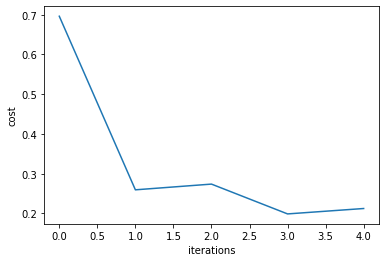

In [23]:
learning_rate = 0.3
num_iterations = 20000 + 1
layers_dims = [train_X.shape[0], 100, 10, 1]
parameters = model_with_dropout(train_X, train_Y, layers_dims, learning_rate, num_iterations, keep_rate = 0.6)

Accuracy of the model on Train dataset is :  95.26 %
Accuracy of the model on Test dataset is :  94.5 %


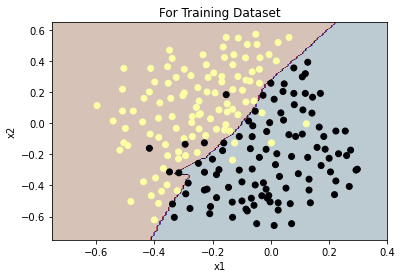

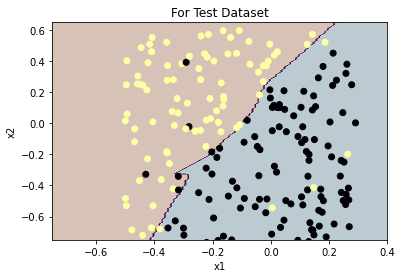

In [24]:
accuracy(train_X, train_Y, parameters, "Train")
accuracy(test_X, test_Y, parameters, "Test")

plt.title("For Training Dataset")
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), train_X, train_Y)

plt.title("For Test Dataset")
plot_decision_boundary(lambda x: predict_dec(parameters, x.T), test_X, test_Y)